<a href="https://colab.research.google.com/github/matidesalegn/Week1/blob/task-3/notebooks/financial_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Task 1

## Import necessary libraries

In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import datetime
import warnings

# Download NLTK resources
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')

# Set up Seaborn
sns.set(style="whitegrid")

# Ignore warnings
warnings.filterwarnings("ignore")

# Load the dataset
data_path = "../data/raw_analyst_ratings.csv"
df = pd.read_csv(data_path)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\matiwos.desalegn\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\matiwos.desalegn\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\matiwos.desalegn\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Descriptive Statistics

### Display the first few rows of the dataset

In [ ]:
# Display the first few rows of the dataset
df.head()

,Unnamed: 0,headline,url,publisher,date,stock
0,0,Stocks That Hit 52-Week Highs On Friday,https://www.benzinga.com/news/20/06/16190091/s...,Benzinga Insights,2020-06-05 10:30:54-04:00,A
1,1,Stocks That Hit 52-Week Highs On Wednesday,https://www.benzinga.com/news/20/06/16170189/s...,Benzinga Insights,2020-06-03 10:45:20-04:00,A
2,2,71 Biggest Movers From Friday,https://www.benzinga.com/news/20/05/16103463/7...,Lisa Levin,2020-05-26 04:30:07-04:00,A
3,3,46 Stocks Moving In Friday's Mid-Day Session,https://www.benzinga.com/news/20/05/16095921/4...,Lisa Levin,2020-05-22 12:45:06-04:00,A
4,4,B of A Securities Maintains Neutral on Agilent...,https://www.benzinga.com/news/20/05/16095304/b...,Vick Meyer,2020-05-22 11:38:59-04:00,A


### Check the data types and missing values

In [ ]:
# Check the data types and missing values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1407328 entries, 0 to 1407327
Data columns (total 6 columns):
 #   Column      Non-Null Count    Dtype 
---  ------      --------------    ----- 
 0   Unnamed: 0  1407328 non-null  int64 
 1   headline    1407328 non-null  object
 2   url         1407328 non-null  object
 3   publisher   1407328 non-null  object
 4   date        1407328 non-null  object
 5   stock       1407328 non-null  object
dtypes: int64(1), object(5)
memory usage: 64.4+ MB


### The task involves analyzing textual lengths, counting articles per publisher, and studying publication date trends to understand news frequency.

Number of duplicate rows: 0
Missing values:
 Unnamed: 0    0
headline      0
url           0
publisher     0
date          0
stock         0
dtype: int64
Headline Length Statistics:
 count    1.407328e+06
mean     7.312051e+01
std      4.073531e+01
min      3.000000e+00
25%      4.700000e+01
50%      6.400000e+01
75%      8.700000e+01
max      5.120000e+02
Name: headline_length, dtype: float64
Number of articles per publisher:
 publisher
Paul Quintaro        228373
Lisa Levin           186979
Benzinga Newsdesk    150484
Charles Gross         96732
Monica Gerson         82380
Name: count, dtype: int64
Publication Date Counts:
 publication_date
2009-02-14    1
2009-04-27    2
2009-04-29    1
2009-05-22    1
2009-05-27    6
Name: count, dtype: int64


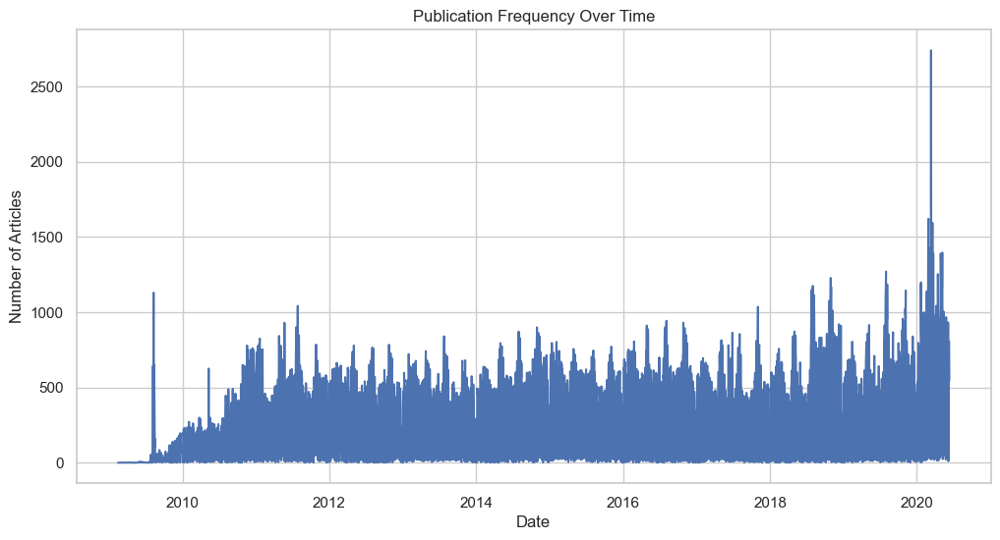

In [ ]:
# Convert 'date' column to datetime format
# df['date'] = pd.to_datetime(df['date'], format="%Y-%m-%d %H:%M:%S", utc=True)
df['date'] = pd.to_datetime(df['date'], format='ISO8601')
# Check for duplicate rows
duplicate_rows = df[df.duplicated()]
print("Number of duplicate rows:", duplicate_rows.shape[0])

# Drop duplicate rows if any
df = df.drop_duplicates()

# Check for missing values
missing_values = df.isnull().sum()
print("Missing values:\n", missing_values)

# Drop rows with missing values
df = df.dropna()

# Basic statistics for textual lengths (headline length)
df['headline_length'] = df['headline'].apply(lambda x: len(str(x)))
headline_stats = df['headline_length'].describe()
print("Headline Length Statistics:\n", headline_stats)

# Count the number of articles per publisher
publisher_counts = df['publisher'].value_counts()
print("Number of articles per publisher:\n", publisher_counts.head())

# Analyze the publication dates to see trends over time
df['publication_date'] = df['date'].dt.date
date_counts = df['publication_date'].value_counts().sort_index()
print("Publication Date Counts:\n", date_counts.head())

# Plot publication frequency over time
plt.figure(figsize=(12, 6))
date_counts.plot(kind='line')
plt.title('Publication Frequency Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Articles')
plt.show()

## Text Analysis(Sentiment analysis & Topic Modeling) Using NLTK and VADER model

### Sentiment Analysis

Sentiment Counts:
 sentiment_category
neutral     731893
positive    448740
negative    226695
Name: count, dtype: int64


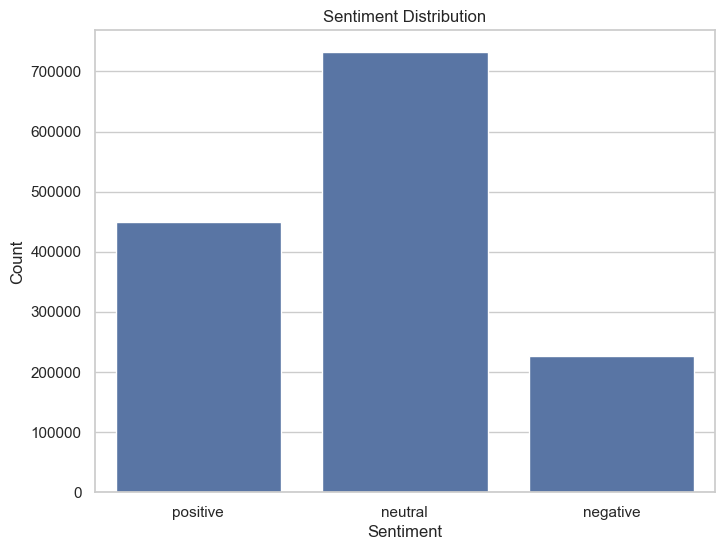

In [ ]:
# Initialize the Sentiment Intensity Analyzer
sid = SentimentIntensityAnalyzer()

# Perform sentiment analysis on headlines
df['sentiment'] = df['headline'].apply(lambda x: sid.polarity_scores(x)['compound'])

# Categorize sentiment
df['sentiment_category'] = df['sentiment'].apply(lambda x: 'positive' if x > 0 else ('negative' if x < 0 else 'neutral'))

# Count sentiment categories
sentiment_counts = df['sentiment_category'].value_counts()
print("Sentiment Counts:\n", sentiment_counts)

# Plot sentiment distribution
plt.figure(figsize=(8, 6))
sns.countplot(x='sentiment_category', data=df, order=['positive', 'neutral', 'negative'])
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.show()

### Topic Modeling using Latent Dirichlet Allocation (LDA).

Top words for each topic:
Topic 1:
vs est eps reports sales sees estimate q4 q1 q2
Topic 2:
pt buy downgrades upgrades target maintains raises price 00 initiates
Topic 3:
stocks market mid week 52 session update day moving pre
Topic 4:
earnings top benzinga stocks scheduled may watch 2018 analyst etfs
Topic 5:
shares trading says us companies higher announces stock lower several


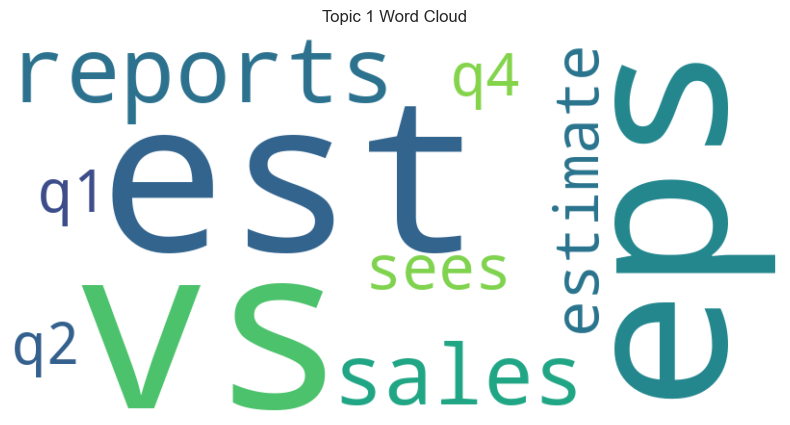

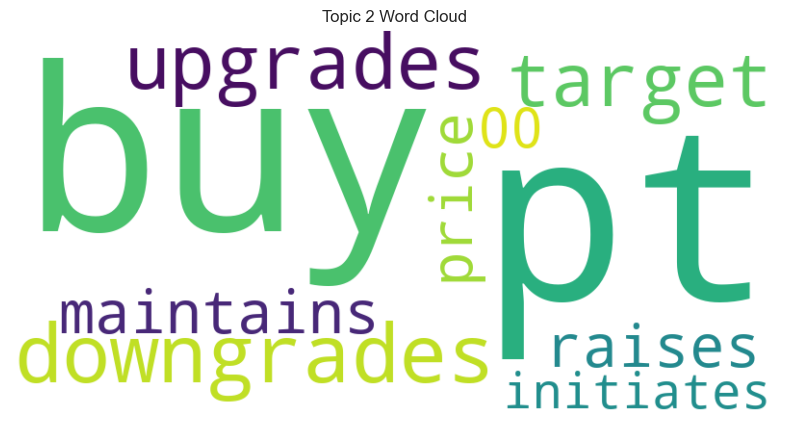

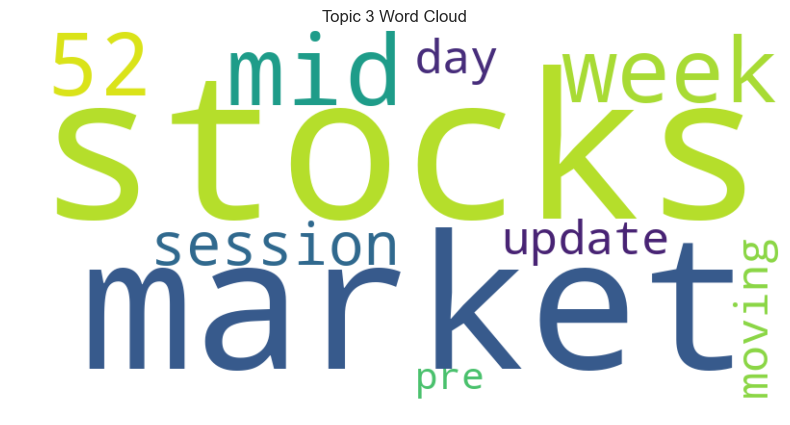

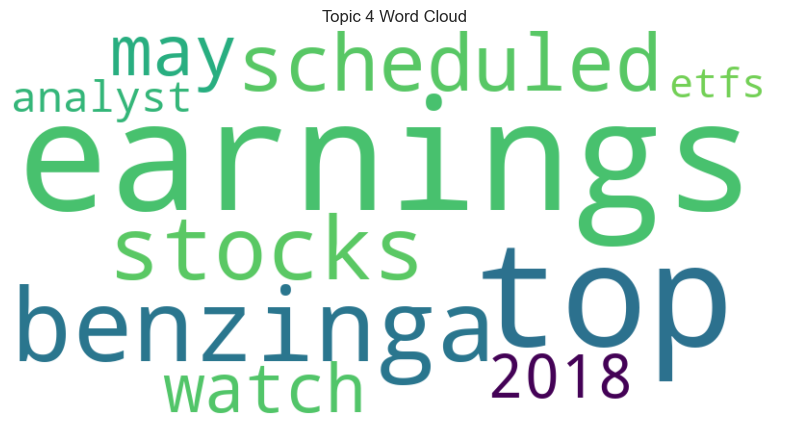

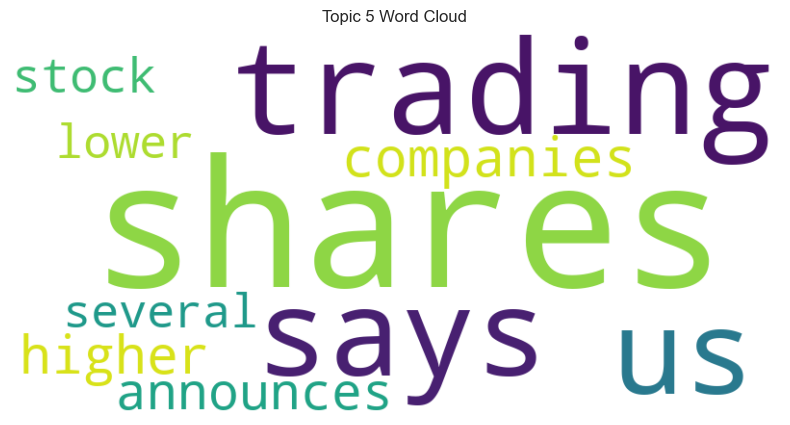

In [ ]:
# Tokenize words in headlines
df['tokens'] = df['headline'].apply(lambda x: word_tokenize(x.lower()))

# Remove stopwords
stop_words = set(stopwords.words('english'))
df['filtered_tokens'] = df['tokens'].apply(lambda x: [word for word in x if word not in stop_words])

# Convert tokens back to string for CountVectorizer
df['clean_headline'] = df['filtered_tokens'].apply(lambda x: ' '.join(x))

# Vectorize text using CountVectorizer
vectorizer = CountVectorizer(max_features=1000)
X = vectorizer.fit_transform(df['clean_headline'])

# Perform Latent Dirichlet Allocation (LDA)
lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda.fit(X)

# Display top words for each topic
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic %d:" % (topic_idx + 1))
        print(" ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))

no_top_words = 10
print("Top words for each topic:")
display_topics(lda, vectorizer.get_feature_names_out(), no_top_words)

# Plot word cloud for each topic
def plot_word_cloud(lda_model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(lda_model.components_):
        word_dict = {}
        for i in topic.argsort()[:-no_top_words - 1:-1]:
            word_dict[feature_names[i]] = topic[i]
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_dict)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title('Topic ' + str(topic_idx + 1) + ' Word Cloud')
        plt.show()

plot_word_cloud(lda, vectorizer.get_feature_names_out(), no_top_words)

### VADER Seniment Scoring

In [ ]:
# Initialize the Sentiment Intensity Analyzer
sid = SentimentIntensityAnalyzer()

# Perform sentiment analysis on headlines
df['sentiment'] = df['headline'].apply(lambda x: sid.polarity_scores(x))

# Extract negative, neutral, and positive scores
df['neg'] = df['sentiment'].apply(lambda x: x['neg'])
df['neu'] = df['sentiment'].apply(lambda x: x['neu'])
df['pos'] = df['sentiment'].apply(lambda x: x['pos'])

#### Plot VADER results

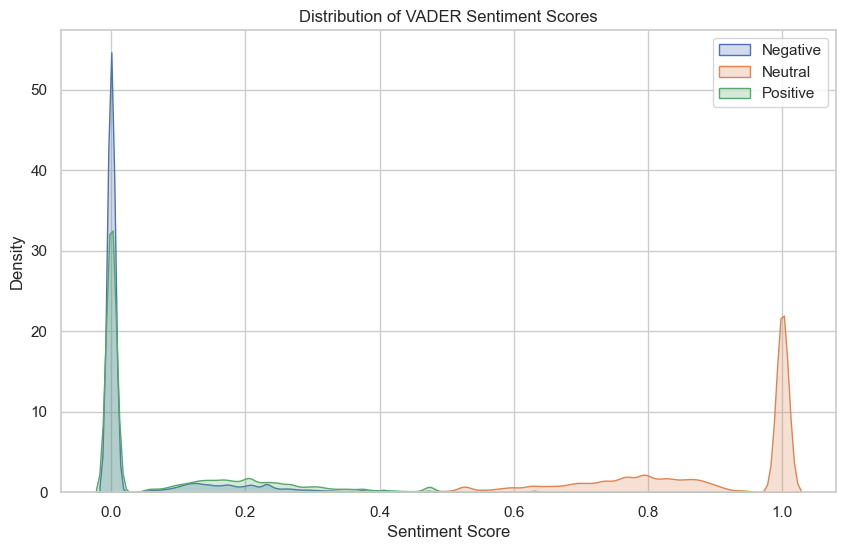

In [ ]:
# Plot VADER results
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df['neg'], label='Negative', shade=True)
sns.kdeplot(data=df['neu'], label='Neutral', shade=True)
sns.kdeplot(data=df['pos'], label='Positive', shade=True)
plt.title('Distribution of VADER Sentiment Scores')
plt.xlabel('Sentiment Score')
plt.ylabel('Density')
plt.legend()
plt.show()

## Time Series Analysis

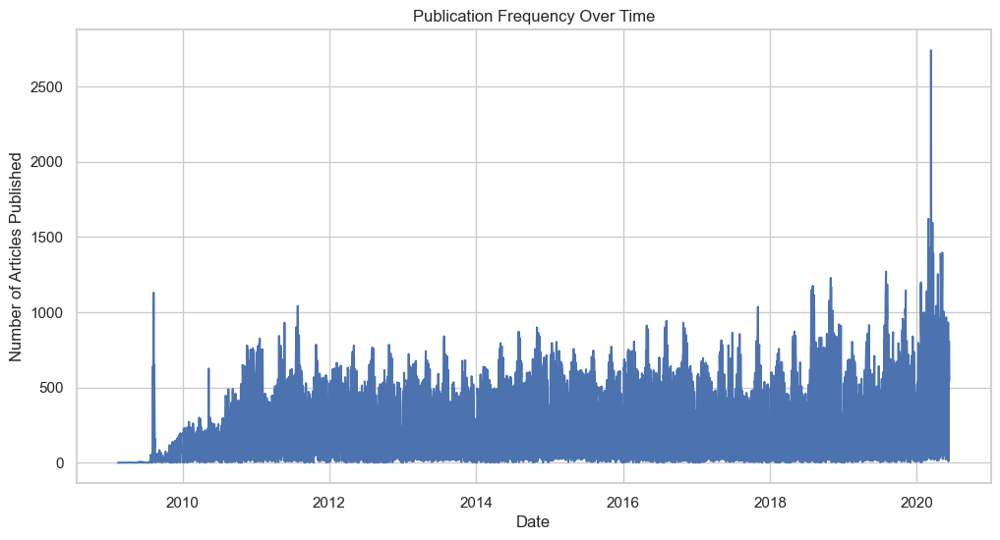

In [ ]:
# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'], format='ISO8601')
# Group data by publication date and count the number of articles published each day
publication_frequency = df.groupby(df['date'].dt.date).size()

# Plot publication frequency over time
plt.figure(figsize=(12, 6))
publication_frequency.plot(kind='line')
plt.title('Publication Frequency Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Articles Published')
plt.grid(True)
plt.show()

### Identify spikes in article publications related to specific market events.

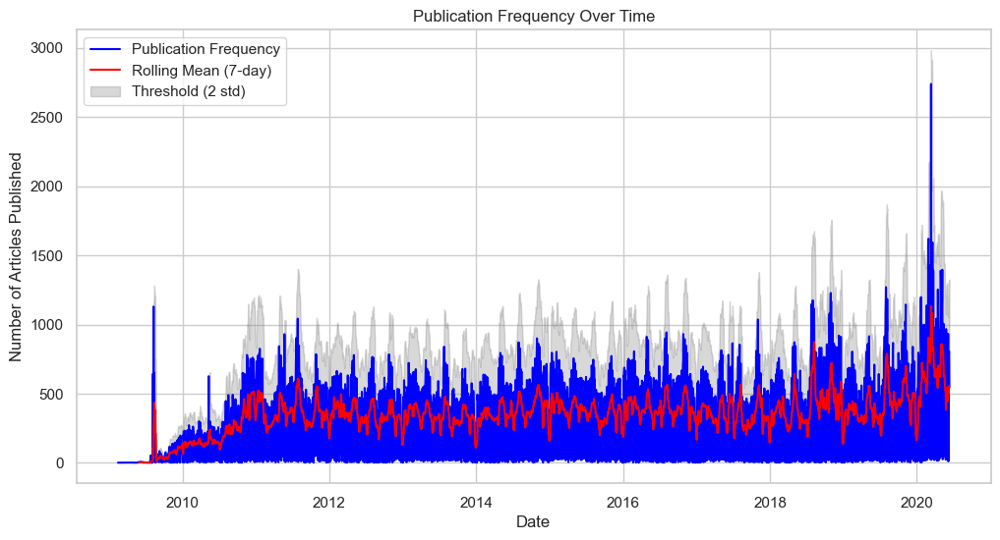

In [ ]:
# Group data by publication date and count the number of articles published each day
publication_frequency = df.groupby(df['date'].dt.date).size()

# Calculate rolling mean and standard deviation to identify spikes
rolling_mean = publication_frequency.rolling(window=7).mean()
rolling_std = publication_frequency.rolling(window=7).std()

# Define threshold for spikes (e.g., 2 standard deviations from the mean)
threshold = rolling_mean + (2 * rolling_std)

# Plot publication frequency over time
plt.figure(figsize=(12, 6))
plt.plot(publication_frequency.index, publication_frequency, label='Publication Frequency', color='blue')
plt.plot(rolling_mean.index, rolling_mean, label='Rolling Mean (7-day)', color='red')
plt.fill_between(rolling_std.index, threshold, rolling_mean, color='gray', alpha=0.3, label='Threshold (2 std)')
plt.title('Publication Frequency Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Articles Published')
plt.legend()
plt.grid(True)

# Overlay significant market events on the plot (if available)
# For example:
# plt.axvline(x='2023-01-01', color='green', linestyle='--', label='Market Event 1')
# plt.axvline(x='2023-03-15', color='orange', linestyle='--', label='Market Event 2')

plt.show()

## Publisher Analysis

In [ ]:
# Extract unique domains from publishers (if email addresses used)
df['publisher_domain'] = df['publisher'].str.split('@').str[-1]

# Count articles per unique publisher domain
publisher_domain_counts = df['publisher_domain'].value_counts()
print("Number of articles per unique publisher domain:\n", publisher_domain_counts.head())


Number of articles per unique publisher domain:
 publisher_domain
Paul Quintaro        228373
Lisa Levin           186979
Benzinga Newsdesk    150484
Charles Gross         96732
Monica Gerson         82380
Name: count, dtype: int64


### Difference in News Type

<Figure size 1200x600 with 0 Axes>

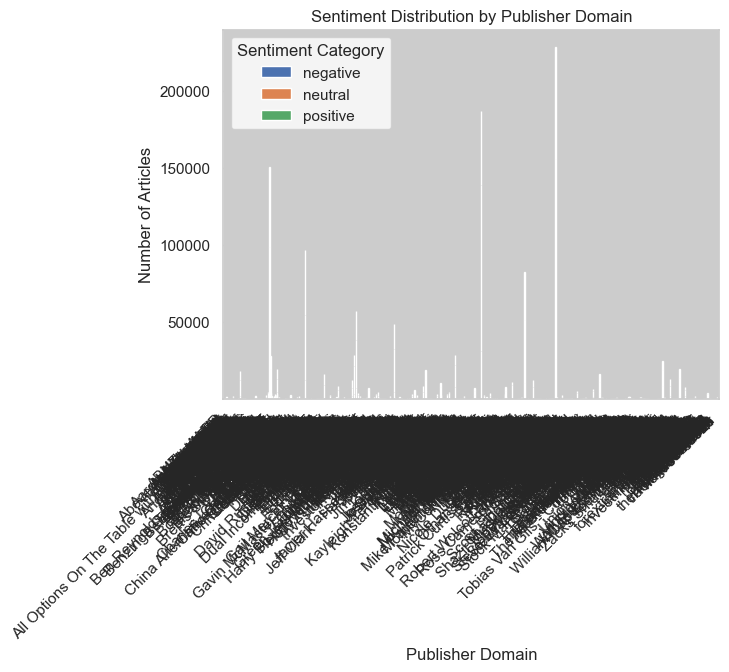

In [ ]:
# Group data by publisher domain and sentiment category, and count the number of articles
publisher_sentiment_counts = df.groupby(['publisher_domain', 'sentiment_category']).size().unstack(fill_value=0)

# Plot stacked bar chart to visualize sentiment distribution by publisher domain
plt.figure(figsize=(12, 6))
publisher_sentiment_counts.plot(kind='bar', stacked=True)
plt.title('Sentiment Distribution by Publisher Domain')
plt.xlabel('Publisher Domain')
plt.ylabel('Number of Articles')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Sentiment Category')
plt.show()


### Identify unique domains from email addresses used as publisher names:

In [ ]:
# Filter publisher names that contain '@' to identify email addresses
email_publishers = df[df['publisher'].str.contains('@')]

# Extract unique domains from email publishers
email_publishers['publisher_domain'] = email_publishers['publisher'].str.split('@').str[-1]

# Count articles per unique publisher domain
email_publisher_domain_counts = email_publishers['publisher_domain'].value_counts()

print("Number of articles per unique email publisher domain:\n", email_publisher_domain_counts.head())

Number of articles per unique email publisher domain:
 publisher_domain
benzinga.com      7937
gmail.com          139
andyswan.com         5
investdiva.com       2
tothetick.com        2
Name: count, dtype: int64


# Task 2

## Stock price fetching using yfinance

In [5]:
import pandas as pd
import yfinance as yf

# Load your dataset
df = pd.read_csv("raw_analyst_ratings.csv")

# Convert the 'date' column to datetime objects
# df['date'] = pd.to_datetime(df['date'])

# Convert the 'date' column to datetime objects
df['date'] = pd.to_datetime(df['date'], format='ISO8601', utc=True)
# If 'date' column is timezone-aware, convert it to timezone-naive
df['date'] = df['date'].dt.tz_convert(None)


# Group your data based on the stock symbol and get the date range
grouped_data = df.groupby('stock')['date'].agg(['min', 'max'])

# Initialize an empty DataFrame to store all stock data
all_stock_data = pd.DataFrame()

# Loop through date ranges and download stock data for each symbol
for index, row in grouped_data.iterrows():
    stock_symbol = index
    start_date = row['min']
    end_date = row['max']

    try:
        # Download stock data
        stock_data = yf.download(stock_symbol, start=start_date, end=end_date)

        # Add stock symbol as a column in the DataFrame
        stock_data['Symbol'] = stock_symbol

        # Append stock data to the DataFrame containing all stock data
        all_stock_data = pd.concat([all_stock_data, stock_data])

        print("Stock data for", stock_symbol, "downloaded successfully.")
    except Exception as e:
        print("Failed to download stock data for", stock_symbol, ":", str(e))

# Save all stock data to a single CSV file
all_stock_data.to_csv('all_stock_data.csv')

[*********************100%%**********************]  1 of 1 completed


Stock data for A downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AAC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for AAC downloaded successfully.
Stock data for AADR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AAL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AAMC']: Exception("%ticker%: Data doesn't exist for startDate = 1393390800, endDate = 1589212031")


Stock data for AAMC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AAME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AAN']: Exception("%ticker%: Data doesn't exist for startDate = 1249876800, endDate = 1591814194")
[*********************100%%**********************]  1 of 1 completed


Stock data for AAN downloaded successfully.
Stock data for AAOI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AAON downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AAP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AAPL downloaded successfully.
Stock data for AAU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AAV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-12 00:00:00 -> 2019-08-02 13:03:44)')


Stock data for AAV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AAVL']: Exception("%ticker%: Data doesn't exist for startDate = 1405915200, endDate = 1462546876")


Stock data for AAVL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AAWW']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AAWW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AAXJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ABAC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-08-21 00:00:00 -> 2019-01-15 09:57:56)')


Stock data for AB downloaded successfully.
Stock data for ABAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ABAX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ABB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ABB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ABBV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ABC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ABC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ABCB downloaded successfully.
Stock data for ABCD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ABCW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-02 00:00:00 -> 2016-01-29 14:04:28)')


Stock data for ABCO downloaded successfully.
Stock data for ABCW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ABDC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ABDC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ABEV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ABGB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-10-17 00:00:00 -> 2016-04-06 12:39:43)')


Stock data for ABG downloaded successfully.
Stock data for ABGB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ABIO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ABM downloaded successfully.
Stock data for ABMD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ABTL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-06-27 00:00:00 -> 2017-10-09 13:03:17)')


Stock data for ABR downloaded successfully.
Stock data for ABTL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ABX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-02 00:00:00 -> 2019-08-02 12:13:19)')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ABY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-06-02 00:00:00 -> 2017-11-13 13:23:17)')


Stock data for ABX downloaded successfully.
Stock data for ABY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACAS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-04 00:00:00 -> 2016-12-15 21:18:39)')


Stock data for ACAD downloaded successfully.
Stock data for ACAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACAT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-15 00:00:00 -> 2017-04-10 10:50:43)')


Stock data for ACAT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ACC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACCU']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for ACCO downloaded successfully.
Stock data for ACCU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACE']: Exception("%ticker%: Data doesn't exist for startDate = 1250049600, endDate = 1455675676")
[*********************100%%**********************]  1 of 1 completed


Stock data for ACE downloaded successfully.
Stock data for ACET downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ACFC downloaded successfully.
Stock data for ACFN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACG']: Exception("%ticker%: Data doesn't exist for startDate = 1403744868, endDate = 1440806830")


Stock data for ACG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ACGL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACH']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for ACH downloaded successfully.
Stock data for ACHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACHN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ACHN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ACIW downloaded successfully.
Stock data for ACLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACMP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-08-09 00:00:00 -> 2015-01-26 21:53:15)')


Stock data for ACM downloaded successfully.
Stock data for ACMP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ACN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ACNB downloaded successfully.
Stock data for ACOR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACPW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-22 00:00:00 -> 2016-09-30 13:15:34)')


Stock data for ACP downloaded successfully.
Stock data for ACPW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ACRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACRX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ACRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACSF']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for ACSF downloaded successfully.
Stock data for ACST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACT']: Exception("%ticker%: Data doesn't exist for startDate = 1360558800, endDate = 1585262979")
[*********************100%%**********************]  1 of 1 completed


Stock data for ACT downloaded successfully.
Stock data for ACTA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACTS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-08-05 00:00:00 -> 2016-09-12 20:32:31)')


Stock data for ACTG downloaded successfully.
Stock data for ACTS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ACU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ACUR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ACWI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ACWV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACXM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2018-09-25 13:06:40)')


Stock data for ACWX downloaded successfully.
Stock data for ACXM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ACY']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADAT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-08 00:00:00 -> 2016-03-04 14:00:43)')


Stock data for ACY downloaded successfully.
Stock data for ADAT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ADBE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADEP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-19 00:00:00 -> 2015-10-09 10:06:28)')


Stock data for ADC downloaded successfully.
Stock data for ADEP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADES']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADGE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-12-09 00:00:00 -> 2017-04-13 13:25:32)')


Stock data for ADES downloaded successfully.
Stock data for ADGE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADHD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-01-14 00:00:00 -> 2017-11-09 12:19:44)')


Stock data for ADHD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ADI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADK']: Exception("%ticker%: Data doesn't exist for startDate = 1282795200, endDate = 1505925972")


Stock data for ADK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ADM downloaded successfully.
Stock data for ADMA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADMP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ADMP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADMS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADNC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-05-10 00:00:00 -> 2015-05-01 00:00:08)')


Stock data for ADMS downloaded successfully.
Stock data for ADNC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ADP downloaded successfully.
Stock data for ADPT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADRA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADRD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-03-05 19:42:46 -> 2013-03-05 19:42:46)')


Stock data for ADRA downloaded successfully.
Stock data for ADRD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ADRE downloaded successfully.
Stock data for ADRU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ADS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ADSK downloaded successfully.
Stock data for ADT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADVS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-19 00:00:00 -> 2015-05-18 08:15:28)')


Stock data for ADTN downloaded successfully.
Stock data for ADVS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ADX downloaded successfully.
Stock data for ADXS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ADZ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-02-09 22:02:36 -> 2012-02-09 22:02:36)')


Stock data for ADZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AE downloaded successfully.
Stock data for AEB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AEC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-02-04 00:00:00 -> 2015-06-08 17:16:46)')


Stock data for AEC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AEE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AEG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AEGN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AEGR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-03-28 00:00:00 -> 2016-11-17 21:19:41)')


Stock data for AEGN downloaded successfully.
Stock data for AEGR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AEHR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AEIS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AEL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AEM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AEPI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-09 00:00:00 -> 2017-06-14 19:48:04)')


Stock data for AEO downloaded successfully.
Stock data for AEPI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AER downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AERI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AERI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AES downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AET downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AETI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AETI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AEY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AEY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2017-09-26 21:52:00)')


Stock data for AEZS downloaded successfully.
Stock data for AF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AFA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AFA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AFAM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AFB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AFC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AFFX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2016-03-31 14:31:01)')


Stock data for AFCB downloaded successfully.
Stock data for AFFX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AFG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AFH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AFH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AFK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AFL downloaded successfully.
Stock data for AFMD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AFOP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-04 00:00:00 -> 2016-04-20 10:59:34)')
[*********************100%%**********************]  1 of 1 completed

Stock data for AFOP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AFSI downloaded successfully.
Stock data for AFT downloaded successfully.
Stock data for AG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AGA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AGC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AGC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AGCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AGD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AGEN downloaded successfully.
Stock data for AGF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AGII']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-11 00:00:00 -> 2018-04-23 20:45:05)')


Stock data for AGG downloaded successfully.
Stock data for AGII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AGIO downloaded successfully.
Stock data for AGM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AGN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AGNC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AGNCB']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for AGNCB downloaded successfully.
Stock data for AGND downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AGO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AGOL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AGOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AGQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AGRO downloaded successfully.
Stock data for AGRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AGTC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AGU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-14 00:00:00 -> 2018-01-02 12:06:26)')


Stock data for AGTC downloaded successfully.
Stock data for AGU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AGX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AGYS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AHC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AHGP downloaded successfully.
Stock data for AHH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AHP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-12-03 00:00:00 -> 2018-04-09 12:07:13)')


Stock data for AHL downloaded successfully.
Stock data for AHP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AHPI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AHPI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AHT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AI']: Exception("%ticker%: Data doesn't exist for startDate = 1250049600, endDate = 1589220020")


Stock data for AI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AIA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AIB']: Exception("%ticker%: Data doesn't exist for startDate = 1249876800, endDate = 1387308393")
[*********************100%%**********************]  1 of 1 completed

Stock data for AIB downloaded successfully.


Stock data for AIF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AIG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AIMC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AIMC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AIN downloaded successfully.
Stock data for AINC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AINV']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for AINV downloaded successfully.
Stock data for AIQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AIRM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-11 00:00:00 -> 2017-03-14 15:45:04)')


Stock data for AIR downloaded successfully.
Stock data for AIRM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AIRT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AIT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AIXG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-07-31 00:00:00 -> 2016-12-30 17:19:08)')


Stock data for AIV downloaded successfully.
Stock data for AIXG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AIZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AJG downloaded successfully.
Stock data for AKAM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AKAO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for AKAO downloaded successfully.
Stock data for AKBA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AKER']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AKER downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AKG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AKG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AKP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AKP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AKR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AKRX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AKRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AKS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AKS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ALB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ALCO downloaded successfully.
Stock data for ALD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ALDR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ALDW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-11-09 00:00:00 -> 2017-11-08 22:20:02)')


Stock data for ALDR downloaded successfully.
Stock data for ALDW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ALDX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ALE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ALEX downloaded successfully.
Stock data for ALFA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ALG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ALGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ALGT downloaded successfully.
Stock data for ALIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ALJ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-09 00:00:00 -> 2017-06-29 14:12:07)')


Stock data for ALJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ALK downloaded successfully.
Stock data for ALKS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ALLB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-12-14 21:39:49 -> 2015-03-03 14:52:20)')


Stock data for ALL downloaded successfully.
Stock data for ALLB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ALLE downloaded successfully.
Stock data for ALLT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ALLY downloaded successfully.
Stock data for ALNY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ALOG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ALOT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ALQA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ALQA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ALR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ALR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ALSK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ALSK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ALSN downloaded successfully.
Stock data for ALTR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ALTV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-08-11 21:06:16 -> 2014-08-12 18:17:19)')


Stock data for ALTV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ALU']: Exception("%ticker%: Data doesn't exist for startDate = 1249876800, endDate = 1509405310")


Stock data for ALU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ALV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ALXA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-27 00:00:00 -> 2016-06-22 19:14:49)')


Stock data for ALX downloaded successfully.
Stock data for ALXA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ALXN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for ALXN downloaded successfully.
Stock data for AM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMAG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AMAG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AMAT downloaded successfully.
Stock data for AMBA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AMBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMBR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for AMBR downloaded successfully.
Stock data for AMC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMCC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-30 00:00:00 -> 2016-12-13 21:06:42)')
[*********************100%%**********************]  1 of 1 completed

Stock data for AMCC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMCO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for AMCF downloaded successfully.
Stock data for AMCO downloaded successfully.
Stock data for AMCX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMDA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-01-29 00:00:00 -> 2018-10-31 13:07:58)')


Stock data for AMD downloaded successfully.
Stock data for AMDA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AME downloaded successfully.
Stock data for AMED downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMFW']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for AMFW downloaded successfully.
Stock data for AMGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMIC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-15 00:00:00 -> 2016-08-31 12:22:34)')


Stock data for AMH downloaded successfully.
Stock data for AMIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMID']: Exception("%ticker%: Data doesn't exist for startDate = 1310961600, endDate = 1563198895")


Stock data for AMID downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AMJ downloaded successfully.
Stock data for AMKR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AMNB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMOT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AMOT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMOV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AMOV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AMP downloaded successfully.
Stock data for AMPE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AMPH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMPS']: Exception("%ticker%: Data doesn't exist for startDate = 1337647521, endDate = 1341272668")


Stock data for AMPS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMRB']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for AMRB downloaded successfully.
Stock data for AMRC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMRE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-09-05 00:00:00 -> 2015-01-22 14:40:50)')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMRI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-04-07 00:00:00 -> 2017-08-29 16:45:53)')


Stock data for AMRE downloaded successfully.
Stock data for AMRI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AMRK downloaded successfully.
Stock data for AMRN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMRS']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")
[*********************100%%**********************]  1 of 1 completed


Stock data for AMRS downloaded successfully.
Stock data for AMSC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMSG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-11-09 13:50:50 -> 2016-12-05 09:42:22)')


Stock data for AMSG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AMSWA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AMT downloaded successfully.
Stock data for AMTD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMTG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-22 00:00:00 -> 2016-08-24 13:27:07)')
[*********************100%%**********************]  1 of 1 completed


Stock data for AMTG downloaded successfully.
Stock data for AMTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AMWD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AMX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AMZG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-11-18 00:00:00 -> 2015-05-11 18:58:34)')


Stock data for AMZA downloaded successfully.
Stock data for AMZG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AMZN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ANAC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ANAD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-19 00:00:00 -> 2017-04-11 11:09:09)')


Stock data for ANAC downloaded successfully.
Stock data for ANAD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ANAT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for ANAT downloaded successfully.
Stock data for ANCB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ANCI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-20 00:00:00 -> 2016-03-04 20:50:50)')


Stock data for ANCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ANCX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AND']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for AND downloaded successfully.
Stock data for ANET downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ANF downloaded successfully.
Stock data for ANGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ANGL downloaded successfully.
Stock data for ANGO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ANH']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for ANH downloaded successfully.
Stock data for ANIP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ANSS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ANTH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ANTM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ANTM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ANW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-17 00:00:00 -> 2018-11-20 09:26:40)')


Stock data for ANV downloaded successfully.
Stock data for ANW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ANY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AOI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-14 00:00:00 -> 2018-09-12 09:20:02)')


Stock data for AOD downloaded successfully.
Stock data for AOI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AOL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-12 00:00:00 -> 2017-02-14 22:40:07)')


Stock data for AOK downloaded successfully.
Stock data for AOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AON downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AOS downloaded successfully.
Stock data for AOSL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['APAGF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-22 10:59:47 -> 2014-10-03 11:27:08)')


Stock data for AP downloaded successfully.
Stock data for APAGF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for APAM downloaded successfully.
Stock data for APB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['APC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for APC downloaded successfully.
Stock data for APEI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['APF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for APF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for APH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['API']: Exception("%ticker%: Data doesn't exist for startDate = 1249617600, endDate = 1438704229")


Stock data for API downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['APL']: Exception("%ticker%: Data doesn't exist for startDate = 1269489600, endDate = 1476202309")


Stock data for APL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for APO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['APOL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-03-27 00:00:00 -> 2017-02-01 15:52:34)')


Stock data for APOG downloaded successfully.
Stock data for APOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['APP']: Exception("%ticker%: Data doesn't exist for startDate = 1268712000, endDate = 1478667378")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['APPY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-29 00:00:00 -> 2016-12-01 17:45:25)')


Stock data for APP downloaded successfully.
Stock data for APPY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['APRI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-29 00:00:00 -> 2019-01-25 12:38:05)')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['APSA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-07 13:49:32 -> 2014-06-26 16:41:33)')


Stock data for APRI downloaded successfully.
Stock data for APSA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for APTO downloaded successfully.
Stock data for APWC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AQQ']: Exception("%ticker%: Data doesn't exist for startDate = 1290488400, endDate = 1424385943")


Stock data for AQQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AQXP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for AQXP downloaded successfully.
Stock data for AR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ARAY downloaded successfully.
Stock data for ARC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARCB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARCI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ARCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARCW']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARCX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-11-05 00:00:00 -> 2017-12-18 21:46:16)')


Stock data for ARCW downloaded successfully.
Stock data for ARCX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARDC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARDM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ARDM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARDX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARES downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AREX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARGS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-02-07 00:00:00 -> 2018-04-19 17:13:25)')


Stock data for AREX downloaded successfully.
Stock data for ARGS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARGT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARIA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-09 00:00:00 -> 2017-04-12 10:48:43)')


Stock data for ARI downloaded successfully.
Stock data for ARIA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARIS']: Exception("%ticker%: Data doesn't exist for startDate = 1387170000, endDate = 1498157708")
[*********************100%%**********************]  1 of 1 completed


Stock data for ARIS downloaded successfully.
Stock data for ARKG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ARKK downloaded successfully.
Stock data for ARKQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ARKR downloaded successfully.
Stock data for ARKW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARMH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-19 00:00:00 -> 2017-05-23 17:42:58)')


Stock data for ARLP downloaded successfully.
Stock data for ARMH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARMK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARNA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-06 00:00:00 -> 2016-04-22 11:02:55)')


Stock data for ARNA downloaded successfully.
Stock data for ARO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARPI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-06-03 00:00:00 -> 2015-12-04 16:29:55)')


Stock data for AROW downloaded successfully.
Stock data for ARPI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARQL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ARQL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARRS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ARRS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARRY']: Exception("%ticker%: Data doesn't exist for startDate = 1252036800, endDate = 1564503705")


Stock data for ARRY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARTNA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ARTW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ARTX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ARTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ARW downloaded successfully.


Stock data for ARWR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ASA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ASBI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-27 00:00:00 -> 2015-10-22 11:33:43)')


Stock data for ASB downloaded successfully.
Stock data for ASBI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ASC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ASCMA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ASCMA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ASEA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ASFI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ASFI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ASGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ASH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ASHR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ASHS downloaded successfully.
Stock data for ASMB downloaded successfully.

[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ASMI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-18 00:00:00 -> 2017-03-03 15:45:08)')



Stock data for ASMI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ASML downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ASNA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for ASNA downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ASPX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-02-05 00:00:00 -> 2015-03-31 09:54:31)')


Stock data for ASPS downloaded successfully.
Stock data for ASPX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ASR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ASRV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AST']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ASTC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ASTE downloaded successfully.


Stock data for ASUR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ASX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ASYS downloaded successfully.
Stock data for AT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATAX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-03 00:00:00 -> 2015-11-25 19:40:14)')


Stock data for ATAX downloaded successfully.
Stock data for ATE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ATEC downloaded successfully.
Stock data for ATEN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ATHM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATHN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ATHN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATHX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ATHX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-28 00:00:00 -> 2015-03-04 20:50:44)')


Stock data for ATI downloaded successfully.
Stock data for ATK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ATL downloaded successfully.
Stock data for ATLC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ATLO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATLS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATML']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-16 00:00:00 -> 2017-04-04 14:28:21)')


Stock data for ATLS downloaded successfully.
Stock data for ATML downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ATMP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for ATNI downloaded successfully.
Stock data for ATNM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATNY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-20 00:00:00 -> 2016-02-29 19:42:40)')
[*********************100%%**********************]  1 of 1 completed


Stock data for ATNY downloaded successfully.
Stock data for ATRA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ATRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ATRI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATRM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ATRM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ATRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATRS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for ATRS downloaded successfully.


Stock data for ATSG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATTO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ATTO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATTU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ATTU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ATU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ATV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ATVI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for ATVI downloaded successfully.
Stock data for ATW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AUBN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AUMA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-10-06 12:36:43 -> 2016-10-06 12:36:43)')


Stock data for AUDC downloaded successfully.
Stock data for AUMA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AUMAU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-10-02 14:39:02 -> 2014-10-02 15:23:51)')
[*********************100%%**********************]  1 of 1 completed


Stock data for AUMAU downloaded successfully.
Stock data for AUMN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AUQ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-16 00:00:00 -> 2015-08-18 11:32:59)')


Stock data for AUPH downloaded successfully.
Stock data for AUQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AUXL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-16 00:00:00 -> 2015-01-21 11:11:03)')


Stock data for AUXL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AUY']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-09 00:00:00 -> 2016-09-07 12:57:26)')


Stock data for AUY downloaded successfully.
Stock data for AV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AVA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AVAL downloaded successfully.
Stock data for AVAV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AVB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AVD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AVEO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AVEO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AVG']: Exception("%ticker%: Data doesn't exist for startDate = 1328158800, endDate = 1470703513")


Stock data for AVG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AVGO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AVH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AVH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AVHI']: Exception("%ticker%: Data doesn't exist for startDate = 1332734400, endDate = 1533173054")


Stock data for AVHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AVID']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AVID downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AVIV']: Exception("%ticker%: Data doesn't exist for startDate = 1363838400, endDate = 1427949766")


Stock data for AVIV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AVK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AVL']: Exception("%ticker%: Data doesn't exist for startDate = 1294117200, endDate = 1441215831")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AVNR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-13 00:00:00 -> 2016-06-09 21:30:32)')


Stock data for AVL downloaded successfully.
Stock data for AVNR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AVNW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AVOL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AVOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AVP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AVP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AVT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AVX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AVX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AVY downloaded successfully.
Stock data for AWAY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AWF downloaded successfully.
Stock data for AWH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AWI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AWK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AWP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AWR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AWRE downloaded successfully.
Stock data for AWX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AXAS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for AXAS downloaded successfully.
Stock data for AXDX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AXE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AXE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AXGN downloaded successfully.
Stock data for AXJL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for AXJS downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AXLL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-02-28 00:00:00 -> 2016-03-10 11:54:45)')


Stock data for AXL downloaded successfully.
Stock data for AXLL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AXN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-01-24 00:00:00 -> 2016-06-30 15:29:19)')


Stock data for AXN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AXPW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-11-15 00:00:00 -> 2015-10-07 14:03:09)')


Stock data for AXP downloaded successfully.
Stock data for AXPW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AXR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AXS downloaded successfully.
Stock data for AXTA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AXTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AXU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AXU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AXX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for AXX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AYI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AYR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AZIA']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for AYR downloaded successfully.
Stock data for AZIA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for AZN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for AZO downloaded successfully.


Stock data for AZPN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for AZZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for B downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BAA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-05 00:00:00 -> 2018-03-09 20:35:23)')


Stock data for BA downloaded successfully.
Stock data for BAA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BAB downloaded successfully.
Stock data for BABA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BABS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BABY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BABY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BAF']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BAGR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-05-07 00:00:00 -> 2015-11-05 21:46:19)')


Stock data for BAF downloaded successfully.
Stock data for BAGR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BAH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BAK downloaded successfully.
Stock data for BAL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BALT']: Exception("%ticker%: Data doesn't exist for startDate = 1271995200, endDate = 1430786419")


Stock data for BALT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BAM']: Exception("%ticker%: Data doesn't exist for startDate = 1249617600, endDate = 1591727681")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BAMM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-08-19 00:00:00 -> 2020-05-19 14:25:26)')


Stock data for BAM downloaded successfully.
Stock data for BAMM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BANC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BANF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BANR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BANX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BAP downloaded successfully.
Stock data for BAR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BAS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BASI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BASI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BAX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BBBY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BBBY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BBCN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-12-08 00:00:00 -> 2016-07-25 21:22:35)')


Stock data for BBC downloaded successfully.
Stock data for BBCN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BBD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BBDO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BBF']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BBG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-13 00:00:00 -> 2018-03-19 20:02:53)')


Stock data for BBF downloaded successfully.
Stock data for BBG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BBGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BBH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BBK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BBL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BBL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BBLU']: Exception("%ticker%: Data doesn't exist for startDate = 1409716800, endDate = 1452711794")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BBNK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-27 00:00:00 -> 2015-04-20 20:09:44)')


Stock data for BBLU downloaded successfully.
Stock data for BBNK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BBOX downloaded successfully.
Stock data for BBRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BBRY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-12-01 00:00:00 -> 2020-06-08 15:44:14)')


Stock data for BBRY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BBSI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BBT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BBT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for BBVA downloaded successfully.


Stock data for BBW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BBX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for BBX downloaded successfully.
Stock data for BBY downloaded successfully.



[*********************100%%**********************]  1 of 1 completed


Stock data for BC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BCA']: Exception("%ticker%: Data doesn't exist for startDate = 1271908800, endDate = 1458065475")


Stock data for BCA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for BCBP downloaded successfully.


Stock data for BCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BCE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BCH downloaded successfully.
Stock data for BCLI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BCOM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BCOM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BCOR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for BCOR downloaded successfully.
Stock data for BCOV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BCR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2018-03-06 16:37:16)')


Stock data for BCPC downloaded successfully.
Stock data for BCR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BDBD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-02-26 00:00:00 -> 2015-11-30 14:13:52)')


Stock data for BCV downloaded successfully.
Stock data for BDBD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BDC downloaded successfully.
Stock data for BDCL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BDCV']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BDD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-25 22:23:29 -> 2011-05-25 22:23:29)')


Stock data for BDCV downloaded successfully.
Stock data for BDD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BDE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-08 00:00:00 -> 2017-08-07 20:41:21)')


Stock data for BDE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BDGE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BDGE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BDL downloaded successfully.
Stock data for BDMS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BDR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for BDR downloaded successfully.


Stock data for BDSI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BDX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BEAT']: Data doesn't exist for startDate = 1251950400, endDate = 1588811370


Stock data for BEAT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for BEBE downloaded successfully.


Stock data for BECN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BEE']: Exception("%ticker%: Data doesn't exist for startDate = 1269403200, endDate = 1457992497")


Stock data for BEE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BEL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BEL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BELFA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for BEN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed


Stock data for BEP downloaded successfully.
Stock data for BERY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BF.A']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-29 00:00:00 -> 2019-12-05 15:07:11)')


Stock data for BF.A downloaded successfully.
Stock data for BF.B downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BFAM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BFIN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for BFK downloaded successfully.


Stock data for BFOR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BFR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BFR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BFS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BFY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BFY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BFZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for BG downloaded successfully.


Stock data for BGB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BGC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BGCA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BGCA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BGCP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BGCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BGFV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BGG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BGG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BGH downloaded successfully.
Stock data for BGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BGR downloaded successfully.
Stock data for BGSF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BGT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BGY downloaded successfully.
Stock data for BH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BHB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BHBK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BHBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BHE downloaded successfully.
Stock data for BHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BHK downloaded successfully.
Stock data for BHL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BHLB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BHP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BIB downloaded successfully.
Stock data for BICK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BID']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for BID downloaded successfully.


Stock data for BIDU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BIF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BIF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BIG downloaded successfully.
Stock data for BIIB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for BIK downloaded successfully.
Stock data for BIL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BIN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-14 00:00:00 -> 2016-05-18 21:11:33)')
[*********************100%%**********************]  1 of 1 completed


Stock data for BIN downloaded successfully.
Stock data for BIND downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BIOA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-06-11 00:00:00 -> 2018-05-08 11:25:17)')


Stock data for BIO downloaded successfully.
Stock data for BIOA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BIOC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BIOD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-10 00:00:00 -> 2016-10-24 12:59:36)')


Stock data for BIOC downloaded successfully.
Stock data for BIOD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BIOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BIOS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BIOS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BIRT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-01-27 00:00:00 -> 2015-01-16 14:23:04)')


Stock data for BIP downloaded successfully.
Stock data for BIRT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for BIS downloaded successfully.


Stock data for BIT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BITA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for BITA downloaded successfully.


Stock data for BIV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BIZD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BJK downloaded successfully.
Stock data for BJZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BKCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BKE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BKEP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BKEP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BKEPP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BKEPP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BKF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BKH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BKJ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BKJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BKK']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BKMU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-16 00:00:00 -> 2018-01-29 22:24:05)')


Stock data for BKK downloaded successfully.
Stock data for BKMU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BKN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BKS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BKS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BKSC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BKT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BKYF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-16 00:00:00 -> 2014-09-08 14:10:10)')


Stock data for BKU downloaded successfully.
Stock data for BKYF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BLCM downloaded successfully.
Stock data for BLDP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BLDR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BLE downloaded successfully.
Stock data for BLH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BLJ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2018-05-25 21:04:11 -> 2018-05-25 21:04:11)')


Stock data for BLIN downloaded successfully.
Stock data for BLJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BLK downloaded successfully.
Stock data for BLKB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BLL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BLOX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-04-20 00:00:00 -> 2016-11-14 22:46:23)')


Stock data for BLL downloaded successfully.
Stock data for BLOX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BLT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2017-02-02 15:36:16)')


Stock data for BLRX downloaded successfully.
Stock data for BLT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BLUE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BLVD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2017-08-16 11:01:40 -> 2017-11-15 21:41:43)')


Stock data for BLV downloaded successfully.
Stock data for BLVD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BLVDU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-09-22 09:26:29 -> 2015-09-22 09:26:29)')


Stock data for BLVDU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BLW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BLX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for BMA downloaded successfully.


Stock data for BME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BMI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BMO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BMR']: Exception("%ticker%: Data doesn't exist for startDate = 1252900800, endDate = 1586479471")


Stock data for BMR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for BMRC downloaded successfully.


Stock data for BMRN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BMS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BMTC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BMTC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BMY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BNCL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BNCN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-06 00:00:00 -> 2018-02-05 16:30:07)')


Stock data for BNCL downloaded successfully.
Stock data for BNCN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BND downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BNDX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BNFT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BNFT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BNJ']: Exception("%ticker%: Data doesn't exist for startDate = 1527296651, endDate = 1527296651")


Stock data for BNJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BNO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BNS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BNSO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BNSO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BOBE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2018-01-09 14:08:57)')


Stock data for BNY downloaded successfully.
Stock data for BOBE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BOCH']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BOFI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-11 00:00:00 -> 2018-10-01 12:08:36)')


Stock data for BOCH downloaded successfully.
Stock data for BOFI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BOH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BOIL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for BOKF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BONA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-12-09 00:00:00 -> 2016-02-16 15:00:29)')


Stock data for BOM downloaded successfully.
Stock data for BONA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BONE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-03-18 00:00:00 -> 2015-09-09 12:46:46)')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BONT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-20 00:00:00 -> 2018-04-18 08:23:16)')


Stock data for BONE downloaded successfully.
Stock data for BONT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BOOT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BORN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BORN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BOS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BOTA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-04-29 00:00:00 -> 2016-04-12 11:00:56)')


Stock data for BOSC downloaded successfully.
Stock data for BOTA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BOXC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-09-11 00:00:00 -> 2017-06-28 18:10:59)')


Stock data for BOTJ downloaded successfully.
Stock data for BOXC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BPFH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BPFH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BPFHW']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BPFHW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BPI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for BPI downloaded successfully.
Stock data for BPK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BPL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BPL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BPOP downloaded successfully.
Stock data for BPOPM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BPOPN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BPOPN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BPT downloaded successfully.
Stock data for BPTH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BQH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BQH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BRAF']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for BR downloaded successfully.
Stock data for BRAF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BRAQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BRAZ']: Exception("%ticker%: Data doesn't exist for startDate = 1307742156, endDate = 1348268140")


Stock data for BRAZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BRCD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-17 00:00:00 -> 2017-11-20 21:16:06)')


Stock data for BRC downloaded successfully.
Stock data for BRCD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BRCM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-07-27 00:00:00 -> 2017-06-28 14:24:17)')


Stock data for BRCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BRDR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BRDR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BREW']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BREW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BRF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BRFS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BRG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BRG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BRID downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BRK.A']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BRK.A downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BRK.B downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BRKL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BRKR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BRKS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BRKS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BRLI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BRLI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BRO downloaded successfully.
Stock data for BRP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BRSS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BRSS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BRT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BRXX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BRXX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BRZU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BSAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BSBR downloaded successfully.
Stock data for BSCG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BSCL downloaded successfully.
Stock data for BSCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BSD']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BSDM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-22 00:00:00 -> 2015-04-02 18:10:36)')


Stock data for BSD downloaded successfully.
Stock data for BSDM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BSE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BSE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BSET downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BSFT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-06-22 00:00:00 -> 2018-01-22 20:35:06)')


Stock data for BSF downloaded successfully.
Stock data for BSFT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BSI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BSL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BSMX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BSMX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BSPM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BSQR']: No timezone found, symbol may be delisted


Stock data for BSQR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for BSRR downloaded successfully.


Stock data for BST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BSTC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for BSTC downloaded successfully.


Stock data for BSX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for BT downloaded successfully.


Stock data for BTA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BTE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BTG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BTN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for BTN downloaded successfully.
Stock data for BTT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BTUI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-03 00:00:00 -> 2014-10-28 20:31:51)')


Stock data for BTU downloaded successfully.
Stock data for BTUI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BTX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BUD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for BUI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed


Stock data for BUNL downloaded successfully.
Stock data for BUNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BURL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BUSE downloaded successfully.
Stock data for BV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BVA']: Exception("%ticker%: Data doesn't exist for startDate = 1431049554, endDate = 1463443299")


Stock data for BVA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BVN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BVSN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BVX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-12 00:00:00 -> 2018-12-21 12:34:06)')


Stock data for BVSN downloaded successfully.
Stock data for BVX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BWA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BWC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for BWC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for BWEN downloaded successfully.


Stock data for BWFG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BWINA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-23 00:00:00 -> 2018-06-11 12:57:58)')


Stock data for BWG downloaded successfully.
Stock data for BWINA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BWINB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-28 18:04:36 -> 2018-06-11 12:57:58)')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BWLD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-17 00:00:00 -> 2018-01-29 22:24:05)')


Stock data for BWINB downloaded successfully.
Stock data for BWLD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BWS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-27 00:00:00 -> 2015-05-27 12:11:03)')


Stock data for BWP downloaded successfully.
Stock data for BWS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for BWX downloaded successfully.
Stock data for BWZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BXE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-08-01 00:00:00 -> 2019-01-22 22:03:10)')


Stock data for BXC downloaded successfully.
Stock data for BXE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BXMX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BXP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BXS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for BXS downloaded successfully.


Stock data for BYBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BYD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BYFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BZC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BZC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BZH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['BZM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for BZM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for BZQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for C downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CA']: Exception("%ticker%: Data doesn't exist for startDate = 1249531200, endDate = 1541097187")


Stock data for CA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CAAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CAB']: Exception("%ticker%: Data doesn't exist for startDate = 1260507600, endDate = 1506361190")


Stock data for CAB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CACGU']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for CAC downloaded successfully.
Stock data for CACGU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CACH downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CACQ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-11-21 00:00:00 -> 2017-03-17 20:03:14)')


Stock data for CACI downloaded successfully.
Stock data for CACQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CADC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CADT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-07-11 19:05:07 -> 2016-07-11 19:05:07)')


Stock data for CADC downloaded successfully.
Stock data for CADT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CAE downloaded successfully.
Stock data for CAF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CAFE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-08-30 17:47:47 -> 2017-01-23 14:29:32)')


Stock data for CAFE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CAG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CAJ']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CAK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-07 00:00:00 -> 2015-04-17 11:01:33)')


Stock data for CAJ downloaded successfully.
Stock data for CAK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CAKE downloaded successfully.
Stock data for CALA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CALD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CALI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for CALI downloaded successfully.
Stock data for CALL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CALM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CAM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2016-05-09 14:14:47)')


Stock data for CALX downloaded successfully.
Stock data for CAM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CAMP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for CAMT downloaded successfully.


Stock data for CANF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CAP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CAP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CAPN']: No price data found, symbol may be delisted (1d 2014-11-05 00:00:00 -> 2017-05-11 20:14:11)


Stock data for CAPL downloaded successfully.
Stock data for CAPN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CAR downloaded successfully.
Stock data for CARA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CARB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CARB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CARO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CARO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CART']: Exception("%ticker%: Data doesn't exist for startDate = 1280116800, endDate = 1576722404")


Stock data for CART downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CARV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CARZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CAS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CASH downloaded successfully.
Stock data for CASI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CASM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CASM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CASS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CASY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CAT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CATM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CATM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CATO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CATY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CAW']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for CAW downloaded successfully.
Stock data for CBA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBAK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-30 00:00:00 -> 2018-11-26 10:26:04)')
[*********************100%%**********************]  1 of 1 completed

Stock data for CBAK downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CBAY downloaded successfully.
Stock data for CBB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBDE']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-15 00:00:00 -> 2017-10-19 20:25:25)')


Stock data for CBDE downloaded successfully.
Stock data for CBF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2018-03-12 14:42:08)')


Stock data for CBFV downloaded successfully.
Stock data for CBG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBIN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-24 21:26:03 -> 2015-05-12 20:32:18)')


Stock data for CBIN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBLI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CBLI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CBM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBMG']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBMX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-05 00:00:00 -> 2017-11-10 21:16:14)')


Stock data for CBMG downloaded successfully.
Stock data for CBMX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBNJ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-04-14 00:00:00 -> 2016-01-29 21:31:39)')
[*********************100%%**********************]  1 of 1 completed


Stock data for CBNJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for CBNK downloaded successfully.
Stock data for CBON downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBPO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CBPO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBPX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBR']: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2017-04-10 10:42:18)


Stock data for CBPX downloaded successfully.
Stock data for CBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBRX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-21 00:00:00 -> 2016-03-24 12:12:15)')


Stock data for CBRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBS.A']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CBS.A downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CBSH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBSHP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CBST']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-19 00:00:00 -> 2015-01-23 12:08:45)')


Stock data for CBSHP downloaded successfully.
Stock data for CBST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CBT downloaded successfully.
Stock data for CBZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CCBG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CCC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CCCL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CCCR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-08-11 00:00:00 -> 2018-07-06 08:18:27)')


Stock data for CCCL downloaded successfully.
Stock data for CCCR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CCE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-28 00:00:00 -> 2018-11-06 14:26:09)')


Stock data for CCE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CCF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CCF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CCG']: Exception("%ticker%: Data doesn't exist for startDate = 1302840000, endDate = 1453863692")


Stock data for CCG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CCI downloaded successfully.
Stock data for CCIH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CCJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CCK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CCL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CCLP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CCMP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CCMP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CCNE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CCOI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for CCRN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CCSC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-17 00:00:00 -> 2015-12-18 21:15:51)')


Stock data for CCS downloaded successfully.
Stock data for CCSC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CCU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CCUR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CCV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CCV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CCX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CCXE']: No price data found, symbol may be delisted (1d 2011-09-13 18:29:24 -> 2012-06-28 12:39:35)


Stock data for CCX downloaded successfully.
Stock data for CCXE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CCXI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CCXI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CDC']: Exception("%ticker%: Data doesn't exist for startDate = 1318258825, endDate = 1318258825")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CDI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2017-09-12 16:48:49)')


Stock data for CDC downloaded successfully.
Stock data for CDI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CDNA downloaded successfully.


Stock data for CDNS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CDR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for CDR downloaded successfully.
Stock data for CDTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CDW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CDXS downloaded successfully.
Stock data for CDZI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CEA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CEA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CECE']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CECE downloaded successfully.


Stock data for CECO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CEE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CEL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CEL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CELGZ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CELGZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CELP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CELP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CEM downloaded successfully.
Stock data for CEMB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CEMI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CEMP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-02-03 00:00:00 -> 2017-11-03 16:01:13)')


Stock data for CEMI downloaded successfully.
Stock data for CEMP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CEN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CEN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed


Stock data for CENTA downloaded successfully.
Stock data for CENX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CEO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CEO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CEQP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CEQP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CERE']: Exception("%ticker%: Data doesn't exist for startDate = 1375156800, endDate = 1467316555")


Stock data for CERE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CERN']: No timezone found, symbol may be delisted


Stock data for CERN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CERU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-05-06 00:00:00 -> 2017-07-19 12:35:21)')


Stock data for CERS downloaded successfully.
Stock data for CERU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CETV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CETV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CEV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CEVA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CEW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CFA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-07-27 21:13:09 -> 2016-07-27 21:13:09)')


Stock data for CF downloaded successfully.
Stock data for CFA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CFD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-09-16 17:46:34 -> 2016-12-09 21:00:29)')


Stock data for CFBK downloaded successfully.
Stock data for CFD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CFFI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CFFN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CFN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-28 00:00:00 -> 2015-03-13 18:02:04)')


Stock data for CFG downloaded successfully.
Stock data for CFN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CFNL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-31 00:00:00 -> 2017-04-18 16:39:43)')


Stock data for CFNB downloaded successfully.
Stock data for CFNL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CFP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-06-25 13:26:30 -> 2014-12-16 21:11:49)')


Stock data for CFO downloaded successfully.
Stock data for CFP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CFR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CFRXW']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CFRXW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CFRXZ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CFRXZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CFX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CFX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CG downloaded successfully.



[*********************100%%**********************]  1 of 1 completed


Stock data for CGA downloaded successfully.
Stock data for CGEN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CGG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-05-03 00:00:00 -> 2019-04-16 17:41:36)')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CGI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-26 00:00:00 -> 2019-05-22 11:34:00)')


Stock data for CGG downloaded successfully.
Stock data for CGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CGIX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CGIX downloaded successfully.


Stock data for CGNX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CGO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-08-08 14:07:55 -> 2018-10-07 17:52:19)')


Stock data for CGW downloaded successfully.
Stock data for CH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CHA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHDN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CHE downloaded successfully.
Stock data for CHEF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHEV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-08-23 00:00:00 -> 2016-04-29 20:16:14)')


Stock data for CHEV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHFC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CHFC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for CHFN downloaded successfully.


Stock data for CHGG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHIE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHIQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHK']: Exception("%ticker%: Data doesn't exist for startDate = 1253678400, endDate = 1591880423")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHKE']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for CHK downloaded successfully.
Stock data for CHKE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHKP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHLN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-18 00:00:00 -> 2015-12-24 15:25:36)')


Stock data for CHL downloaded successfully.
Stock data for CHLN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHMG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHMI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHMT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CHMT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CHN downloaded successfully.
Stock data for CHNA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHOC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-11-30 12:56:24 -> 2015-02-10 16:31:04)')


Stock data for CHNR downloaded successfully.
Stock data for CHOC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHOP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-10 00:00:00 -> 2015-04-28 12:31:43)')
[*********************100%%**********************]  1 of 1 completed


Stock data for CHOP downloaded successfully.
Stock data for CHRS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHRW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for CHS downloaded successfully.
Stock data for CHSCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CHSCN downloaded successfully.
Stock data for CHSCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CHSCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHSP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CHSP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CHT downloaded successfully.
Stock data for CHTR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CHU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHXF']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for CHW downloaded successfully.
Stock data for CHXF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CHYR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-04 00:00:00 -> 2015-01-06 13:31:44)')


Stock data for CHY downloaded successfully.
Stock data for CHYR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CI downloaded successfully.


Stock data for CIA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CIB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CIDM']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CIE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-08-30 00:00:00 -> 2017-12-14 11:04:14)')


Stock data for CIDM downloaded successfully.
Stock data for CIE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CIEN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CIFC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-05-06 00:00:00 -> 2016-11-03 21:08:50)')


Stock data for CIF downloaded successfully.
Stock data for CIFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CIG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CIMT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-23 00:00:00 -> 2014-11-25 01:20:47)')


Stock data for CIK downloaded successfully.
Stock data for CIMT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CINF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CIO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CIR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CISG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-31 00:00:00 -> 2016-12-06 09:24:49)')


Stock data for CIR downloaded successfully.
Stock data for CISG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CIU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-07-18 17:52:59 -> 2016-07-18 17:52:59)')
[*********************100%%**********************]  1 of 1 completed

Stock data for CIU downloaded successfully.


Stock data for CIVI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CJES']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-29 00:00:00 -> 2016-07-20 19:08:35)')


Stock data for CIZN downloaded successfully.
Stock data for CJES downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CKEC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-20 00:00:00 -> 2017-03-01 13:45:48)')


Stock data for CJJD downloaded successfully.
Stock data for CKEC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CKH']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CKP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-23 00:00:00 -> 2016-05-10 15:05:26)')


Stock data for CKH downloaded successfully.
Stock data for CKP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CKSW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-30 00:00:00 -> 2015-05-01 13:54:19)')
[*********************100%%**********************]  1 of 1 completed


Stock data for CKSW downloaded successfully.
Stock data for CKX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLAC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-03-10 11:09:45 -> 2017-06-13 11:42:00)')


Stock data for CL downloaded successfully.
Stock data for CLAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2018-01-19 19:16:14)')


Stock data for CLB downloaded successfully.
Stock data for CLC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLCT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CLCT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLD']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLDN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-02-24 00:00:00 -> 2016-03-09 21:10:36)')


Stock data for CLD downloaded successfully.
Stock data for CLDN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CLDT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CLF downloaded successfully.
Stock data for CLFD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLGX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CLGX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CLI downloaded successfully.
Stock data for CLIR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLMS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-24 00:00:00 -> 2017-02-15 22:56:13)')


Stock data for CLM downloaded successfully.
Stock data for CLMS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CLMT downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLNT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-30 00:00:00 -> 2018-01-04 17:25:31)')


Stock data for CLNE downloaded successfully.
Stock data for CLNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLNY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CLNY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CLR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CLRB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLRX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-04 00:00:00 -> 2015-08-05 18:20:33)')


Stock data for CLRO downloaded successfully.
Stock data for CLRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLSN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLTX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-01-30 00:00:00 -> 2015-09-21 12:52:30)')


Stock data for CLSN downloaded successfully.
Stock data for CLTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLUB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CLUB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLVS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CLVS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CLW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CLWT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CLY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-09-25 20:26:12 -> 2020-04-17 11:54:08)')


Stock data for CLX downloaded successfully.
Stock data for CLY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CMA downloaded successfully.
Stock data for CMBS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CMC downloaded successfully.
Stock data for CMCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CMCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CMCSK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-04 00:00:00 -> 2017-02-24 14:56:53)')


Stock data for CMCSA downloaded successfully.
Stock data for CMCSK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CMCT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CMD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CMD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CMF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CMFN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CMFN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CMGE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-04 00:00:00 -> 2014-11-25 09:57:24)')


Stock data for CMG downloaded successfully.
Stock data for CMGE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CMLP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-02-22 00:00:00 -> 2015-08-05 11:07:52)')


Stock data for CMI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CMN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-04 00:00:00 -> 2016-11-16 15:26:41)')


Stock data for CMLP downloaded successfully.
Stock data for CMN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CMP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CMRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CMRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CMSB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-20 14:07:51 -> 2014-09-26 14:02:04)')


Stock data for CMS downloaded successfully.
Stock data for CMSB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CMTL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CMU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CNA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CNBKA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CNBKA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CNCE']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for CNC downloaded successfully.
Stock data for CNCE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CNCO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-04-02 00:00:00 -> 2016-12-01 20:28:40)')


Stock data for CNCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CNDA']: Exception("%ticker%: Data doesn't exist for startDate = 1271217600, endDate = 1492468973")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CNDO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-12-22 00:00:00 -> 2015-04-27 11:31:05)')


Stock data for CNDA downloaded successfully.
Stock data for CNDO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CNET downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CNHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CNIT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-03-08 00:00:00 -> 2018-05-29 12:04:32)')


Stock data for CNI downloaded successfully.
Stock data for CNIT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CNK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CNNX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-09-11 00:00:00 -> 2017-12-26 11:56:13)')


Stock data for CNMD downloaded successfully.
Stock data for CNNX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CNO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CNOB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CNP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CNQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CNS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CNSL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CNTF']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CNTF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CNV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-10-07 00:00:00 -> 2016-12-28 12:06:02)')


Stock data for CNTY downloaded successfully.
Stock data for CNV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CNW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-07-27 00:00:00 -> 2016-08-04 13:56:40)')


Stock data for CNW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CNX downloaded successfully.
Stock data for CNXR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CNXT downloaded successfully.
Stock data for CNY downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CNYD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-10 00:00:00 -> 2016-03-10 16:09:55)')


Stock data for CNYD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['COB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-04-14 00:00:00 -> 2016-06-29 15:03:34)')


Stock data for CO downloaded successfully.
Stock data for COB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['COBK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-19 17:01:39 -> 2015-03-09 14:51:48)')
[*********************100%%**********************]  1 of 1 completed

Stock data for COBK downloaded successfully.


Stock data for COBZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['COCO']: Exception("%ticker%: Data doesn't exist for startDate = 1294808400, endDate = 1430102015")


Stock data for COCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CODE']: Exception("%ticker%: Data doesn't exist for startDate = 1291611600, endDate = 1453507255")


Stock data for CODE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CODI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for COF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['COH']: Exception("%ticker%: Data doesn't exist for startDate = 1256011200, endDate = 1511393459")


Stock data for COH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for COHR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for COHU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for COKE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for COL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for COLB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for COLM downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for COMM downloaded successfully.
Stock data for COMT 

downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CONE']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CONE downloaded successfully.


Stock data for CONN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for COO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['COOL']: Exception("%ticker%: Data doesn't exist for startDate = 1283313600, endDate = 1536843713")


Stock data for COOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for COP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for COPX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for COR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CORE']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CORE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for CORI downloaded successfully.


Stock data for CORN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CORR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CORR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['COSI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2016-10-11 10:31:48)')


Stock data for CORT downloaded successfully.
Stock data for COSI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['COT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for COT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['COUP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['COV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-21 00:00:00 -> 2017-12-12 16:04:30)')


Stock data for COUP downloaded successfully.
Stock data for COV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['COVR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-23 00:00:00 -> 2015-06-22 20:39:54)')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['COVS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-09-20 00:00:00 -> 2017-07-25 12:42:53)')


Stock data for COVR downloaded successfully.
Stock data for COVS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for COW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['COWN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for COWN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CPA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CPAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CPAH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CPAH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CPB downloaded successfully.


Stock data for CPE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CPF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CPGI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-12-10 00:00:00 -> 2015-09-15 21:01:45)')


Stock data for CPG downloaded successfully.
Stock data for CPGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CPHD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-21 00:00:00 -> 2016-10-24 12:03:29)')


Stock data for CPHC downloaded successfully.
Stock data for CPHD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CPHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CPHR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CPHR downloaded successfully.


Stock data for CPIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CPK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CPL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CPL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CPLA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CPN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CPRT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CPRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CPS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CPSI downloaded successfully.


Stock data for CPSS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CPST']: No timezone found, symbol may be delisted


Stock data for CPST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CPT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CPTA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CPTA downloaded successfully.


Stock data for CQH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CQP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CR']: Exception("%ticker%: Data doesn't exist for startDate = 1249617600, endDate = 1588176866")


Stock data for CR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CRAI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRAY']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CRAY downloaded successfully.
Stock data for

 CRBN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRBQ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CRBQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRC']: Exception("%ticker%: Data doesn't exist for startDate = 1250136000, endDate = 1591813017")


Stock data for CRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRCM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CRCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRD.A']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRDC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-19 00:00:00 -> 2016-06-20 13:03:06)')


Stock data for CRD.A downloaded successfully.
Stock data for CRDC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRDS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-09-02 00:00:00 -> 2017-08-16 16:59:27)')


Stock data for CRDS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRDT']: Exception("%ticker%: Data doesn't exist for startDate = 1450830925, endDate = 1450830925")


Stock data for CRDT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRED']: Exception("%ticker%: Data doesn't exist for startDate = 1294722000, endDate = 1492802248")


Stock data for CRED downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CREE']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CREE downloaded successfully.


Stock data for CREG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CRESY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CRF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CRH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CRIS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CRK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CRL downloaded successfully.
Stock data for CRM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRME']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-03 00:00:00 -> 2018-05-17 11:13:35)')


Stock data for CRMD downloaded successfully.
Stock data for CRME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CRMT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CRNT downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for CROC downloaded successfully.


Stock data for CROP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CROX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRRC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-20 00:00:00 -> 2015-06-05 13:13:33)')


Stock data for CRR downloaded successfully.
Stock data for CRRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRRS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-09-06 00:00:00 -> 2015-02-27 15:43:35)')


Stock data for CRRS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CRS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CRT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for CRTN downloaded successfully.


Stock data for CRTO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-09-13 21:00:36 -> 2015-07-09 12:01:37)')


Stock data for CRUS downloaded successfully.
Stock data for CRV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRWN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-29 00:00:00 -> 2016-03-10 02:13:27)')


Stock data for CRVP downloaded successfully.
Stock data for CRWN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CRWS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CRY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CRZO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CRZO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CSC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-13 00:00:00 -> 2017-11-13 20:24:11)')


Stock data for CSBK downloaded successfully.
Stock data for CSC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CSCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CSD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CSFL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CSFL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CSG']: Exception("%ticker%: Data doesn't exist for startDate = 1369108800, endDate = 1435846360")


Stock data for CSG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CSGP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CSH']: Exception("%ticker%: Data doesn't exist for startDate = 1256875200, endDate = 1472853313")


Stock data for CSH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CSII']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CSII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CSJ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-04-19 23:50:30 -> 2016-08-19 12:53:30)')


Stock data for CSIQ downloaded successfully.
Stock data for CSJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CSL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CSLT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CSLT downloaded successfully.
Stock data for CSM downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CSOD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CSOD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CSPI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CSRE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-07-23 00:00:00 -> 2015-02-02 10:35:44)')


Stock data for CSQ downloaded successfully.
Stock data for CSRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CSS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CST']: No price data found, symbol may be delisted (1d 2010-12-23 00:00:00 -> 2017-06-26 21:18:38)


Stock data for CSS downloaded successfully.
Stock data for CST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CSUN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2016-01-29 09:55:53)')


Stock data for CSTE downloaded successfully.
Stock data for CSUN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CSV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CSX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CTAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTCT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-30 00:00:00 -> 2016-02-10 15:34:32)')


Stock data for CTBI downloaded successfully.
Stock data for CTCT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTF']: Exception("%ticker%: Data doesn't exist for startDate = 1474062394, endDate = 1481335229")


Stock data for CTF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTG']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CTG downloaded successfully.


Stock data for CTHR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTIB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CTIB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CTL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTNN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-07-18 20:33:57 -> 2012-07-18 20:33:57)')


Stock data for CTLT downloaded successfully.
Stock data for CTNN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CTO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CTR downloaded successfully.


Stock data for CTRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTRL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTRX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-07-12 00:00:00 -> 2015-09-09 14:56:19)')


Stock data for CTRL downloaded successfully.
Stock data for CTRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CTS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CTSH downloaded successfully.


Stock data for CTSO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CTT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTV']: Exception("%ticker%: Data doesn't exist for startDate = 1309522599, endDate = 1492792236")


Stock data for CTV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTWS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CTWS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CTXS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-29 00:00:00 -> 2015-11-28 12:02:26)')


Stock data for CTXS downloaded successfully.
Stock data for CU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CUB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CUB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CUBA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CUBI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CUI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CUI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CUNB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-24 00:00:00 -> 2017-07-18 13:05:51)')


Stock data for CUK downloaded successfully.
Stock data for CUNB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CUO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CUO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CUR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CUR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CURE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CUT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CUZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CVA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CVA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CVC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-13 00:00:00 -> 2017-07-29 13:54:41)')


Stock data for CVBF downloaded successfully.
Stock data for CVC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CVCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CVD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2016-09-09 13:12:30)')


Stock data for CVCY downloaded successfully.
Stock data for CVD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CVE downloaded successfully.


Stock data for CVEO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CVG downloaded successfully.


Stock data for CVGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CVGW downloaded successfully.
Stock data for CVLT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CVLY downloaded successfully.


Stock data for CVM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CVOL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CVOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for CVR downloaded successfully.


Stock data for CVRR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CVSL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-04-12 00:00:00 -> 2016-01-28 17:31:28)')


Stock data for CVS downloaded successfully.
Stock data for CVSL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CVTI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CVTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CVU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CVV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CVY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for CW downloaded successfully.
Stock data for CWAY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CWB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CWEI']: No price data found, symbol may be delisted (1d 2009-09-03 00:00:00 -> 2017-02-15 13:53:25)


Stock data for CWCO downloaded successfully.
Stock data for CWEI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CWI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-10-06 20:05:44 -> 2014-10-06 20:05:44)')


Stock data for CWI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CWT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CXA']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for CX downloaded successfully.
Stock data for CXA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CXDC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CXDC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CXE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CXH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CXO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CXO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CXP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CXP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CXW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CY']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CY downloaded successfully.


Stock data for CYAN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CYB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CYBE']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CYBE downloaded successfully.


Stock data for CYBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CYBX']: Exception("%ticker%: Data doesn't exist for startDate = 1258693200, endDate = 1444094950")
[*********************100%%**********************]  1 of 1 completed

Stock data for CYBX downloaded successfully.


Stock data for CYCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CYCCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CYD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CYH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CYN']: Exception("%ticker%: Data doesn't exist for startDate = 1261371600, endDate = 1446489655")


Stock data for CYN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CYNI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CYNI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CYOU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CYOU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CYRN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CYRN downloaded successfully.


Stock data for CYS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CYT']: Exception("%ticker%: Data doesn't exist for startDate = 1257915600, endDate = 1480440344")


Stock data for CYT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CYTK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CYTR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CYTR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CYTX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for CYTX downloaded successfully.


Stock data for CZA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CZFC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CZFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CZNC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for CZWI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['CZZ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for CZZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for D downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DAEG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-06 00:00:00 -> 2015-11-23 14:10:08)')


Stock data for DAC downloaded successfully.
Stock data for DAEG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DAG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DAKP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-08-11 00:00:00 -> 2016-06-30 20:11:02)')


Stock data for DAIO downloaded successfully.
Stock data for DAKP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DAKT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DAL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DANG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-12-08 00:00:00 -> 2017-05-24 15:24:31)')


Stock data for DAN downloaded successfully.
Stock data for DANG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DARA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-16 00:00:00 -> 2015-12-02 21:30:35)')


Stock data for DAR downloaded successfully.
Stock data for DARA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DATA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DATE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-11 00:00:00 -> 2016-03-21 15:23:27)')


Stock data for DATA downloaded successfully.
Stock data for DATE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DAX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DBA downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for DBAW downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DBBR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-09 17:42:23 -> 2015-09-03 11:06:36)')


Stock data for DBB downloaded successfully.
Stock data for DBBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DBD']: Exception("%ticker%: Data doesn't exist for startDate = 1265086800, endDate = 1591808464")


Stock data for DBD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DBE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DBEF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for DBEM downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for DBEU downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for DBEZ downloaded successfully.


Stock data for DBGR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DBJP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DBMX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-07-30 20:00:19 -> 2017-03-03 15:51:08)')


Stock data for DBL downloaded successfully.
Stock data for DBMX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for DBO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for DBP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DBU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-29 17:57:15 -> 2013-08-23 20:13:41)')


Stock data for DBS downloaded successfully.
Stock data for DBU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DBUK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-06-21 15:18:32 -> 2016-08-15 13:17:48)')


Stock data for DBUK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for DBV downloaded successfully.
Stock data for DBVT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DCA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-09-27 20:34:03 -> 2016-09-27 20:34:03)')


Stock data for DCA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DCIX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DCM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2018-01-22 15:13:41)')


Stock data for DCIX downloaded successfully.
Stock data for DCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DCOM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DCT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DCT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DDC']: Exception("%ticker%: Data doesn't exist for startDate = 1365048000, endDate = 1504748171")


Stock data for DDC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DDD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DDF']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for DDF downloaded successfully.
Stock data for DDG downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for DDM downloaded successfully.
Stock data for DDP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DDR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-28 00:00:00 -> 2018-10-09 14:01:55)')


Stock data for DDR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DDS downloaded successfully.


Stock data for DDT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for DECK downloaded successfully.
Stock data for DEE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DEG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-27 00:00:00 -> 2017-03-23 15:12:05)')


Stock data for DEF downloaded successfully.
Stock data for DEG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DEJ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-13 00:00:00 -> 2015-05-07 21:12:51)')
[*********************100%%**********************]  1 of 1 completed

Stock data for DEJ downloaded successfully.


Stock data for DEL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DEM downloaded successfully.


Stock data for DENN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DEPO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-01 00:00:00 -> 2018-08-15 10:00:48)')


Stock data for DEO downloaded successfully.
Stock data for DEPO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DEST']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for DEST downloaded successfully.


Stock data for DEW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DEX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DEX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DFE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for DFJ downloaded successfully.
Stock data for DFP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DFRG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DFRG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DFT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-10 00:00:00 -> 2017-09-13 13:38:17)')


Stock data for DFS downloaded successfully.
Stock data for DFT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DGAS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-25 00:00:00 -> 2017-06-13 14:10:05)')


Stock data for DG downloaded successfully.
Stock data for 

[*********************100%%**********************]  1 of 1 completed

DGAS downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DGI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-09 00:00:00 -> 2017-08-31 08:10:57)')


Stock data for DGAZ downloaded successfully.
Stock data for DGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DGICA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DGICB downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for DGII downloaded successfully.


Stock data for DGL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DGLY downloaded successfully.


Stock data for DGP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DGRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DGRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DGRS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DGRW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DGS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DGSE']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for DGSE downloaded successfully.


Stock data for DGT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for DGX downloaded successfully.
Stock data for DGZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DHF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DHIL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DHRM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-19 00:00:00 -> 2016-07-07 14:03:56)')


Stock data for DHR downloaded successfully.
Stock data for DHRM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DHT downloaded successfully.


Stock data for DHX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DIA downloaded successfully.


Stock data for DIAX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DIG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DIN downloaded successfully.


Stock data for DIOD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DIS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DISCA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DISCA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DISCB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DISCB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DISCK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DISCK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DISH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DISH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for DIT downloaded successfully.
Stock data for DIVI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DIVY']: Exception("%ticker%: Data doesn't exist for startDate = 1418927602, endDate = 1541463735")
[*********************100%%**********************]  1 of 1 completed

Stock data for DIVY downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for DJCO downloaded successfully.


Stock data for DJP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DKL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DKS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DKT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DKT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DLA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DLBL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-03 14:04:14 -> 2016-07-13 12:17:41)')


Stock data for DLB downloaded successfully.
Stock data for DLBL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DLHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DLN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DLNG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DLPH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DLPH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DLR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DLTR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DLX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DM']: Exception("%ticker%: Data doesn't exist for startDate = 1249876800, endDate = 1549029873")
[*********************100%%**********************]  1 of 1 completed

Stock data for DM downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DMD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-01-26 00:00:00 -> 2016-11-07 22:07:19)')


Stock data for DMB downloaded successfully.
Stock data for DMD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DMF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DMND']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-30 00:00:00 -> 2016-02-29 13:50:36)')


Stock data for DMLP downloaded successfully.
Stock data for DMND downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DMO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DMRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DNB']: Exception("%ticker%: Data doesn't exist for startDate = 1262581200, endDate = 1549425554")


Stock data for DNB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DNBF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DNBF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DNKN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DNKN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DNL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DNO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-24 00:00:00 -> 2014-10-20 13:23:43)')


Stock data for DNN downloaded successfully.
Stock data for DNO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DNOW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DNP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DNR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DNR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DO']: Exception("%ticker%: Data doesn't exist for startDate = 1250136000, endDate = 1588097210")


Stock data for DO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for DOC downloaded successfully.
Stock data for DOD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DOG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DOM']: Exception("%ticker%: Data doesn't exist for startDate = 1290056400, endDate = 1451963140")


Stock data for DOM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DON downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DOO downloaded successfully.


Stock data for DOOR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DOVR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-31 00:00:00 -> 2015-05-29 19:31:21)')


Stock data for DOV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for DOVR downloaded successfully.


Stock data for DOW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DOX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DPK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DPLO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DPLO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DPM']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DPRX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-03-13 00:00:00 -> 2017-02-13 18:22:26)')


Stock data for DPM downloaded successfully.
Stock data for DPRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DPU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DPW']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DPW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DPZ downloaded successfully.


Stock data for DQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DRAD']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DRAM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-17 00:00:00 -> 2017-07-06 12:36:25)')


Stock data for DRAD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DRC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-06 00:00:00 -> 2015-06-29 10:59:54)')


Stock data for DRAM downloaded successfully.
Stock data for DRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DRD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DRE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DRII']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-07-09 00:00:00 -> 2016-08-16 19:10:45)')


Stock data for DRI downloaded successfully.
Stock data for DRII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DRL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-09 00:00:00 -> 2015-03-02 14:11:56)')


Stock data for DRIV downloaded successfully.
Stock data for DRL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DRNA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for DRNA downloaded successfully.


Stock data for DRQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DRR downloaded successfully.


Stock data for DRRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DRV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DRWI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-10 00:00:00 -> 2017-08-01 13:08:39)')


Stock data for DRW downloaded successfully.
Stock data for DRWI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DRYS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DSCI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-02-28 00:00:00 -> 2017-02-23 13:35:48)')


Stock data for DRYS downloaded successfully.
Stock data for DSCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DSCO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-11 00:00:00 -> 2016-04-18 12:34:15)')


Stock data for DSCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DSE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DSE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DSI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DSKX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DSKY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-08-04 00:00:00 -> 2016-05-16 10:33:36)')


Stock data for DSKX downloaded successfully.
Stock data for DSKY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DSLV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DSM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DSUM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-10-12 14:31:57 -> 2013-04-16 19:37:33)')


Stock data for DSU downloaded successfully.
Stock data for DSUM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DSWL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DSX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DTD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DTE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DTF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DTLK']: No price data found, symbol may be delisted (1d 2009-10-15 00:00:00 -> 2017-01-06 17:45:41)


Stock data for DTH downloaded successfully.
Stock data for DTLK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DTN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DTSI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-12 00:00:00 -> 2016-12-02 17:41:02)')


Stock data for DTO downloaded successfully.
Stock data for DTSI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DTV']: No timezone found, symbol may be delisted
[*********************100%%**********************]  1 of 1 completed

Stock data for DTV downloaded successfully.
Stock data for DTYL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DUC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DUC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DUK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DUST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DV']: Exception("%ticker%: Data doesn't exist for startDate = 1249876800, endDate = 1495644832")


Stock data for DV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DVA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DVAX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DVCR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DVCR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DVD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DVD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for DVN downloaded successfully.
Stock data for DVP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DVY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-22 00:00:00 -> 2016-11-17 22:39:58)')


Stock data for DVYE downloaded successfully.
Stock data for DW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DWA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-13 00:00:00 -> 2016-12-22 20:17:38)')


Stock data for DWA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DWAT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-03-03 20:41:31 -> 2015-03-03 20:41:31)')


Stock data for DWAS downloaded successfully.
Stock data for DWAT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DWM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-03-14 20:30:06 -> 2012-03-14 20:30:06)')


Stock data for DWCH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DWRE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-15 00:00:00 -> 2016-09-01 11:21:51)')


Stock data for DWM downloaded successfully.
Stock data for DWRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DWSN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DWTI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DWTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DWX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DXB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DXB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DXCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DXD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DXGE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DXJF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-05-16 20:14:12 -> 2018-01-04 21:09:23)')


Stock data for DXJ downloaded successfully.
Stock data for DXJF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DXJR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-03-08 11:16:12 -> 2016-03-08 11:16:12)')
[*********************100%%**********************]  1 of 1 completed

Stock data for DXJR downloaded successfully.


Stock data for DXJS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DXKW']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DXM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-05-08 00:00:00 -> 2016-01-05 11:08:26)')


Stock data for DXKW downloaded successfully.
Stock data for DXM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DXPS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for DXPS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DXR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for DXYN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DYAX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-20 00:00:00 -> 2016-01-26 18:19:09)')


Stock data for DY downloaded successfully.
Stock data for DYAX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['DYN']: Exception("%ticker%: Data doesn't exist for startDate = 1305000000, endDate = 1523293041")


Stock data for DYN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for DYNT downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for DYSL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for DYY downloaded successfully.


Stock data for DZZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for E downloaded successfully.


Stock data for EA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EAC']: Exception("%ticker%: Data doesn't exist for startDate = 1257138000, endDate = 1478714403")


Stock data for EAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EAD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EARN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EAT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EBAY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EBIO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-12-30 00:00:00 -> 2018-05-17 08:32:30)')


Stock data for EBF downloaded successfully.
Stock data for EBIO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EBIX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EBIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EBMT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EBR.B']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EBR.B downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EBS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EBSB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EBSB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EBTC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ECA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ECA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ECC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ECF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ECNS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-08 20:47:55 -> 2012-10-08 20:47:55)')


Stock data for ECH downloaded successfully.
Stock data for ECNS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ECOL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ECOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ECOM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ECOM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ECON downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ECPG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ECR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ECR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ECT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ECT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ECTE']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for ECTE downloaded successfully.


Stock data for ECYT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ED downloaded successfully.


Stock data for EDAP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EDC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EDE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-12 00:00:00 -> 2016-10-27 20:48:04)')


Stock data for EDD downloaded successfully.
Stock data for EDE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EDEN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EDF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EDI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EDI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EDIV downloaded successfully.


Stock data for EDN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EDR']: Exception("%ticker%: Data doesn't exist for startDate = 1267074000, endDate = 1569425117")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EDS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-02-16 00:00:00 -> 2014-10-21 12:15:38)')


Stock data for EDR downloaded successfully.
Stock data for EDS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EE']: Exception("%ticker%: Data doesn't exist for startDate = 1249617600, endDate = 1591024318")


Stock data for EE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EEA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EEB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EEHB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-09-20 11:02:51 -> 2013-09-11 11:36:32)')


Stock data for EEFT downloaded successfully.
Stock data for EEHB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EEI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EEI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EELV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EEM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EEME']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-05-28 19:22:36 -> 2012-05-28 19:22:36)')


Stock data for EEMA downloaded successfully.
Stock data for EEME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EEML']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EEML downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EEMV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EEP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EEQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EEV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EFA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EFAV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EFF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EFF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EFII']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EFII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EFNL downloaded successfully.


Stock data for EFOI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EFR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EFSC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EFT downloaded successfully.


Stock data for EFU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EFUT']: Exception("%ticker%: Data doesn't exist for startDate = 1244174400, endDate = 1477357375")


Stock data for EFUT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EFV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EFX downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for EFZ downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EGAS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-16 00:00:00 -> 2017-08-02 10:53:00)')


Stock data for EGAN downloaded successfully.
Stock data for EGAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EGBN downloaded successfully.


Stock data for EGHT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EGI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for EGI downloaded successfully.


Stock data for EGL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EGLE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EGLT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EGLT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EGO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EGOV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EGOV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EGP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EGRW']: No price data found, symbol may be delisted (1d 2013-03-08 20:12:03 -> 2013-03-08 20:12:03)


Stock data for EGPT downloaded successfully.
Stock data for EGRW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EGT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-30 00:00:00 -> 2017-05-08 13:02:08)')


Stock data for EGRX downloaded successfully.
Stock data for EGT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EGY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EHIC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EHIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EHTH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EIA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EIDO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EIG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EIGI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EIGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for EIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for EIO downloaded successfully.
Stock data for EIP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed


Stock data for EIRL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EIS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EIV']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EJ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-14 00:00:00 -> 2016-04-17 23:28:30)')


Stock data for EIV downloaded successfully.
Stock data for EJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ELD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ELGX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ELGX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ELLI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for ELLI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for ELLO downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ELNK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-05 00:00:00 -> 2017-04-12 10:48:43)')


Stock data for ELMD downloaded successfully.
Stock data for ELNK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ELOS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-13 00:00:00 -> 2017-06-15 13:23:36)')


Stock data for ELON downloaded successfully.
Stock data for ELOS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ELRC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-05 00:00:00 -> 2016-08-05 20:08:13)')


Stock data for ELRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ELS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ELSE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ELX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-16 00:00:00 -> 2015-05-12 10:41:20)')


Stock data for ELTK downloaded successfully.
Stock data for ELX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ELY']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for ELY downloaded successfully.


Stock data for EMAG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EMAN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMBB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-04-22 17:15:44 -> 2016-08-03 18:00:24)')


Stock data for EMB downloaded successfully.
Stock data for EMBB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMCD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-06-18 00:00:00 -> 2016-08-03 18:00:24)')


Stock data for EMCB downloaded successfully.
Stock data for EMCD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMCF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EMCF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMCG']: Exception("%ticker%: Data doesn't exist for startDate = 1440630857, endDate = 1475623803")


Stock data for EMCG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMCI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EMCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMCR']: Exception("%ticker%: Data doesn't exist for startDate = 1350487262, endDate = 1494435745")


Stock data for EMCR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMDI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-01-01 03:03:51 -> 2013-01-01 03:03:51)')


Stock data for EMD downloaded successfully.
Stock data for EMDI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMES']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMEY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-01-01 03:03:51 -> 2013-09-05 20:48:00)')


Stock data for EMES downloaded successfully.
Stock data for EMEY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EMF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for EMFM downloaded successfully.


Stock data for EMHY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EMI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed


Stock data for EMIF downloaded successfully.
Stock data for EMJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EML downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EMLP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EMMS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EMN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMQ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-01-14 15:16:36 -> 2016-01-14 15:16:36)')


Stock data for EMO downloaded successfully.
Stock data for EMQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EMQQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMSA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-11 11:57:52 -> 2011-08-11 11:57:52)')


Stock data for EMR downloaded successfully.
Stock data for EMSA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMXX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-01-25 12:03:31 -> 2016-08-15 10:49:24)')


Stock data for EMXX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ENB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENBL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENDP']: Period 'max' is invalid, must be one of ['1d', '5d']


Stock data for ENBL downloaded successfully.
Stock data for ENDP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENFC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for ENFC downloaded successfully.


Stock data for ENFR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ENG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENGN']: Exception("%ticker%: Data doesn't exist for startDate = 1337647521, endDate = 1337658012")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-22 00:00:00 -> 2017-02-24 09:50:20)')


Stock data for ENGN downloaded successfully.
Stock data for ENH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2016-08-08 13:02:40)')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-19 00:00:00 -> 2015-07-01 13:52:59)')


Stock data for ENI downloaded successfully.
Stock data for ENL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ENLC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENOC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-25 00:00:00 -> 2017-06-23 13:23:52)')


Stock data for ENLK downloaded successfully.
Stock data for ENOC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ENOR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ENPH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENRJ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-06-13 00:00:00 -> 2018-03-21 20:12:09)')


Stock data for ENR downloaded successfully.
Stock data for ENRJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ENS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ENSG downloaded successfully.


Stock data for ENSV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for ENT downloaded successfully.


Stock data for ENTA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ENTG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ENTR downloaded successfully.


Stock data for ENVA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENVI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for ENVI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-25 06:50:09 -> 2017-04-17 18:42:53)')


Stock data for ENX downloaded successfully.
Stock data for ENY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ENZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ENZL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ENZY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-09-04 00:00:00 -> 2018-01-11 13:12:43)')


Stock data for ENZN downloaded successfully.
Stock data for ENZY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EOC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-10 00:00:00 -> 2015-12-17 19:55:26)')


Stock data for EOC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EOD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EOG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EOPN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-07-20 00:00:00 -> 2015-01-09 11:10:47)')


Stock data for EOI downloaded successfully.
Stock data for EOPN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EOS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EOX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-09-10 00:00:00 -> 2016-03-23 10:20:05)')


Stock data for EOT downloaded successfully.
Stock data for EOX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EPAX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-27 00:00:00 -> 2015-10-20 20:03:43)')


Stock data for EPAM downloaded successfully.
Stock data for EPAX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EPE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EPE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EPHE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EPIQ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-05 00:00:00 -> 2016-09-28 19:17:12)')


Stock data for EPI downloaded successfully.
Stock data for EPIQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EPM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EPOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EPP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EPRS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-08-05 00:00:00 -> 2016-07-25 15:35:43)')


Stock data for EPR downloaded successfully.
Stock data for EPRS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EPS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EPU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EPV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EPZM']: No timezone found, symbol may be delisted
[*********************100%%**********************]  1 of 1 completed

Stock data for EPZM downloaded successfully.


Stock data for EQAL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EQC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EQIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EQM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EQM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EQS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EQY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-13 00:00:00 -> 2017-02-28 21:00:44)')


Stock data for EQT downloaded successfully.
Stock data for EQY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ERA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ERB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-04 00:00:00 -> 2016-09-29 20:10:06)')


Stock data for ERA downloaded successfully.
Stock data for ERB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ERC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ERF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ERIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ERIE downloaded successfully.


Stock data for ERII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ERJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ERO']: Exception("%ticker%: Data doesn't exist for startDate = 1266987600, endDate = 1468976179")


Stock data for ERO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EROS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ERS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-07-02 00:00:00 -> 2017-03-31 13:17:44)')


Stock data for EROS downloaded successfully.
Stock data for ERS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ERUS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ERX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ESBF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-19 20:26:21 -> 2015-01-27 21:23:38)')


Stock data for ERY downloaded successfully.
Stock data for ESBF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ESBK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ESBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ESCA downloaded successfully.


Stock data for ESCR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ESE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ESEA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ESGR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for ESI downloaded successfully.


Stock data for ESIO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ESL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ESL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ESLT downloaded successfully.


Stock data for ESMC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ESNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ESP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ESR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-04-28 17:49:29 -> 2012-10-09 10:42:13)')


Stock data for ESPR downloaded successfully.
Stock data for ESR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ESRT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ESRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ESS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ESSX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-30 00:00:00 -> 2015-12-08 22:05:44)')


Stock data for ESSA downloaded successfully.
Stock data for ESSX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ESTE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ESTE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ESV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ESV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ESYS']: Exception("%ticker%: Data doesn't exist for startDate = 1269316800, endDate = 1418670199")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ETAK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-26 00:00:00 -> 2016-04-14 11:10:43)')


Stock data for ESYS downloaded successfully.
Stock data for ETAK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ETB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ETE']: Exception("%ticker%: Data doesn't exist for startDate = 1261630800, endDate = 1541530486")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ETF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-03-14 00:00:00 -> 2013-01-20 18:14:55)')


Stock data for ETE downloaded successfully.
Stock data for ETF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ETFC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ETFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ETG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ETH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ETH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ETM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ETM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ETN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ETO downloaded successfully.


Stock data for ETP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ETRM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-11 00:00:00 -> 2017-10-23 12:57:23)')


Stock data for ETR downloaded successfully.
Stock data for ETRM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ETV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ETW downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for ETX downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for ETY downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for EU downloaded successfully.


Stock data for EUDG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for EUFN downloaded successfully.
Stock data for EUFX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EUM downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for EUMV downloaded successfully.


Stock data for EUO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EURL downloaded successfully.


Stock data for EUSA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EV']: Exception("%ticker%: Data doesn't exist for startDate = 1249876800, endDate = 1591206744")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EVAL']: No price data found, symbol may be delisted (1d 2013-09-23 20:45:16 -> 2013-09-25 20:26:12)


Stock data for EV downloaded successfully.
Stock data for

[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EVAR']: No price data found, symbol may be delisted (1d 2014-03-31 00:00:00 -> 2017-11-01 14:26:58)


 EVAL downloaded successfully.
Stock data for EVAR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EVBS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-10 00:00:00 -> 2017-02-06 14:01:57)')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EVDY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-03-17 00:00:00 -> 2016-10-24 11:58:43)')


Stock data for EVBS downloaded successfully.
Stock data for EVDY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EVEP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2018-04-02 20:58:05)')
[*********************100%%**********************]  1 of 1 completed

Stock data for EVEP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for EVER downloaded successfully.


Stock data for EVF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EVG downloaded successfully.


Stock data for EVGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EVHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EVI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EVJ']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EVK']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for EVJ downloaded successfully.
Stock data for EVK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EVLV']: Exception("%ticker%: Data doesn't exist for startDate = 1419224400, endDate = 1563293299")


Stock data for EVLV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EVM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EVN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for EVO downloaded successfully.
Stock data for

 EVOK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EVOL downloaded successfully.


Stock data for EVP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EVRY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-06-11 00:00:00 -> 2015-04-14 11:10:28)')


Stock data for EVR downloaded successfully.
Stock data for EVRY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EVT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EVTC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed


Stock data for EVV downloaded successfully.
Stock data for EVX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EVY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EWCS']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for EWC downloaded successfully.
Stock data for EWCS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWGS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EWHS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EWHS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EWSS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EWSS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EWU downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for EWUS downloaded successfully.


Stock data for EWV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EWY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EXA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-06-28 00:00:00 -> 2017-10-12 08:04:41)')


Stock data for EWZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EXAM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-10 00:00:00 -> 2016-07-26 21:20:25)')


Stock data for EXA downloaded successfully.
Stock data for EXAM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EXAR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-21 00:00:00 -> 2017-05-09 20:17:44)')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EXE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-09-09 00:00:00 -> 2014-10-24 14:42:13)')


Stock data for EXAR downloaded successfully.
Stock data for EXE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EXEL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EXFO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EXFO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EXG downloaded successfully.


Stock data for EXI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EXL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-12-15 00:00:00 -> 2015-06-15 16:40:51)')


Stock data for EXK downloaded successfully.
Stock data for EXL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EXLP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-28 00:00:00 -> 2015-11-03 11:16:10)')
[*********************100%%**********************]  1 of 1 completed

Stock data for EXLP downloaded successfully.


Stock data for EXLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EXP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EXPD downloaded successfully.


Stock data for EXPE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EXPO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EXR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EXT downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EXXI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-11-05 00:00:00 -> 2018-03-19 10:01:32)')


Stock data for EXTR downloaded successfully.
Stock data for EXXI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EYES']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for EYES downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EZA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for EZM downloaded successfully.


Stock data for EZPW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for EZU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for F downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FAC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-13 00:00:00 -> 2018-03-27 14:07:12)')


Stock data for FAB downloaded successfully.
Stock data for FAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FAF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for FAM downloaded successfully.
Stock data for FANG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FARM downloaded successfully.


Stock data for FARO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FAST downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FAV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-12 21:03:52 -> 2014-07-10 20:19:54)')


Stock data for FATE downloaded successfully.
Stock data for FAV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FAX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FAZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FBC']: No timezone found, symbol may be delisted


Stock data for FBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FBHS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FBHS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FBIZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FBMS downloaded successfully.
Stock data for FBND downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FBNK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FBNK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FBP downloaded successfully.


Stock data for FBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FBSS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FBSS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FBT downloaded successfully.


Stock data for FBZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FCA downloaded successfully.


Stock data for FCAN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FCAP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FCAU']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for FCAU downloaded successfully.
Stock data for

 FCB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FCBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FCCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FCE.A']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FCE.A downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FCEL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FCF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FCFS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FCH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-08 00:00:00 -> 2017-08-09 12:39:12)')


Stock data for FCG downloaded successfully.
Stock data for FCH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FCHI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FCLF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-24 17:10:35 -> 2016-04-26 21:36:56)')


Stock data for FCHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for FCLF downloaded successfully.


Stock data for FCN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FCNCA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FCO downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FCOM downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FCS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-21 00:00:00 -> 2017-04-11 15:51:51)')


Stock data for FCOR downloaded successfully.
Stock data for FCS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FCSC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FCSC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FCT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FCX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FDD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FDEF']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FDI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-03-11 15:17:56 -> 2013-03-11 15:17:56)')


Stock data for FDEF downloaded successfully.
Stock data for FDI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FDIS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FDL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FDML']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-19 00:00:00 -> 2017-01-24 14:02:08)')


Stock data for FDM downloaded successfully.
Stock data for FDML downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FDO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-01 00:00:00 -> 2016-11-18 19:12:54)')


Stock data for FDN downloaded successfully.
Stock data for FDO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FDP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FDS downloaded successfully.


Stock data for FDTS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FDUS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FDX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FEIC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-01 00:00:00 -> 2016-09-21 12:31:54)')


Stock data for FEI downloaded successfully.
Stock data for FEIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FEIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FELE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FELP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FELP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FEM downloaded successfully.
Stock data for FEMS downloaded successfully.



[*********************100%%**********************]  1 of 1 completed


Stock data for FEN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FENG downloaded successfully.


Stock data for FENY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FEO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for FEO downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FES']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-11-17 00:00:00 -> 2016-08-15 10:07:04)')


Stock data for FEP downloaded successfully.
Stock data for FES downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FET downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FEU downloaded successfully.


Stock data for FEX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FEYE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FEYE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FEZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FFA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FFBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FFG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FFG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FFHL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FFHL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FFIN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FFKT downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FFNM downloaded successfully.


Stock data for FFR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FGB downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FGEN downloaded successfully.


Stock data for FGM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FGP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FHCO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-08 00:00:00 -> 2017-07-26 16:21:31)')


Stock data for FGP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FHK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-01-25 22:17:12 -> 2013-01-25 22:17:12)')


Stock data for FHCO downloaded successfully.
Stock data for FHK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FHLC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FHN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FHY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FHY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FIBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FICO downloaded successfully.


Stock data for FIDU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FIF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FIG']: Exception("%ticker%: Data doesn't exist for startDate = 1255492800, endDate = 1525805069")
[*********************100%%**********************]  1 of 1 completed

Stock data for FIG downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FILL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FINL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FINU downloaded successfully.


Stock data for FINZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FISH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-07-23 00:00:00 -> 2015-05-13 14:03:57)')


Stock data for FIS downloaded successfully.
Stock data for FISH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FISI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FISV']: Exception("%ticker%: Data doesn't exist for startDate = 1256702400, endDate = 1591384119")


Stock data for FISV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FITB downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FITBI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FIVE downloaded successfully.


Stock data for FIVN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FIW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FIZZ downloaded successfully.


Stock data for FJP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FKO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FKU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FL downloaded successfully.


Stock data for FLAT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FLC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FLEX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FLIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FLIR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for FLIR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FLL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FLML']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-21 00:00:00 -> 2016-12-16 13:02:10)')


Stock data for FLM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for FLML downloaded successfully.


Stock data for FLN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FLO downloaded successfully.


Stock data for FLOT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FLR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FLS downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FLT downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FLTB downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FLTX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-08 00:00:00 -> 2016-08-09 17:24:10)')


Stock data for FLTR downloaded successfully.
Stock data for FLTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FLWS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FLXN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FLXN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FLXS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FLY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FLY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FMBI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FMBI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FMD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-12 00:00:00 -> 2016-06-08 14:18:36)')


Stock data for FMC downloaded successfully.
Stock data for FMD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FMER']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-17 00:00:00 -> 2016-08-16 21:18:21)')
[*********************100%%**********************]  1 of 1 completed

Stock data for FMER downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FMI downloaded successfully.


Stock data for FMK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FMN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FMNB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FMO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FMS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FMX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FMY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FNBC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-04-08 00:00:00 -> 2017-05-04 16:20:17)')


Stock data for FNB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for FNBC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FNCL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FNDA downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FNDF downloaded successfully.


Stock data for FNDX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FNFG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-13 00:00:00 -> 2016-07-29 11:06:19)')


Stock data for FNF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FNFV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-02-23 00:00:00 -> 2017-10-25 20:35:01)')


Stock data for FNFG downloaded successfully.
Stock data for FNFV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FNHC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FNHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FNI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FNJN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for FNJN downloaded successfully.


Stock data for FNK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FNLC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FNRG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FNRG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FNSR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FNSR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FNV downloaded successfully.


Stock data for FNX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FOE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FOE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FOIL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-09-21 18:10:46 -> 2011-09-21 18:10:46)')


Stock data for FOF downloaded successfully.
Stock data for

[*********************100%%**********************]  1 of 1 completed

 FOIL downloaded successfully.


Stock data for FOLD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FOMX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FONE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-02-20 00:00:00 -> 2019-05-29 12:08:27)')


Stock data for FOMX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for FONE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FONR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FOR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FORD downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FORM downloaded successfully.


Stock data for FORR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FORX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-03-14 18:42:19 -> 2013-03-14 18:42:19)')


Stock data for FORTY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for FORX downloaded successfully.



[*********************100%%**********************]  1 of 1 completed


Stock data for FOSL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for FOX downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FOXA downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FOXF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FPE downloaded successfully.


Stock data for FPF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FPI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FPO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-27 00:00:00 -> 2017-09-26 15:29:19)')


Stock data for FPL downloaded successfully.
Stock data for FPO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FPRX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FPT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-06-19 20:02:54 -> 2014-06-19 20:02:54)')


Stock data for FPRX downloaded successfully.
Stock data for FPT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FPX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FRA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FRAK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FRAN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FRAN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FRBA downloaded successfully.


Stock data for FRBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FRC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FRD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FRED']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FRED downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FREE']: Exception("%ticker%: Data doesn't exist for startDate = 1249876800, endDate = 1452825035")
[*********************100%%**********************]  1 of 1 completed

Stock data for FREE downloaded successfully.


Stock data for FRI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FRM']: Exception("%ticker%: Data doesn't exist for startDate = 1252555200, endDate = 1465592717")


Stock data for FRM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FRME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FRN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FRP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-28 00:00:00 -> 2017-06-28 20:52:36)')


Stock data for FRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for FRP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FRPH downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FRS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-08 00:00:00 -> 2015-08-14 13:01:07)')


Stock data for FRPT downloaded successfully.
Stock data for FRS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FRSH']: Exception("%ticker%: Data doesn't exist for startDate = 1398657600, endDate = 1555075365")


Stock data for FRSH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FSAM']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FSBK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-23 00:00:00 -> 2017-10-31 14:32:47)')


Stock data for FSAM downloaded successfully.
Stock data for FSBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FSC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-05 00:00:00 -> 2017-09-07 12:32:50)')


Stock data for FSBW downloaded successfully.
Stock data for FSC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FSGI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-30 00:00:00 -> 2015-06-10 21:03:43)')


Stock data for FSFG downloaded successfully.
Stock data for FSGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FSIC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-04-16 00:00:00 -> 2018-12-17 16:48:07)')


Stock data for FSI downloaded successfully.
Stock data for FSIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FSL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-25 00:00:00 -> 2016-05-17 14:47:20)')
[*********************100%%**********************]  1 of 1 completed

Stock data for FSL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FSLR downloaded successfully.


Stock data for FSM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FSNN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FSNN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FSP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FSRV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FSRV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FSS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FSYS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-17 00:00:00 -> 2016-05-31 21:28:17)')


Stock data for FSTR downloaded successfully.
Stock data for FSYS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FSZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FT downloaded successfully.


Stock data for FTA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FTC downloaded successfully.


Stock data for FTCS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FTD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FTD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FTEK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FTF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FTI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed


Stock data for FTK downloaded successfully.
Stock data for FTLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FTNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FTR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for FTR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FTSL downloaded successfully.


Stock data for FTSM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FTT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for FTT downloaded successfully.
Stock data for FUD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FUEL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-11 00:00:00 -> 2017-08-09 20:21:33)')


Stock data for FUE downloaded successfully.
Stock data for FUEL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FULL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-17 00:00:00 -> 2016-10-31 20:32:55)')


Stock data for FUL downloaded successfully.
Stock data for FULL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FULT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FUN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FUNC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FUR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-15 00:00:00 -> 2016-08-05 20:10:48)')


Stock data for FUND downloaded successfully.
Stock data for FUR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FUTY downloaded successfully.


Stock data for FV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FVD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FVE']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for FVE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FWDB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-04-19 23:50:30 -> 2012-04-19 23:50:30)')


Stock data for FVL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FWM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-04-04 00:00:00 -> 2014-11-07 10:30:56)')


Stock data for FWDB downloaded successfully.
Stock data for FWM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FWP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for FWP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FWV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-08-06 18:57:09 -> 2015-10-26 21:32:00)')


Stock data for FWRD downloaded successfully.
Stock data for FWV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FXA downloaded successfully.


Stock data for FXB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FXCB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-18 00:00:00 -> 2016-04-27 20:52:18)')


Stock data for FXC downloaded successfully.
Stock data for FXCB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FXCM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-12-22 00:00:00 -> 2017-02-21 12:41:10)')


Stock data for FXCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FXD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FXF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FXG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FXH downloaded successfully.


Stock data for FXI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FXL']: AmbiguousTimeError("Cannot infer dst time from 2018-11-04 01:34:58, try using the 'ambiguous' argument")


Stock data for FXL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FXN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FXO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FXP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FXR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FXS downloaded successfully.


Stock data for FXSG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for FXY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for FXZ downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for FYC downloaded successfully.


Stock data for FYLD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for G downloaded successfully.


Stock data for GAA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GAB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GABC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GAI']: Exception("%ticker%: Data doesn't exist for startDate = 1287460800, endDate = 1449519176")


Stock data for GAI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GAIA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GAIN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GAINO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for GAINO downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GALE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-10-25 00:00:00 -> 2017-12-29 14:27:06)')


Stock data for GAL downloaded successfully.
Stock data for GALE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GALT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GALTU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GALTU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GAM downloaded successfully.


ERROR:yfinance:Failed to get ticker 'GARS' reason: ("Connection broken: InvalidChunkLength(got length b'', 0 bytes read)", InvalidChunkLength(got length b'', 0 bytes read))
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GARS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GARS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GAS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2016-07-14 13:58:21)')
[*********************100%%**********************]  1 of 1 completed


Stock data for GAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for GAZ downloaded successfully.
Stock data for GB downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GBB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-17 00:00:00 -> 2017-06-15 13:43:22)')


Stock data for GBAB downloaded successfully.
Stock data for GBB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GBCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for GBDC downloaded successfully.
Stock data for GBIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GBL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GBL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GBLI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GBNK downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GBSN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-08-08 00:00:00 -> 2017-06-01 16:41:11)')


Stock data for GBR downloaded successfully.
Stock data for GBSN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GCA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2015-08-19 13:24:13)')


Stock data for GBX downloaded successfully.
Stock data for GCA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GCAP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GCAP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GCBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GCH']: No price data found, symbol may be delisted (1d 2011-10-12 20:21:09 -> 2016-11-07 22:15:01)


Stock data for GCC downloaded successfully.
Stock data for GCH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GCI downloaded successfully.


Stock data for GCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GCV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GCVRZ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GCVRZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GDAY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GDAY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GDEF']: Exception("%ticker%: Data doesn't exist for startDate = 1382722414, endDate = 1447812952")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GDF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-08-15 12:02:30 -> 2016-08-15 12:02:30)')


Stock data for GDEF downloaded successfully.
Stock data for GDF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GDL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GDO downloaded successfully.


Stock data for GDOT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GDP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GDP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GDV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GDX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GDXJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GEF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-30 20:51:00 -> 2011-08-30 20:51:00)')


Stock data for GEF downloaded successfully.
Stock data for GEF.B downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GEL downloaded successfully.


Stock data for GENE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GEO downloaded successfully.


Stock data for GEOS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GER']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GER downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GEUR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-07-10 15:44:29 -> 2015-07-10 15:44:29)')


Stock data for GERN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GEVA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-12-09 00:00:00 -> 2016-09-21 13:16:58)')


Stock data for GEUR downloaded successfully.
Stock data for GEVA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GEVO downloaded successfully.


Stock data for GEX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GFA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-02 00:00:00 -> 2018-01-18 09:43:13)')


Stock data for GF downloaded successfully.
Stock data for GFA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GFED']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GFED downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GFF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GFIG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-28 00:00:00 -> 2015-05-05 12:04:19)')


Stock data for GFI downloaded successfully.
Stock data for GFIG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GFNCP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GFNCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GFY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GFY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GG']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GGAC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-08-27 13:31:54 -> 2016-06-17 15:20:35)')


Stock data for GG downloaded successfully.
Stock data for GGAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for GGB downloaded successfully.
Stock data for GGE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GGG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GGM']: Exception("%ticker%: Data doesn't exist for startDate = 1540317241, endDate = 1584643782")


Stock data for GGM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GGOV']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GGP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-16 00:00:00 -> 2018-08-28 12:44:05)')


Stock data for GGOV downloaded successfully.
Stock data for GGP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GGT downloaded successfully.


Stock data for GGZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GHDX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Stock data for GHDX downloaded successfully.
Stock data for GHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GHL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GHL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GHM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GHY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GIB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GIFI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GIG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GIG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GIGA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GIGM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GIII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GIL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GILD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GILT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GIM']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GIMO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-05-29 00:00:00 -> 2017-12-27 13:36:47)')


Stock data for GIM downloaded successfully.
Stock data for GIMO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GIS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GK']: Exception("%ticker%: Data doesn't exist for startDate = 1359435600, endDate = 1490059100")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GKNT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-08-25 00:00:00 -> 2015-07-17 12:28:18)')


Stock data for GK downloaded successfully.
Stock data for GKNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GLAD downloaded successfully.


Stock data for GLBS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GLBZ downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GLDC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-22 00:00:00 -> 2016-07-20 00:36:45)')


Stock data for GLD downloaded successfully.
Stock data for GLDC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GLDX']: Exception("%ticker%: Data doesn't exist for startDate = 1315341427, endDate = 1408754530")
[*********************100%%**********************]  1 of 1 completed

Stock data for GLDX downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for GLF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for GLL downloaded successfully.


Stock data for GLMD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GLNG downloaded successfully.


Stock data for GLOB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GLOG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GLOG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GLOP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GLOP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GLPW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-02-25 00:00:00 -> 2017-01-17 11:32:31)')


Stock data for GLP downloaded successfully.
Stock data for GLPW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GLQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GLRE downloaded successfully.


Stock data for GLRI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GLT downloaded successfully.


Stock data for GLTR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GLU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GLUU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GLUU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GLV downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for GLYC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for GM downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GMCR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-05-27 00:00:00 -> 2018-02-06 18:11:40)')


Stock data for GMAN downloaded successfully.
Stock data for GMCR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GME downloaded successfully.


Stock data for GMED downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GMFS']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for GMF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GMK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-25 08:40:28 -> 2015-03-05 09:45:26)')


Stock data for GMFS downloaded successfully.
Stock data for GMK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GMLP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GMLP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GMM']: Exception("%ticker%: Data doesn't exist for startDate = 1354755699, endDate = 1495214852")


Stock data for GMM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GMO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for GMO downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GMT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-15 00:00:00 -> 2016-05-23 15:04:07)')


Stock data for GMOM downloaded successfully.
Stock data for GMT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GMZ']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for GMZ downloaded successfully.


Stock data for GNBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GNC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GNC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GNCA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GNCA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GNCMA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GNE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GNI']: Exception("%ticker%: Data doesn't exist for startDate = 1259557200, endDate = 1463774598")


Stock data for GNI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GNMA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GNMK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GNMK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GNRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GNVC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-19 00:00:00 -> 2017-01-31 20:32:19)')


Stock data for GNTX downloaded successfully.
Stock data for GNVC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GNW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GOF downloaded successfully.


Stock data for GOGO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GOL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GOLD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GOMO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for GOMO downloaded successfully.


Stock data for GOODN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GOODO']: Exception("%ticker%: Data doesn't exist for startDate = 1534529197, endDate = 1550265532")


Stock data for GOODO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GOODP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for GOODP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for GOOG downloaded successfully.


Stock data for GOOGL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GOV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-14 00:00:00 -> 2018-12-17 16:48:07)')


Stock data for GORO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GOVT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-12-06 15:31:20 -> 2015-12-06 15:31:20)')


Stock data for GOV downloaded successfully.
Stock data for GOVT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GPC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GPI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GPIC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GPIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GPK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GPL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GPL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GPM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GPM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GPN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GPOR']: Exception("%ticker%: Data doesn't exist for startDate = 1251172800, endDate = 1591813017")


Stock data for GPOR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GPRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GPRK downloaded successfully.


Stock data for GPRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GPS downloaded successfully.


Stock data for GPT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GPX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GPX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GQRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GRAM']: Exception("%ticker%: Data doesn't exist for startDate = 1374638400, endDate = 1580918170")
[*********************100%%**********************]  1 of 1 completed

Stock data for GRAM downloaded successfully.


Stock data for GRBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GREK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GRF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GRH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-17 00:00:00 -> 2018-10-22 08:04:28)')


Stock data for GRFS downloaded successfully.
Stock data for GRH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GRI']: Exception("%ticker%: Data doesn't exist for startDate = 1321894644, endDate = 1321894644")


Stock data for GRI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GRIF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GRIF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GRMN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GRN']: Exception("%ticker%: Data doesn't exist for startDate = 1257310800, endDate = 1505932065")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GRO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-24 00:00:00 -> 2016-10-18 11:35:56)')


Stock data for GRN downloaded successfully.
Stock data for GRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GRPN downloaded successfully.


Stock data for GRR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GRT']: Exception("%ticker%: Data doesn't exist for startDate = 1254196800, endDate = 1426555562")
[*********************100%%**********************]  1 of 1 completed

Stock data for GRT downloaded successfully.


Stock data for GRU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GRUB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GRUB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GRVY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GRX downloaded successfully.


Stock data for GSAT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GSB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GSB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GSBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GSC']: Exception("%ticker%: Data doesn't exist for startDate = 1312481699, endDate = 1433865755")


Stock data for GSC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GSH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GSH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GSI']: Exception("%ticker%: Data doesn't exist for startDate = 1251691200, endDate = 1498502159")
[*********************100%%**********************]  1 of 1 completed

Stock data for GSI downloaded successfully.


Stock data for GSIT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GSK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GSL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GSOL']: Exception("%ticker%: Data doesn't exist for startDate = 1251691200, endDate = 1495744091")
[*********************100%%**********************]  1 of 1 completed

Stock data for GSOL downloaded successfully.


Stock data for GSP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GST']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2018-09-07 20:49:18)')


Stock data for GSS downloaded successfully.
Stock data for GST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GSVC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for GSVC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GTAA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-23 17:56:19 -> 2013-04-12 19:05:31)')


Stock data for GSY downloaded successfully.
Stock data for GTAA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GTE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GTI']: Exception("%ticker%: Data doesn't exist for startDate = 1266987600, endDate = 1438185117")


Stock data for GTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GTIV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-05 00:00:00 -> 2015-01-30 22:01:44)')


Stock data for GTIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for GTIV downloaded successfully.


Stock data for GTLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GTS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GTS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GTT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GTU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-01-05 08:56:53 -> 2015-12-16 21:36:06)')


Stock data for GTT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GTWN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-07-29 00:00:00 -> 2017-04-25 16:32:16)')


Stock data for GTU downloaded successfully.
Stock data for GTWN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GTXI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GTXI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GUID']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-18 00:00:00 -> 2017-09-07 13:19:37)')


Stock data for GTY downloaded successfully.
Stock data for GUID downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GULF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GUR']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for GULTU downloaded successfully.
Stock data for

[*********************100%%**********************]  1 of 1 completed

 GUR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for GURE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GURX']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for GURU downloaded successfully.
Stock data for GURX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GUT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GVA downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GVI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-12-01 19:40:18 -> 2016-12-01 19:40:18)')


Stock data for GVAL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for GVI downloaded successfully.


Stock data for GVP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GWB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GWB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GWGH']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GWL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-04-26 19:15:01 -> 2013-04-26 19:15:01)')


Stock data for GWGH downloaded successfully.
Stock data for GWL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GWPH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GWPH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GWR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for GWR downloaded successfully.


Stock data for GWRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for GWW downloaded successfully.


Stock data for GWX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GXC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GXF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for GXG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GY']: No price data found, symbol may be delisted (1d 2009-12-15 00:00:00 -> 2017-03-07 20:18:31)


Stock data for GXP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GYEN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-07-10 15:44:29 -> 2015-07-10 15:44:29)')


Stock data for GY downloaded successfully.
Stock data for GYEN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['GZT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for GZT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for H downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HABT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for HABT downloaded successfully.


Stock data for HACK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HAE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HAFC downloaded successfully.


Stock data for HAIN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HAL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for HALL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for HALO downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HAR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-29 00:00:00 -> 2017-04-19 20:30:44)')


Stock data for HAP downloaded successfully.
Stock data for HAR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HAS downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for HASI downloaded successfully.


Stock data for HAWK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HAWKB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HAWKB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HAYN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HBAN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HBHC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-06-09 00:00:00 -> 2018-04-17 21:00:50)')


Stock data for HBCP downloaded successfully.
Stock data for HBHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HBI downloaded successfully.


Stock data for HBIO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HBK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HBM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HBMD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HBMD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HBNK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-23 00:00:00 -> 2014-11-04 17:06:16)')


Stock data for HBNC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HBOS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-21 00:00:00 -> 2015-06-16 21:14:02)')


Stock data for HBNK downloaded successfully.
Stock data for HBOS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HBP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HBP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HCA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HCAC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HCAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HCAP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HCBK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-07 00:00:00 -> 2015-10-09 16:21:53)')


Stock data for HCAP downloaded successfully.
Stock data for HCBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HCCI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HCCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HCHC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HCHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HCLP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-09-10 00:00:00 -> 2019-05-31 10:14:29)')


Stock data for HCKT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HCN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-03 00:00:00 -> 2018-02-23 15:28:53)')


Stock data for HCLP downloaded successfully.
Stock data for HCN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HCOM']: Exception("%ticker%: Data doesn't exist for startDate = 1309838400, endDate = 1529454658")


Stock data for HCOM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HCP']: Exception("%ticker%: Data doesn't exist for startDate = 1263877200, endDate = 1572645346")


Stock data for HCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HCT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-04-07 00:00:00 -> 2014-12-15 22:18:13)')


Stock data for HCSG downloaded successfully.
Stock data for HCT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HDB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HDGE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for HDNG downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HDRA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-08-17 20:20:37 -> 2016-10-21 11:01:55)')


Stock data for HDP downloaded successfully.
Stock data for HDRA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HDRAU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HDRAU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HDS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HDS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HDSN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HDY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-17 00:00:00 -> 2014-05-16 17:35:10)')


Stock data for HDV downloaded successfully.
Stock data for HDY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HE downloaded successfully.


Stock data for HEAR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HEB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HEB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HEDJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HEES downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HEI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HELI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-06-18 09:26:59 -> 2015-01-02 11:22:36)')


Stock data for HELE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HEOP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-24 00:00:00 -> 2017-03-21 10:03:59)')


Stock data for HELI downloaded successfully.
Stock data for HEOP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HEP']: No timezone found, symbol may be delisted
[*********************100%%**********************]  1 of 1 completed

Stock data for HEP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for HERO downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for HEWG downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for HEWJ downloaded successfully.


Stock data for HEZU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HF']: Data doesn't exist for startDate = 1263963600, endDate = 1562014855


Stock data for HF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HFBC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HFBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HFBL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HFC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HFFC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-20 00:00:00 -> 2016-05-17 11:00:49)')


Stock data for HFC downloaded successfully.
Stock data for HFFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HGG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-21 00:00:00 -> 2017-02-28 19:56:59)')


Stock data for HFWA downloaded successfully.
Stock data for HGG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HGH']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HGI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-29 17:57:15 -> 2014-06-25 19:22:03)')


Stock data for HGH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HGR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-08-02 00:00:00 -> 2016-02-26 21:01:57)')


Stock data for HGI downloaded successfully.
Stock data for HGR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HGSH']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HGT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-06-09 00:00:00 -> 2018-08-21 09:59:16)')


Stock data for HGSH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-06 00:00:00 -> 2017-03-08 11:02:56)')


Stock data for HGT downloaded successfully.
Stock data for HH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HHC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HHS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HI downloaded successfully.


Stock data for HIE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HIFS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HIG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HIIQ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HIIQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HIL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HILL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2015-09-15 12:01:29)')


Stock data for HIL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HILO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-04 00:00:00 -> 2017-08-08 12:31:16)')


Stock data for HILL downloaded successfully.
Stock data for HILO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HIO downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for HIPS downloaded successfully.


Stock data for HIVE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HIW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HKOR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HKTV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-04-01 12:17:41 -> 2015-11-30 17:11:41)')


Stock data for HKOR downloaded successfully.
Stock data for HKTV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HLS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-25 00:00:00 -> 2017-11-21 21:56:56)')


Stock data for HLIT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HLSS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-04-09 00:00:00 -> 2015-04-24 20:59:39)')


Stock data for HLS downloaded successfully.
Stock data for HLSS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HLT downloaded successfully.


Stock data for HLX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HME']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-28 00:00:00 -> 2015-10-05 21:29:10)')


Stock data for HMC downloaded successfully.
Stock data for HME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HMG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HMG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HMLP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HMLP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HMN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HMPR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-27 00:00:00 -> 2016-06-30 12:57:28)')


Stock data for HMNY downloaded successfully.
Stock data for HMPR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HMSY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HMSY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HMTV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HMTV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HNH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-01-19 00:00:00 -> 2017-09-13 12:01:25)')


Stock data for HMY downloaded successfully.
Stock data for HNH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HNI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HNNA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HNP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HNR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-03 00:00:00 -> 2017-04-13 19:04:49)')


Stock data for HNP downloaded successfully.
Stock data for HNR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HNSN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-07-27 00:00:00 -> 2016-04-26 12:05:55)')


Stock data for HNRG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HNT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-10 00:00:00 -> 2016-11-11 20:14:35)')


Stock data for HNSN downloaded successfully.
Stock data for HNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HNW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HOFT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HOG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HOLI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HOLX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HOMB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HOS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for HOS downloaded successfully.


Stock data for HOT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HOTRW']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HOTRW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HOV downloaded successfully.


Stock data for HOVNP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HPI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HPJ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HPJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HPP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HPQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HPS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HPT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HPTX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-07-26 00:00:00 -> 2015-04-10 00:25:37)')


Stock data for HPT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HPY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-25 00:00:00 -> 2016-04-20 12:19:41)')


Stock data for HPTX downloaded successfully.
Stock data for HPY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HQH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HQL downloaded successfully.


Stock data for HQY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HRC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HRS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HRS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HRT']: Exception("%ticker%: Data doesn't exist for startDate = 1249876800, endDate = 1490229419")


Stock data for HRT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HRTG downloaded successfully.


Stock data for HRTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HRZN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HSBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HSC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HSEA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2018-04-19 12:04:56 -> 2018-05-04 12:03:51)')


Stock data for HSC downloaded successfully.
Stock data for HSEA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HSGX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HSGX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HSIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HSII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HSKA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HSNI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-24 00:00:00 -> 2017-12-20 22:21:51)')


Stock data for HSKA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HSOL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-02-16 00:00:00 -> 2015-04-28 14:14:43)')


Stock data for HSNI downloaded successfully.
Stock data for HSOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HSP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-17 00:00:00 -> 2016-06-10 18:22:02)')


Stock data for HSON downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for HSP downloaded successfully.


Stock data for HSPX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HSTM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HSY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HTA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HTA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HTBI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HTBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HTBX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HTCH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-03 00:00:00 -> 2016-09-22 19:29:47)')


Stock data for HTBX downloaded successfully.
Stock data for HTCH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HTD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HTF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HTF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HTGC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HTH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HTHT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HTLF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HTR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-08-15 20:48:01 -> 2012-09-07 00:30:08)')


Stock data for HTM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HTS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2016-11-15 20:06:14)')


Stock data for HTR downloaded successfully.
Stock data for HTS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HTWO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HTWR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-01 00:00:00 -> 2016-07-11 20:21:52)')


Stock data for HTWO downloaded successfully.
Stock data for HTWR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HTY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HTZ']: Exception("%ticker%: Data doesn't exist for startDate = 1251432000, endDate = 1591899928")


Stock data for HTZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HUB.A']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HUB.A downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HUBG downloaded successfully.


Stock data for HUBS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HUM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HUN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HURC downloaded successfully.


Stock data for HURN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HVB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-21 00:00:00 -> 2015-06-29 21:58:02)')


Stock data for HUSA downloaded successfully.
Stock data for HVB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-07 00:00:00 -> 2017-05-08 12:47:27)')


Stock data for HVT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HWAY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-14 00:00:00 -> 2017-01-06 17:51:19)')


Stock data for HW downloaded successfully.
Stock data for HWAY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HWBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HWCC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for HWCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HWKN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HXL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HYB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HYD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HYEM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HYG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HYGS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HYH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-11-01 00:00:00 -> 2018-06-05 11:07:05)')


Stock data for HYGS downloaded successfully.
Stock data for HYH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HYHG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HYI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for HYLD downloaded successfully.


Stock data for HYLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for HYMB downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for HYND downloaded successfully.


Stock data for HYS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for HYT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['HZNP']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for HYXU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for HZNP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IACI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2016-07-27 20:13:25)')


Stock data for HZO downloaded successfully.
Stock data for IACI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IAE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IAF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IAG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IAI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IAK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IART downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IAT downloaded successfully.


Stock data for IAU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IBCA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-19 00:00:00 -> 2015-01-06 20:25:18)')


Stock data for IBB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IBCC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-09-03 17:18:31 -> 2015-09-03 17:18:31)')


Stock data for IBCA downloaded successfully.
Stock data for IBCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IBCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IBIO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IBKC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IBKC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IBLN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-05-24 20:07:15 -> 2016-08-15 12:56:23)')


Stock data for IBKR downloaded successfully.
Stock data for IBLN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IBM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IBN downloaded successfully.


Stock data for IBND downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IBOC downloaded successfully.


Stock data for IBP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IBTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ICA']: Exception("%ticker%: Data doesn't exist for startDate = 1249617600, endDate = 1467115857")


Stock data for ICA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ICB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-04-09 20:26:38 -> 2013-04-09 20:26:38)')


Stock data for ICAD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for ICB downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for ICCC downloaded successfully.


Stock data for ICD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ICEL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-07-25 00:00:00 -> 2015-04-14 13:26:52)')


Stock data for ICE downloaded successfully.
Stock data for ICEL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ICF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ICI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-17 19:27:44 -> 2011-05-17 19:27:44)')


Stock data for ICFI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for ICI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for ICL downloaded successfully.


Stock data for ICLD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ICLN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ICN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-29 00:00:00 -> 2016-02-16 14:11:17)')


Stock data for ICLR downloaded successfully.
Stock data for ICN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ICON']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ICON downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ICPT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ICPT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ICUI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IDA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IDHB']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IDHQ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-11-28 22:49:18 -> 2012-11-28 22:49:18)')


Stock data for IDHB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IDI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-23 00:00:00 -> 2016-08-19 11:07:06)')


Stock data for IDHQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for IDI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for IDLV downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for IDN downloaded successfully.


Stock data for IDOG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IDRA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IDRA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IDSY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IDSY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IDT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IDTI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IDTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IDU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IDV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IDX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IDXJ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IDXJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IDXX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IEC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IEC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IEF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IEFA downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for IEI downloaded successfully.


Stock data for IEMG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IEO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IEP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for IESC downloaded successfully.


Stock data for IEUR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IEX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IEZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IFGL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-09-13 20:43:41 -> 2011-09-13 20:43:41)')


Stock data for IFF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IFMI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-20 00:00:00 -> 2017-08-03 12:02:29)')


Stock data for IFGL downloaded successfully.
Stock data for IFMI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IFON']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-11 00:00:00 -> 2018-07-09 12:03:57)')


Stock data for IFN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IFT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-02-23 00:00:00 -> 2015-08-04 20:26:37)')


Stock data for IFON downloaded successfully.
Stock data for IFT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IFV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IG']: Exception("%ticker%: Data doesn't exist for startDate = 1274932800, endDate = 1445560863")


Stock data for IG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IGA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IGC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IGE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IGF downloaded successfully.


Stock data for IGHG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IGLD']: Exception("%ticker%: Data doesn't exist for startDate = 1285819200, endDate = 1575044504")


Stock data for IGLD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IGM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IGR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IGTE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-20 00:00:00 -> 2015-07-02 13:40:21)')


Stock data for IGT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IGU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-08-20 18:57:41 -> 2012-08-20 18:57:41)')


Stock data for IGTE downloaded successfully.
Stock data for IGU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IGV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IHC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IHDG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IHE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IHF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IHT downloaded successfully.


Stock data for IHY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IID']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IID downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IIF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for III downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IILG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-08 00:00:00 -> 2016-09-27 20:00:30)')


Stock data for IIIN downloaded successfully.
Stock data for IILG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IIN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IIN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IIVI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IIVI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IJH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IJJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IJNK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-08-03 18:00:24 -> 2016-08-03 18:00:24)')


Stock data for IJK downloaded successfully.
Stock data for IJNK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IJR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IJS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IKAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-12 00:00:00 -> 2015-09-29 12:39:23)')


Stock data for IJT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IKGH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-03-25 09:08:37 -> 2014-12-02 12:09:33)')


Stock data for IKAN downloaded successfully.
Stock data for IKGH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IKNX']: No timezone found, symbol may be delisted
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-15 00:00:00 -> 2016-12-09 13:36:10)')


Stock data for IKNX downloaded successfully.
Stock data for IL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ILF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ILMN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2017-04-10 10:50:43)')


Stock data for ILTB downloaded successfully.
Stock data for IM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IMAX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IMDZ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IMDZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IMI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IMI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IMKTA downloaded successfully.


Stock data for IMLP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IMMU']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IMN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-21 00:00:00 -> 2017-02-10 11:06:21)')


Stock data for IMMU downloaded successfully.
Stock data for IMN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IMNP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IMNP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IMO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IMPR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-06-20 00:00:00 -> 2016-08-15 13:04:41)')


Stock data for IMOS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for IMPR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IMRS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-24 00:00:00 -> 2015-06-02 14:22:20)')


Stock data for IMPV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IMS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2016-05-12 12:23:32)')


Stock data for IMRS downloaded successfully.
Stock data for IMS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IMUC']: Exception("%ticker%: Data doesn't exist for startDate = 1291179600, endDate = 1571855009")


Stock data for IMUC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INAP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for INAP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for INB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for INBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for INCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INCR']: Exception("%ticker%: Data doesn't exist for startDate = 1414382400, endDate = 1515037052")


Stock data for INCR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IND']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2020-02-25 10:47:43)')


Stock data for INCY downloaded successfully.
Stock data for IND downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for INDA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for INDB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for INDL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for INDY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for INF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INFA']: Exception("%ticker%: Data doesn't exist for startDate = 1268283600, endDate = 1464826918")


Stock data for INFA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INFI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for INFI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for INFN downloaded successfully.


Stock data for INFU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for INFY downloaded successfully.


Stock data for INGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ININ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-13 00:00:00 -> 2016-12-02 17:41:02)')


Stock data for INGR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for ININ downloaded successfully.


Stock data for INKM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for INN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for INO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-18 00:00:00 -> 2016-08-09 17:07:05)')


Stock data for INOD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INPH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-05 00:00:00 -> 2015-10-01 16:12:43)')


Stock data for INP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for INPH downloaded successfully.


Stock data for INR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for INS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INSY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for INSY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for INTC downloaded successfully.


Stock data for INTG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INTL']: Exception("%ticker%: Data doesn't exist for startDate = 1273636800, endDate = 1591643073")


Stock data for INTL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for INTT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for INTU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for INTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for INUV downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INVN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-09 00:00:00 -> 2017-08-10 12:42:22)')


Stock data for INVE downloaded successfully.
Stock data for INVN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INVT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for INVT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INWK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for INWK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INXN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INXX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-03 00:00:00 -> 2016-05-24 18:44:38)')


Stock data for INXN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['INY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-08-03 18:00:24 -> 2016-08-20 20:40:49)')


Stock data for INXX downloaded successfully.
Stock data for INY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IOC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-13 00:00:00 -> 2017-02-21 08:47:47)')


Stock data for IO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IOIL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-16 18:34:01 -> 2013-09-17 20:22:33)')


Stock data for IOC downloaded successfully.
Stock data for IOIL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IOSP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IOT']: Exception("%ticker%: Data doesn't exist for startDate = 1275019200, endDate = 1573492821")


Stock data for IOT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IP downloaded successfully.


Stock data for IPAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IPAR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IPB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-09-11 20:27:10 -> 2012-09-11 20:27:10)')


Stock data for IPAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for IPB downloaded successfully.


Stock data for IPCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IPCI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IPCM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-19 00:00:00 -> 2015-11-23 13:52:29)')


Stock data for IPCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IPD']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for IPCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for IPD downloaded successfully.


Stock data for IPDN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IPF']: Exception("%ticker%: Data doesn't exist for startDate = 1308158124, endDate = 1377297462")


Stock data for IPF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IPG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IPGP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IPHS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IPHS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IPK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-09-14 16:09:57 -> 2013-09-18 20:45:07)')


Stock data for IPI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for IPK downloaded successfully.


Stock data for IPKW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IPU']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for IPO downloaded successfully.
Stock data for IPU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IPW']: Exception("%ticker%: Data doesn't exist for startDate = 1268798400, endDate = 1362541971")
[*********************100%%**********************]  1 of 1 completed

Stock data for IPW downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for IPWR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for IPXL downloaded successfully.


Stock data for IQDY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IQNT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-03-12 00:00:00 -> 2016-11-08 11:07:57)')


Stock data for IQI downloaded successfully.
Stock data for IQNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IR downloaded successfully.


Stock data for IRBT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IRC']: Exception("%ticker%: Data doesn't exist for startDate = 1256702400, endDate = 1458778369")
[*********************100%%**********************]  1 of 1 completed

Stock data for IRC downloaded successfully.


Stock data for IRDM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IRDMB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IRDMB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IRDMZ']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IRE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-17 00:00:00 -> 2015-02-05 10:42:44)')


Stock data for IRDMZ downloaded successfully.
Stock data for IRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IRET']: Exception("%ticker%: Data doesn't exist for startDate = 1270526400, endDate = 1589244611")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IRF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-11 00:00:00 -> 2015-01-08 22:21:11)')


Stock data for IRET downloaded successfully.
Stock data for IRF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IRIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IRL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for IRL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for IRMD downloaded successfully.


Stock data for IROQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IRR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IRR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IRS downloaded successfully.


Stock data for IRT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IRWD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISBC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ISBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISCA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for ISCA downloaded successfully.


Stock data for ISD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ISDR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ISF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ISG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISH']: Exception("%ticker%: Data doesn't exist for startDate = 1279252800, endDate = 1450290681")


Stock data for ISH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISIG']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISIL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-07-27 00:00:00 -> 2017-02-24 13:46:30)')


Stock data for ISIG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISIS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2015-12-18 15:52:43)')


Stock data for ISIL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for ISIS downloaded successfully.


Stock data for ISL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISLE']: No timezone found, symbol may be delisted


Stock data for ISLE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISNS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for ISNS downloaded successfully.


Stock data for ISP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ISR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ISRA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISRL']: Exception("%ticker%: Data doesn't exist for startDate = 1277956800, endDate = 1570733875")


Stock data for ISRL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ISSI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-29 00:00:00 -> 2015-09-16 12:05:50)')


Stock data for ISSC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IST']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-23 14:56:48 -> 2017-04-03 15:49:52)')


Stock data for ISSI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for IST downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for ISTB downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for ISTR downloaded successfully.


Stock data for IT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ITA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ITC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2016-10-11 20:32:04)')


Stock data for ITB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for ITC downloaded successfully.


Stock data for ITCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ITE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ITF']: Exception("%ticker%: Data doesn't exist for startDate = 1367443322, endDate = 1431529878")


Stock data for ITF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ITG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ITG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ITIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ITLT']: Exception("%ticker%: Data doesn't exist for startDate = 1339501034, endDate = 1339501034")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ITLY']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for ITLT downloaded successfully.
Stock data for ITLY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ITM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ITOT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ITR']: Exception("%ticker%: Data doesn't exist for startDate = 1464993987, endDate = 1488315949")


Stock data for ITR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ITRI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ITRN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ITT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ITUB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ITW downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for IUSB downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IUSV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-11-10 20:38:20 -> 2015-11-10 20:38:20)')


Stock data for IUSG downloaded successfully.
Stock data for IUSV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IVAC downloaded successfully.


Stock data for IVAL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IVAN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IVAN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IVC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for IVC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IVE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IVH']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IVOP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-03-04 18:11:59 -> 2012-05-02 11:09:55)')


Stock data for IVH downloaded successfully.
Stock data for IVOP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IVR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IVV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IVW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IVZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IWB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IWC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IWD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IWM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IWN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IWO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IWR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IWS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IWV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IXC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IXJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IXP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['IXYS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-25 00:00:00 -> 2019-01-31 16:29:28)')


Stock data for IXUS downloaded successfully.
Stock data for IXYS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IYC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IYE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IYF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IYG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IYJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for IYK downloaded successfully.


Stock data for IYLD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IYM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IYR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IYY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for IYZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JAH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-10 00:00:00 -> 2016-05-03 23:03:13)')


Stock data for JACK downloaded successfully.
Stock data for JAH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JAKK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JASN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JASN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JASO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JAXB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-10 00:00:00 -> 2016-06-23 19:45:01)')


Stock data for JASO downloaded successfully.
Stock data for JAXB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JAZZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JBHT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for JBL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for JBLU downloaded successfully.


Stock data for JBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JBSS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for JBT downloaded successfully.


Stock data for JCE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JCOM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JCOM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JCP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JCS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JCS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JCTCF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JDD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JDD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JDSU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-06 00:00:00 -> 2015-07-10 11:02:31)')


Stock data for JDST downloaded successfully.
Stock data for JDSU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JEC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JEC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JEQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JFC']: Exception("%ticker%: Data doesn't exist for startDate = 1330653023, endDate = 1351010354")


Stock data for JFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JGBD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-11-14 17:30:24 -> 2013-05-27 17:05:56)')


Stock data for JFR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JGBL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-11-14 17:30:24 -> 2016-02-10 12:51:03)')


Stock data for JGBD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JGBS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-11-14 17:30:24 -> 2012-08-20 18:57:41)')


Stock data for JGBL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JGBT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-11-14 17:30:24 -> 2016-02-10 12:51:03)')


Stock data for JGBS downloaded successfully.
Stock data for JGBT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JGW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-11-08 00:00:00 -> 2016-05-25 14:10:14)')


Stock data for JGH downloaded successfully.
Stock data for JGW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JHS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JHX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JIVE']: Exception("%ticker%: Data doesn't exist for startDate = 1322629200, endDate = 1493745681")


Stock data for JIVE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JJA']: Exception("%ticker%: Data doesn't exist for startDate = 1308331425, endDate = 1450461979")
[*********************100%%**********************]  1 of 1 completed

Stock data for JJA downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for JJC downloaded successfully.


Stock data for JJG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JJM']: Exception("%ticker%: Data doesn't exist for startDate = 1332200917, endDate = 1332200917")


Stock data for JJM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JJN']: Exception("%ticker%: Data doesn't exist for startDate = 1315384372, endDate = 1448409620")


Stock data for JJN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JJP']: Exception("%ticker%: Data doesn't exist for startDate = 1311592431, endDate = 1349210859")


Stock data for JJP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JJSF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JJT']: Exception("%ticker%: Data doesn't exist for startDate = 1429383443, endDate = 1429383443")


Stock data for JJT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JJU']: Exception("%ticker%: Data doesn't exist for startDate = 1350955297, endDate = 1425931260")
[*********************100%%**********************]  1 of 1 completed

Stock data for JJU downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for JKE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JKG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-09-09 20:29:35 -> 2011-09-09 20:29:35)')


Stock data for JKF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for JKG downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for JKH downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for JKI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for JKK downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for JKL downloaded successfully.


Stock data for JKS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JLL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JMEI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for JMEI downloaded successfully.


Stock data for JMI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JMLP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JMLP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JMP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JMP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JNJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JNK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JNS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-22 00:00:00 -> 2017-05-18 12:09:54)')


Stock data for JNPR downloaded successfully.
Stock data for JNS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JNUG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JO']: Exception("%ticker%: Data doesn't exist for startDate = 1257138000, endDate = 1485199772")


Stock data for JO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JOB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JOBS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JOBS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JOEZ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-11 00:00:00 -> 2015-09-08 23:54:25)')


Stock data for JOE downloaded successfully.
Stock data for JOEZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JOF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JONE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JONE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JOY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-12-06 00:00:00 -> 2017-04-04 16:38:36)')


Stock data for JOUT downloaded successfully.
Stock data for JOY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for JPC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JPEP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-09-22 00:00:00 -> 2016-11-07 21:36:03)')


Stock data for JPEM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for JPEP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for JPGE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for JPI downloaded successfully.


Stock data for JPIN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for JPM downloaded successfully.


Stock data for JPMV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JPNL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JPP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JPP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JPS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for JPS downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for JQC downloaded successfully.


Stock data for JRI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JRJC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JRN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2015-03-13 19:18:30)')


Stock data for JRJC downloaded successfully.
Stock data for JRN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JRO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JRS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JSC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-11-15 18:03:04 -> 2016-08-03 18:00:24)')


Stock data for JRVR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JST']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-18 00:00:00 -> 2016-01-26 01:17:36)')


Stock data for JSC downloaded successfully.
Stock data for JST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JTA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JTA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JTD']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JTP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-04-14 12:37:20 -> 2014-04-14 12:37:20)')


Stock data for JTD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for JTP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for JTPY downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JUNR']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for JUNO downloaded successfully.
Stock data for JUNR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for JVA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JW.A']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for JW.A downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for JWN downloaded successfully.


Stock data for JXI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['JYN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-03-04 00:00:00 -> 2011-07-28 06:37:59)')


Stock data for JXSB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for JYN downloaded successfully.


Stock data for JYNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for K downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KAI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KALU downloaded successfully.


Stock data for KANG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KATE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-03-17 00:00:00 -> 2017-07-02 21:14:57)')


Stock data for KAR downloaded successfully.
Stock data for KATE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KB downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KBAL']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for KBA downloaded successfully.
Stock data for KBAL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KBE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KBIO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-01-30 00:00:00 -> 2017-06-26 11:05:29)')


Stock data for KBH downloaded successfully.
Stock data for KBIO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KBSF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for KBSF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KBWC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-08 16:24:50 -> 2013-07-05 18:52:14)')


Stock data for KBWB downloaded successfully.
Stock data for KBWC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KBWI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-01 16:52:19 -> 2012-10-01 16:52:19)')


Stock data for KBWD downloaded successfully.
Stock data for KBWI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KBWP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KBWR downloaded successfully.


Stock data for KBWY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KCAP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KCC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-22 12:03:18 -> 2012-02-07 15:57:55)')


Stock data for KCAP downloaded successfully.
Stock data for KCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KCG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-22 00:00:00 -> 2017-04-21 10:52:38)')


Stock data for KCE downloaded successfully.
Stock data for KCG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KCLI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for KCNY downloaded successfully.


Stock data for KE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KEF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-07 20:31:20 -> 2017-07-05 20:31:43)')


Stock data for KED downloaded successfully.
Stock data for KEF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KEG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for KEG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KELYA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KEM']: Exception("%ticker%: Data doesn't exist for startDate = 1292302800, endDate = 1591891970")


Stock data for KEM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KEP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KEQU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KERX downloaded successfully.


Stock data for KEX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KEY downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for KEYS downloaded successfully.


Stock data for KEYW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KFFB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KFH']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KFI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2017-04-06 20:45:49 -> 2017-04-06 20:45:49)')


Stock data for KFH downloaded successfully.
Stock data for KFI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KFX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-01-16 00:00:00 -> 2017-12-12 17:50:00)')


Stock data for KFS downloaded successfully.
Stock data for KFX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KFY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KFYP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KGC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KHI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-02-26 22:09:02 -> 2016-02-26 22:09:02)')


Stock data for KGJI downloaded successfully.
Stock data for KHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KIE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KIN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for KIN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KINS downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for KIO downloaded successfully.


Stock data for KIQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KITE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-06-11 00:00:00 -> 2018-01-30 17:59:37)')


Stock data for KIRK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KKD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-26 00:00:00 -> 2019-11-13 16:32:02)')


Stock data for KITE downloaded successfully.
Stock data for KKD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KKR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KLAC downloaded successfully.


Stock data for KLXI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KMB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KME']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-10 20:24:01 -> 2013-09-19 20:22:03)')


Stock data for KMDA downloaded successfully.
Stock data for KME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KMF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for KMF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KMG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KMI downloaded successfully.


Stock data for KMM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KMPR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KMT downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for KMX downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for KND downloaded successfully.


Stock data for KNDI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KNL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KNM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-03 00:00:00 -> 2014-09-26 17:00:33)')


Stock data for KNL downloaded successfully.
Stock data for KNM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KNOP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KNOW']: Exception("%ticker%: Data doesn't exist for startDate = 1326171600, endDate = 1533834793")


Stock data for KNOW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KO downloaded successfully.


Stock data for KODK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KOF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KOL downloaded successfully.


Stock data for KOLD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KONA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KONE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-03-14 00:00:00 -> 2018-08-27 13:17:09)')


Stock data for KONA downloaded successfully.
Stock data for KONE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KOOL']: Exception("%ticker%: Data doesn't exist for startDate = 1277352000, endDate = 1572532536")


Stock data for KOOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KOP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KORS']: No price data found, symbol may be delisted (1d 2011-12-12 00:00:00 -> 2018-12-26 16:48:01)


Stock data for KOPN downloaded successfully.
Stock data for KORS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KORU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KOS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KOSS downloaded successfully.


Stock data for KPTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KRG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KROO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-03 00:00:00 -> 2013-07-24 17:19:38)')


Stock data for KRNY downloaded successfully.
Stock data for KROO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KRU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for KRU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KSM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KST']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-09-21 21:02:09 -> 2016-09-21 21:02:09)')


Stock data for KSS downloaded successfully.
Stock data for KST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KSU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for KSU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KT downloaded successfully.


Stock data for KTCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KTEC']: Exception("%ticker%: Data doesn't exist for startDate = 1264482000, endDate = 1521591034")


Stock data for KTEC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KTF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KTOS downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KUTV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-15 00:00:00 -> 2016-07-08 17:44:57)')


Stock data for KTWO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for KUTV downloaded successfully.


Stock data for KVHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KWEB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for KWR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KWT']: Exception("%ticker%: Data doesn't exist for startDate = 1252382400, endDate = 1483117343")


Stock data for KWT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for KXI downloaded successfully.


Stock data for KYE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KYO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-07-27 00:00:00 -> 2020-02-25 10:45:49)')


Stock data for KYN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KYTH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-11 00:00:00 -> 2015-10-01 12:58:39)')


Stock data for KYO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['KZ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-03-11 00:00:00 -> 2019-06-19 11:51:49)')


Stock data for KYTH downloaded successfully.
Stock data for KZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LABC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-06-07 00:00:00 -> 2015-07-31 12:05:58)')


Stock data for L downloaded successfully.
Stock data for LABC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LABL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LACO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-05 00:00:00 -> 2015-07-30 10:31:11)')


Stock data for LABL downloaded successfully.
Stock data for LACO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LAD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LADR downloaded successfully.


Stock data for LAKE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LAMR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LANC downloaded successfully.


Stock data for LAND downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LAS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-12-10 00:00:00 -> 2015-04-06 13:21:31)')


Stock data for LARK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for LAS downloaded successfully.


Stock data for LAYN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LAZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LBF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-09 21:03:48 -> 2016-09-21 21:02:09)')


Stock data for LBAI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LBIX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-24 00:00:00 -> 2018-07-24 13:02:26)')


Stock data for LBF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LBMH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-12-24 00:00:00 -> 2016-01-07 21:25:19)')


Stock data for LBIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for LBMH downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for LBRDA downloaded successfully.


Stock data for LBRDK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LBTYA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LBTYB downloaded successfully.


Stock data for LBTYK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LBY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LBY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LCI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for LCI downloaded successfully.


Stock data for LCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LCNB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LCUT downloaded successfully.


Stock data for LD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LDL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LDL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LDOS downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LDR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-01 00:00:00 -> 2017-10-12 16:40:16)')


Stock data for LDP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LDRH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-10-09 00:00:00 -> 2016-06-17 13:09:54)')


Stock data for LDR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for LDRH downloaded successfully.


Stock data for LE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LECO downloaded successfully.


Stock data for LEDS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LEE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LEI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-19 00:00:00 -> 2017-01-04 21:23:17)')


Stock data for LEG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for LEI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for LEJU downloaded successfully.


Stock data for LEMB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LEN.B']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2019-10-02 11:37:53 -> 2020-01-08 11:53:52)')


Stock data for LEN downloaded successfully.
Stock data for LEN.B downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LEO downloaded successfully.


Stock data for LEU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LEVY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LEVY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LEVYU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LEVYU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LFC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LFUS downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2016-04-26 13:04:19)')


Stock data for LFVN downloaded successfully.
Stock data for LG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LGCY']: Exception("%ticker%: Data doesn't exist for startDate = 1262062800, endDate = 1561379134")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LGF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2020-05-21 20:07:41)')


Stock data for LGCY downloaded successfully.
Stock data for LGF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LGND downloaded successfully.


Stock data for LH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LHCG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LHCG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LIME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LINE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2016-05-12 14:20:49)')


Stock data for LINC downloaded successfully.
Stock data for LINE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LION']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LIOX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-10 00:00:00 -> 2017-04-12 10:48:43)')


Stock data for LION downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LIQD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-07-26 00:00:00 -> 2016-01-28 09:30:45)')


Stock data for LIOX downloaded successfully.
Stock data for LIQD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LIQT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LIT downloaded successfully.


Stock data for LITB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LIVE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LJPC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LJPC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LKFN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LLDM']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LLEM']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for LLDM downloaded successfully.
Stock data for LLEM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LLEX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LLEX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LLL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LLL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LLNW']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LLSC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-01-14 21:55:25 -> 2018-01-08 12:49:07)')


Stock data for LLNW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LLTC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2017-08-10 12:42:22)')


Stock data for LLSC downloaded successfully.
Stock data for LLTC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LLY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LM']: No timezone found, symbol may be delisted


Stock data for LM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LMAT downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LMCA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-12-07 00:00:00 -> 2017-02-08 18:08:16)')


Stock data for LMBS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LMCB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-08-14 20:12:48 -> 2017-02-08 18:08:16)')


Stock data for LMCA downloaded successfully.
Stock data for LMCB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LMCK']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LMIA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-30 00:00:00 -> 2017-06-08 20:01:28)')


Stock data for LMCK downloaded successfully.
Stock data for LMIA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LMLP']: Exception("%ticker%: Data doesn't exist for startDate = 1297314000, endDate = 1357928662")


Stock data for LMLP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LMNR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LMNX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LMOS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-11-01 00:00:00 -> 2017-11-21 10:10:10)')


Stock data for LMNX downloaded successfully.
Stock data for LMOS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LMRK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LMRK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LNBB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-08-31 00:00:00 -> 2018-01-04 15:53:54)')


Stock data for LMT downloaded successfully.
Stock data for LNBB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LNC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LNCO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-06-25 00:00:00 -> 2016-03-16 20:36:02)')


Stock data for LNCE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for LNCO downloaded successfully.


Stock data for LND downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LNDC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LNKD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-09 00:00:00 -> 2017-08-08 14:24:39)')


Stock data for LNDC downloaded successfully.
Stock data for LNKD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LNN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LOCK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-09-10 00:00:00 -> 2017-02-01 21:14:07)')


Stock data for LOAN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for LOCK downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for LOCM downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for LOCO downloaded successfully.


Stock data for LODE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LOGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LOGM']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LOJN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-25 00:00:00 -> 2016-02-25 12:46:12)')


Stock data for LOGM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LONG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-06 00:00:00 -> 2016-03-16 22:02:05)')


Stock data for LOJN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LOOK']: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2015-10-27 20:26:14)


Stock data for LONG downloaded successfully.
Stock data for LOOK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LOPE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LORL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LORL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LOV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LOV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LOW downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for LPCN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LPHI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-22 00:00:00 -> 2015-01-20 18:37:46)')


Stock data for LPG downloaded successfully.
Stock data for LPHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LPI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LPI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LPL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LPLA downloaded successfully.


Stock data for LPNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LPSN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LPT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LPT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LPTN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-09 00:00:00 -> 2016-12-22 17:59:25)')


Stock data for LPTH downloaded successfully.
Stock data for LPTN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LPX downloaded successfully.


Stock data for LQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LQD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LRAD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LRAD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LRCX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LRE']: Exception("%ticker%: Data doesn't exist for startDate = 1319774400, endDate = 1440025516")
[*********************100%%**********************]  1 of 1 completed

Stock data for LRE downloaded successfully.


Stock data for LRN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LSC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-04 14:14:59 -> 2011-11-23 12:51:33)')


Stock data for LSBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for LSC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LSG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-17 00:00:00 -> 2016-02-10 12:45:50)')


Stock data for LSCC downloaded successfully.
Stock data for LSG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LSTR downloaded successfully.


Stock data for LTBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LTC downloaded successfully.


Stock data for LTL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LTM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LTM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for LTPZ downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for LTRPA downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for LTRPB downloaded successfully.


Stock data for LTRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LTS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LTS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LTXB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for LTXB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LUB']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for LUB downloaded successfully.


Stock data for LULU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LUV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LUX']: Exception("%ticker%: Data doesn't exist for startDate = 1258520400, endDate = 1519919509")
[*********************100%%**********************]  1 of 1 completed

Stock data for LUX downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LVLT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-08 00:00:00 -> 2017-10-31 11:41:28)')


Stock data for LVL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LVNTA']: No price data found, symbol may be delisted (1d 2012-12-11 00:00:00 -> 2018-02-06 13:46:03)


Stock data for LVLT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for LVNTA downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for LVNTB downloaded successfully.


Stock data for LVS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LWC']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for LWAY downloaded successfully.
Stock data for LWC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LXFR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LXFT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LXK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-20 00:00:00 -> 2017-04-06 13:04:46)')


Stock data for LXFT downloaded successfully.
Stock data for LXK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LXP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LXRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LXU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LYB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LYTS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LYV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for LZB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for M downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MAA downloaded successfully.


Stock data for MAB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MACK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MAG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MAGS']: Exception("%ticker%: Data doesn't exist for startDate = 1262581200, endDate = 1589477555")


Stock data for MAGS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MAIN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MAMS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MAMS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MAN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MANH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MANT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MANT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MAR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MARA downloaded successfully.


Stock data for MARK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MARPS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MASI downloaded successfully.


Stock data for MATR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MATW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MATX downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for MAV downloaded successfully.


Stock data for MAYS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MBB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MBCN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MBFI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MBG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2019-04-04 20:10:17 -> 2019-04-04 20:10:17)')


Stock data for MBFI downloaded successfully.
Stock data for MBG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MBII']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MBLX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-19 00:00:00 -> 2017-01-03 21:07:11)')


Stock data for MBII downloaded successfully.
Stock data for MBLX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MBLY']: Exception("%ticker%: Data doesn't exist for startDate = 1403150400, endDate = 1501605041")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MBRG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-28 00:00:00 -> 2017-03-15 15:01:30)')


Stock data for MBLY downloaded successfully.
Stock data for MBRG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MBT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MBT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MBTF']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for MBTF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MBVT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-16 00:00:00 -> 2017-04-20 20:02:55)')


Stock data for MBUU downloaded successfully.
Stock data for MBVT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MBWM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MCBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MCC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MCD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MCF']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MCGC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-08-04 00:00:00 -> 2015-07-28 12:32:30)')


Stock data for MCF downloaded successfully.
Stock data for MCGC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MCHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MCHP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MCHX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MCK downloaded successfully.


Stock data for MCN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MCOX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-30 00:00:00 -> 2016-04-12 11:02:32)')


Stock data for MCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MCP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-03-29 00:00:00 -> 2016-03-03 16:45:39)')


Stock data for MCOX downloaded successfully.
Stock data for MCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MCR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MCRL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-11 00:00:00 -> 2015-07-20 11:16:24)')


Stock data for MCRI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for MCRL downloaded successfully.


Stock data for MCRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MCUR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-07-18 00:00:00 -> 2016-11-12 19:13:35)')


Stock data for MCS downloaded successfully.
Stock data for MCUR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MCV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MCV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MCY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MCZ']: Exception("%ticker%: Data doesn't exist for startDate = 1265778000, endDate = 1490283032")


Stock data for MCZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MDAS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-09 00:00:00 -> 2016-01-26 22:25:23)')


Stock data for MD downloaded successfully.
Stock data for MDAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MDC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MDCA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MDCA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MDCO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MDD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-26 19:16:48 -> 2016-08-03 18:00:24)')


Stock data for MDCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MDGN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-04-08 00:00:00 -> 2016-12-06 14:23:32)')


Stock data for MDD downloaded successfully.
Stock data for MDGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MDIV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MDLY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MDLY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MDLZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MDP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for MDP downloaded successfully.


Stock data for MDRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MDSO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MDSY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-11-27 14:50:08 -> 2017-05-03 08:20:00)')


Stock data for MDSO downloaded successfully.
Stock data for MDSY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MDT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MDVN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-27 00:00:00 -> 2016-12-21 14:19:13)')


Stock data for MDU downloaded successfully.
Stock data for MDVN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MDVXU']: Exception("%ticker%: Data doesn't exist for startDate = 1419014932, endDate = 1422642718")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MDW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-09 00:00:00 -> 2015-05-13 11:50:30)')


Stock data for MDVXU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for MDW downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for MDWD downloaded successfully.


Stock data for MDXG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MDY downloaded successfully.


Stock data for MDYG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MEA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2015-06-16 22:04:01)')


Stock data for MDYV downloaded successfully.
Stock data for MEA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MEET']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MEET downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MEG']: Exception("%ticker%: Data doesn't exist for startDate = 1286769600, endDate = 1532647508")


Stock data for MEG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MEI downloaded successfully.


Stock data for MEIL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MELA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-23 00:00:00 -> 2016-01-04 18:00:33)')


Stock data for MEIP downloaded successfully.
Stock data for MELA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MELR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MELR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MEN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MENT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2017-11-27 17:59:41)')


Stock data for MEN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MEP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-11-07 00:00:00 -> 2017-02-15 21:42:02)')


Stock data for MENT downloaded successfully.
Stock data for MEP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MERU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-27 00:00:00 -> 2015-05-27 13:44:09)')


Stock data for MERC downloaded successfully.
Stock data for MERU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MES']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MES downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['METR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-21 00:00:00 -> 2016-01-26 13:32:32)')


Stock data for MET downloaded successfully.
Stock data for METR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MFA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MFD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MFG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MFI']: Exception("%ticker%: Data doesn't exist for startDate = 1262754000, endDate = 1418670802")


Stock data for MFI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MFL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MFL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MFLX']: Exception("%ticker%: Data doesn't exist for startDate = 1263272400, endDate = 1464963291")


Stock data for MFLX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MFM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MFNC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MFRI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-09 00:00:00 -> 2017-02-22 09:11:25)')


Stock data for MFNC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MFRM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-10 00:00:00 -> 2019-05-29 18:38:38)')


Stock data for MFRI downloaded successfully.
Stock data for MFRM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MFSF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MFSF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MFT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MFT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MFV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MGCD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-08-30 00:00:00 -> 2017-12-19 21:04:10)')


Stock data for MGA downloaded successfully.
Stock data for MGCD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MGEE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MGF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MGH']: Exception("%ticker%: Data doesn't exist for startDate = 1309892074, endDate = 1427394102")


Stock data for MGH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MGIC downloaded successfully.


Stock data for MGK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MGLN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MGN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-11 00:00:00 -> 2016-08-25 14:57:03)')


Stock data for MGLN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for MGN downloaded successfully.


Stock data for MGNX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MGPI downloaded successfully.


Stock data for MGR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MGT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-04 00:00:00 -> 2016-12-15 15:18:53)')


Stock data for MGRC downloaded successfully.
Stock data for MGT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MGU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MGU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MGV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MHD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MHE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MHE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MHFI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-06-03 00:00:00 -> 2016-04-27 11:23:11)')


Stock data for MHF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MHGC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-17 00:00:00 -> 2016-11-10 09:22:26)')


Stock data for MHFI downloaded successfully.
Stock data for MHGC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MHH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MHK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MHN downloaded successfully.


Stock data for MHNC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MHR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-12 00:00:00 -> 2015-11-03 16:49:05)')


Stock data for MHO downloaded successfully.
Stock data for MHR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MIC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MICT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MICT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MIDD downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for MIDU downloaded successfully.


Stock data for MIDZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MIE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MIE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MIFI']: Exception("%ticker%: Data doesn't exist for startDate = 1416978000, endDate = 1478218851")


Stock data for MIFI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MIK']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MIL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2015-12-31 11:31:03)')


Stock data for MIK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MILL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-06-21 00:00:00 -> 2015-07-30 21:31:39)')


Stock data for MIL downloaded successfully.
Stock data for MILL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MINC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-06-26 20:31:11 -> 2013-06-26 20:31:11)')


Stock data for MIN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for MINC downloaded successfully.


Stock data for MIND downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MINI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MINI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MINT downloaded successfully.


Stock data for MITL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MITT downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for MIW downloaded successfully.


Stock data for MIXT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MJN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-13 00:00:00 -> 2017-06-12 21:19:32)')


Stock data for MIY downloaded successfully.
Stock data for MJN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MKC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MKC.V']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MKC.V downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MKL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MKTO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-04-02 00:00:00 -> 2016-06-15 11:20:12)')


Stock data for MKSI downloaded successfully.
Stock data for MKTO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MKTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MLAB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MLHR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MLHR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MLM downloaded successfully.


Stock data for MLN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MLNK']: Exception("%ticker%: Data doesn't exist for startDate = 1264568400, endDate = 1513620114")


Stock data for MLNK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MLNX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MLNX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MLP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MLPJ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-01-15 17:38:07 -> 2013-08-07 15:57:29)')


Stock data for MLPA downloaded successfully.
Stock data for MLPJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MLPL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MLPL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MLPX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MLR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MLVF']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-09 00:00:00 -> 2016-06-08 14:59:29)')


Stock data for MLVF downloaded successfully.
Stock data for MM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MMAC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MMAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MMC downloaded successfully.


Stock data for MMD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MMI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MMLP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MMM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MMP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MMP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MMS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MMSI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MMT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MMU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MMV']: Exception("%ticker%: Data doesn't exist for startDate = 1317335289, endDate = 1539372651")


Stock data for MMV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MMYT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MNA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MNE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MNE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MNGA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MNGA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MNI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MNI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MNK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MNK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MNKD downloaded successfully.


Stock data for MNOV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MNP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MNP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MNR']: Exception("%ticker%: Data doesn't exist for startDate = 1285905600, endDate = 1590538830")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MNRK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-30 00:00:00 -> 2016-05-17 12:32:39)')


Stock data for MNR downloaded successfully.
Stock data for MNRK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MNRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MNST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MNTA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for MNTA downloaded successfully.


Stock data for MNTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MO downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOBI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-02-01 00:00:00 -> 2017-06-30 08:36:06)')


Stock data for MOAT downloaded successfully.
Stock data for MOBI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOBL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MOBL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOCO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-02-18 00:00:00 -> 2017-05-10 20:27:47)')


Stock data for MOC downloaded successfully.
Stock data for MOCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MOD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MODN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MOFG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOG.A']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MOG.A downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOG.B']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MOG.B downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MOH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOKO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOLG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-09-23 00:00:00 -> 2016-04-13 14:02:06)')


Stock data for MOKO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for MOLG downloaded successfully.


Stock data for MOMO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MON']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MON downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MONY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MONY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MOO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MORE']: Exception("%ticker%: Data doesn't exist for startDate = 1419829200, endDate = 1505434239")


Stock data for MORE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MORN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MOS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MOV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MPA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MPAA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MPB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MPEL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-22 00:00:00 -> 2018-01-01 13:32:23)')


Stock data for MPC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MPET']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-19 00:00:00 -> 2017-01-19 18:25:17)')


Stock data for MPEL downloaded successfully.
Stock data for MPET downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MPLX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MPO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MPO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MPV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MPW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MPWR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MPX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MQT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MQY downloaded successfully.


Stock data for MRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MRCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MRD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-06-09 00:00:00 -> 2016-09-15 15:19:07)')


Stock data for MRCY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MRGR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-02-15 21:04:07 -> 2013-02-15 21:04:07)')


Stock data for MRD downloaded successfully.
Stock data for MRGR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MRH']: Exception("%ticker%: Data doesn't exist for startDate = 1270699200, endDate = 1437395061")
[*********************100%%**********************]  1 of 1 completed

Stock data for MRH downloaded successfully.


Stock data for MRIN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MRKT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-06-16 00:00:00 -> 2016-07-15 19:40:00)')


Stock data for MRK downloaded successfully.
Stock data for MRKT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MRLN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for MRLN downloaded successfully.


Stock data for MRNS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MRVC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-10 00:00:00 -> 2017-08-02 13:07:52)')


Stock data for MRTN downloaded successfully.
Stock data for MRVC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MRVL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MSA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MSB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MSBF']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for MSBF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for MSC downloaded successfully.


Stock data for MSCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MSCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MSEX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MSF']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for MSF downloaded successfully.


Stock data for MSFG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MSG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MSG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MSLI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-03-19 00:00:00 -> 2017-07-10 15:25:09)')


Stock data for MSI downloaded successfully.
Stock data for MSLI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MSM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MSO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-12 00:00:00 -> 2015-11-18 11:12:13)')


Stock data for MSN downloaded successfully.
Stock data for MSO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MSON']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MSON downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MSP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for MSP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MSTX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-06-05 00:00:00 -> 2017-04-20 12:05:20)')


Stock data for MSTR downloaded successfully.
Stock data for MSTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MTB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MTBC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MTBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MTD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MTDR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MTEX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MTG downloaded successfully.


Stock data for MTGE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MTK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-02 00:00:00 -> 2017-07-26 13:51:33)')


Stock data for MTH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for MTK downloaded successfully.


Stock data for MTLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MTN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MTOR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MTOR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MTR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MTRN downloaded successfully.


Stock data for MTRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MTS']: Exception("%ticker%: Data doesn't exist for startDate = 1337276137, endDate = 1441390388")


Stock data for MTS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MTSC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MTSC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MTSI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MTSL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MTSN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-02 00:00:00 -> 2016-03-23 20:59:25)')


Stock data for MTSL downloaded successfully.
Stock data for MTSN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MTT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MTU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-13 00:00:00 -> 2018-01-22 12:49:31)')


Stock data for MTT downloaded successfully.
Stock data for MTU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MTUM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MTW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MUA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MUB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MUC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MUE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MUH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MUH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MUS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for MUS downloaded successfully.


Stock data for MUSA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MVC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MVC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MVG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-25 00:00:00 -> 2016-06-22 13:51:17)')


Stock data for MVF downloaded successfully.
Stock data for MVG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MVNR']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for MVIS downloaded successfully.
Stock data for MVNR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2019-04-07 20:32:48)')


Stock data for MVO downloaded successfully.
Stock data for MW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MWE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-22 00:00:00 -> 2015-12-22 12:12:10)')


Stock data for MWA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MWIV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-07 00:00:00 -> 2015-02-25 09:45:54)')


Stock data for MWE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MWV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-28 00:00:00 -> 2015-07-14 17:34:45)')


Stock data for MWIV downloaded successfully.
Stock data for MWV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MX downloaded successfully.


Stock data for MXC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MXF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MXI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MXIM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MXIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MXL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MXWL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-01 00:00:00 -> 2016-06-06 10:47:46)')


Stock data for MXWL downloaded successfully.
Stock data for MY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MYCC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-10-15 00:00:00 -> 2017-09-15 20:06:05)')


Stock data for MYC downloaded successfully.
Stock data for MYCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MYD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MYE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MYF']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for MYF downloaded successfully.


Stock data for MYGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MYI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MYJ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MYJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MYL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MYL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for MYN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MYOS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for MYOS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for MYRG downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MZF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-08-29 21:02:14 -> 2012-08-29 21:02:14)')


Stock data for MYY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for MZF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for MZOR downloaded successfully.


Stock data for MZZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NADL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-05-27 00:00:00 -> 2017-09-13 10:39:18)')


Stock data for NAD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for NADL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for NAII downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NAME']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-10-20 00:00:00 -> 2017-07-17 20:10:26)')


Stock data for NAK downloaded successfully.
Stock data for NAME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NAN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NANO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NANO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NAO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for NAO downloaded successfully.


Stock data for NAP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NAT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NATH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NATI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NATI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NATL']: Exception("%ticker%: Data doesn't exist for startDate = 1271131200, endDate = 1478046893")


Stock data for NATL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NAUH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NAV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NAV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NAVB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NAVI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NBBC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-12 00:00:00 -> 2016-01-28 21:39:43)')


Stock data for NAZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NBG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-10 00:00:00 -> 2016-05-04 18:20:34)')


Stock data for NBBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for NBG downloaded successfully.


Stock data for NBH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NBHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NBIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NBL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NBL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NBN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NBO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NBO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NBS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2015-09-28 15:22:58)')


Stock data for NBR downloaded successfully.
Stock data for NBS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NBTF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-21 00:00:00 -> 2015-02-18 11:09:33)')


Stock data for NBTB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for NBTF downloaded successfully.


Stock data for NBY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NCA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NCB']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NCFT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-04-27 00:00:00 -> 2015-05-06 13:16:33)')


Stock data for NCB downloaded successfully.
Stock data for NCFT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NCI']: Exception("%ticker%: Data doesn't exist for startDate = 1250136000, endDate = 1570066725")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NCIT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-18 00:00:00 -> 2017-07-31 12:19:02)')


Stock data for NCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for NCIT downloaded successfully.


Stock data for NCLH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NCQ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-07-18 00:00:00 -> 2016-08-18 11:46:08)')


Stock data for NCMI downloaded successfully.
Stock data for NCQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NCR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NCR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NCTY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NCZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NDAQ downloaded successfully.


Stock data for NDLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NDRO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-03 00:00:00 -> 2018-09-04 13:32:55)')


Stock data for NDP downloaded successfully.
Stock data for NDRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NDSN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NE']: Exception("%ticker%: Data doesn't exist for startDate = 1249531200, endDate = 1591898078")


Stock data for NE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NEA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NECB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NEE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NEM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NEN downloaded successfully.


Stock data for NEO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NEOT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-11-10 00:00:00 -> 2018-01-08 13:54:46)')


Stock data for NEOG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for NEOT downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for NEP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for NEPT downloaded successfully.


Stock data for NERV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NES']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NES downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NETE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NETE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NEU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NEWM']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for NEWM downloaded successfully.


Stock data for NEWP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NEWS']: Exception("%ticker%: Data doesn't exist for startDate = 1249617600, endDate = 1513908094")


Stock data for NEWS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NEWT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NFEC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-16 00:00:00 -> 2019-01-31 17:16:31)')


Stock data for NFBK downloaded successfully.
Stock data for NFEC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NFG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NFJ downloaded successfully.


Stock data for NFLX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NFO downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for NFRA downloaded successfully.


Stock data for NFX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NG downloaded successfully.


Stock data for NGD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NGE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NGG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NGHC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NGHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NGHCP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NGHCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NGLS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-13 00:00:00 -> 2016-08-12 20:32:19)')


Stock data for NGL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for NGLS downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for NGS downloaded successfully.


Stock data for NGVC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NHF']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NHF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NHTB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-11 00:00:00 -> 2015-04-21 20:31:36)')


Stock data for NHS downloaded successfully.
Stock data for NHTB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NIB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NICE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NICK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NID']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NID downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NILE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NILE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NIM downloaded successfully.


Stock data for NIO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NIQ']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NJ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2016-08-02 08:18:59)')


Stock data for NIQ downloaded successfully.
Stock data for NJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NJR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NJV']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NKA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-06-30 00:00:00 -> 2016-06-10 20:18:32)')


Stock data for NJV downloaded successfully.
Stock data for NKA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NKG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NKG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NKSH downloaded successfully.


Stock data for NKTR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NKX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NKY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NKY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NLNK']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for NLNK downloaded successfully.


Stock data for NLR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NLS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NLSN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NLSN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NLST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NLY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NM']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NMBL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-12-13 00:00:00 -> 2017-03-23 13:37:31)')


Stock data for NM downloaded successfully.
Stock data for NMBL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NMI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for NMIH downloaded successfully.


Stock data for NML downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NMO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-03-26 16:46:14 -> 2012-04-16 12:20:24)')


Stock data for NMM downloaded successfully.
Stock data for NMO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NMRX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-25 00:00:00 -> 2017-12-06 20:28:59)')


Stock data for NMR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for NMRX downloaded successfully.


Stock data for NMS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NMT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NMY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NMY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NMZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NNA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NNA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NNC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NNC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NNI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NNN downloaded successfully.


Stock data for NNVC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NNY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NOA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NOAH downloaded successfully.


Stock data for NOBL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NOC downloaded successfully.


Stock data for NOG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NOK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NOR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-06-23 00:00:00 -> 2015-11-27 13:19:03)')


Stock data for NOM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for NOR downloaded successfully.


Stock data for NORD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NORW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NOV downloaded successfully.


Stock data for NOW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NPBC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-31 00:00:00 -> 2016-01-28 11:52:30)')


Stock data for NP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NPD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-01 00:00:00 -> 2016-07-29 10:14:23)')


Stock data for NPBC downloaded successfully.
Stock data for NPD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NPK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NPP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-12-12 13:05:28 -> 2012-01-05 12:03:29)')


Stock data for NPO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NPSP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-21 00:00:00 -> 2015-02-23 12:59:42)')


Stock data for NPP downloaded successfully.
Stock data for NPSP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NPTN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NPTN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NPV downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NRCIA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-12-01 00:00:00 -> 2018-05-01 21:06:59)')


Stock data for NR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for NRCIA downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NRF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-09 00:00:00 -> 2016-12-09 16:45:20)')


Stock data for NRCIB downloaded successfully.
Stock data for NRF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NRG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NRIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NRK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NRP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NRX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-01-21 00:00:00 -> 2016-05-02 17:44:12)')


Stock data for NRT downloaded successfully.
Stock data for NRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NRZ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NRZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NSAM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-07-08 00:00:00 -> 2019-09-19 19:51:18)')


Stock data for NS downloaded successfully.
Stock data for NSAM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NSC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NSEC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NSEC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NSH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NSH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NSIT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NSL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for NSL downloaded successfully.


Stock data for NSM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NSPH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-08 00:00:00 -> 2016-06-20 20:03:44)')


Stock data for NSP downloaded successfully.
Stock data for NSPH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NSPR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NSR']: Exception("%ticker%: Data doesn't exist for startDate = 1249617600, endDate = 1502155225")
[*********************100%%**********************]  1 of 1 completed

Stock data for NSR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for NSSC downloaded successfully.


Stock data for NSTG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NTAP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NTES downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NTG downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NTI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-07-26 00:00:00 -> 2016-07-14 14:58:16)')


Stock data for NTGR downloaded successfully.
Stock data for NTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NTIC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NTK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-12-20 00:00:00 -> 2016-08-08 13:01:38)')


Stock data for NTIP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NTL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-09 00:00:00 -> 2017-11-13 12:30:20)')


Stock data for NTK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NTLS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-26 00:00:00 -> 2016-08-08 16:08:06)')


Stock data for NTL downloaded successfully.
Stock data for NTLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NTN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NTN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NTP']: No timezone found, symbol may be delisted


Stock data for NTP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NTRS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NTRSP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NTT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-26 00:00:00 -> 2017-02-10 09:48:03)')


Stock data for NTRSP downloaded successfully.
Stock data for NTT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NTWK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NTX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NU']: Exception("%ticker%: Data doesn't exist for startDate = 1261458000, endDate = 1461767805")


Stock data for NU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NUAN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NUAN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NUO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NUO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NUTR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-23 00:00:00 -> 2017-07-27 12:41:25)')


Stock data for NURO downloaded successfully.
Stock data for NUTR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NUV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NUVA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for NUVA downloaded successfully.


Stock data for NUW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NVAX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NVCN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NVCN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NVDA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NVDQ']: Exception("%ticker%: Data doesn't exist for startDate = 1330578000, endDate = 1505178880")


Stock data for NVDQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NVEC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for NVEE downloaded successfully.


Stock data for NVFY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NVGN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-29 00:00:00 -> 2017-11-12 23:27:25)')


Stock data for NVG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for NVGN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for NVGS downloaded successfully.


Stock data for NVMI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NVO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NVR downloaded successfully.


Stock data for NVRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NVSL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-13 00:00:00 -> 2015-10-28 21:43:27)')


Stock data for NVS downloaded successfully.
Stock data for NVSL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NVX']: Exception("%ticker%: Data doesn't exist for startDate = 1471278694, endDate = 1471278694")


Stock data for NVX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NWBI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NWBO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NWE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NWFL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NWHM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NWHM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NWL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NWLI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for NWN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for NWPX downloaded successfully.


Stock data for NWS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NWY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-19 00:00:00 -> 2018-11-29 21:04:59)')


Stock data for NWSA downloaded successfully.
Stock data for NWY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NXJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NXN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NXP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NXPI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NXQ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NXQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NXR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NXR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NXST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NXTD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NXTD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NXTDW']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NXTDW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NXTM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NXTM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NYF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-08-20 20:40:49 -> 2016-08-20 20:40:49)')


Stock data for NYCB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for NYF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NYLD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-07-08 00:00:00 -> 2018-08-29 15:13:49)')


Stock data for NYH downloaded successfully.
Stock data for NYLD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NYMT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NYMTP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NYMTP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NYMX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NYMX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NYNY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NYNY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NYRT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NYT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['NYV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for NYV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for NZF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for O downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OAK']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OAKS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-04-16 00:00:00 -> 2018-05-10 20:28:30)')


Stock data for OAK downloaded successfully.
Stock data for OAKS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OAS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OB']: Exception("%ticker%: Data doesn't exist for startDate = 1244520000, endDate = 1506352521")


Stock data for OB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OBCI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OBCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for OCFC downloaded successfully.


Stock data for OCIP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OCIR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for OCIR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OCLS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-05-30 00:00:00 -> 2017-07-13 08:41:33)')


Stock data for OCLR downloaded successfully.
Stock data for OCLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OCR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-22 00:00:00 -> 2015-07-27 13:36:25)')


Stock data for OCN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OCRX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-09-03 00:00:00 -> 2017-12-11 14:21:32)')


Stock data for OCR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for OCRX downloaded successfully.


Stock data for OCUL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ODC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ODP downloaded successfully.


Stock data for OEC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for OEF downloaded successfully.


Stock data for OESX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OFC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OFED downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OFG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OFIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OFLX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for OFS downloaded successfully.


Stock data for OGCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for OGE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for OGEN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OGXI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-22 00:00:00 -> 2017-08-01 12:50:54)')


Stock data for OGS downloaded successfully.
Stock data for OGXI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OHAI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OHAI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OHGI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OHGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OHRP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OHRP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OIBR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-08-16 00:00:00 -> 2020-04-24 16:23:52)')


Stock data for OIA downloaded successfully.
Stock data for OIBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OIH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OIIM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OIIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OILT']: Exception("%ticker%: Data doesn't exist for startDate = 1311048000, endDate = 1421441927")


Stock data for OILT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OIS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OKS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-29 00:00:00 -> 2017-06-30 13:05:37)')


Stock data for OKE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OKSB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-29 00:00:00 -> 2017-10-18 13:08:54)')


Stock data for OKS downloaded successfully.
Stock data for OKSB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OLEM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-09-23 20:45:16 -> 2013-09-23 20:45:16)')


Stock data for OLED downloaded successfully.
Stock data for OLEM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OLN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OLO']: Exception("%ticker%: Data doesn't exist for startDate = 1413825823, endDate = 1413825823")


Stock data for OLO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OLP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OMAM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-09-23 00:00:00 -> 2018-03-06 14:45:04)')


Stock data for OMAB downloaded successfully.
Stock data for OMAM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OMC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OME']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-12 00:00:00 -> 2017-11-08 21:34:49)')


Stock data for OMCL downloaded successfully.
Stock data for OME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OMED']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for OMED downloaded successfully.


Stock data for OMER downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OMG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-20 00:00:00 -> 2015-10-28 13:12:47)')


Stock data for OMEX downloaded successfully.
Stock data for OMG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OMI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OMN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OMN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ONB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ONCY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ONE']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ONEF']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for ONE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for ONEF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ONFC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-06-25 00:00:00 -> 2015-12-07 12:19:29)')


Stock data for ONEQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ONNN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-06 00:00:00 -> 2015-04-07 20:50:30)')


Stock data for ONFC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ONP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-13 00:00:00 -> 2018-08-01 11:46:56)')


Stock data for ONNN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for ONP downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ONTY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-10 00:00:00 -> 2016-06-08 12:03:41)')


Stock data for ONTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ONVI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-27 00:00:00 -> 2017-10-06 11:47:51)')


Stock data for ONTY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for ONVI downloaded successfully.


Stock data for ONVO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OPB']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OPB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OPHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OPHT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OPHT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OPK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OPOF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OPWR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-04-29 00:00:00 -> 2016-05-03 13:34:30)')


Stock data for OPTT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OPXA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-23 00:00:00 -> 2017-07-03 16:21:21)')


Stock data for OPWR downloaded successfully.
Stock data for OPXA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OPY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ORB']: No price data found, symbol may be delisted (1d 2009-12-14 00:00:00 -> 2015-07-01 19:25:27)


Stock data for ORAN downloaded successfully.
Stock data for ORB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ORBC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ORBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ORBK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ORBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OREX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-13 00:00:00 -> 2018-04-23 15:35:40)')


Stock data for ORCL downloaded successfully.
Stock data for OREX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for ORI downloaded successfully.


Stock data for ORIG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ORIT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ORIT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ORLY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ORM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ORM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ORN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ORPN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ORPN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ORRF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OSGB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-01-20 21:08:27 -> 2016-03-21 10:14:46)')


Stock data for OSBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OSHC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-20 00:00:00 -> 2016-10-25 20:37:31)')


Stock data for OSGB downloaded successfully.
Stock data for OSHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OSIR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for OSIR downloaded successfully.


Stock data for OSIS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OSM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-11-01 13:44:10 -> 2011-11-01 13:44:10)')


Stock data for OSK downloaded successfully.
Stock data for OSM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OSN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OSTK']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for OSN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for OSTK downloaded successfully.


Stock data for OSUR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OTEL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OTEL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OTEX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OTIC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OTIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OTIV']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OTIV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OUTR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-07-02 00:00:00 -> 2016-07-25 10:59:01)')


Stock data for OTTR downloaded successfully.
Stock data for OUTR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OVBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OVTI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-25 00:00:00 -> 2016-01-28 14:48:34)')


Stock data for OVLY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OWW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-25 00:00:00 -> 2016-08-03 14:42:50)')


Stock data for OVTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for OWW downloaded successfully.


Stock data for OXBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OXFD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OXFD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OXLC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OXLCO']: Exception("%ticker%: Data doesn't exist for startDate = 1532102670, endDate = 1545339192")


Stock data for OXLCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OXM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for OXY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OZM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OZM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['OZRK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for OZRK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for P downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PAA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PAAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PACB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PACD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PACD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PACW']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PAF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-11 11:19:28 -> 2012-11-28 22:49:18)')


Stock data for PACW downloaded successfully.
Stock data for PAF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PAGG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-09-16 17:49:59 -> 2014-10-08 14:56:30)')


Stock data for PAG downloaded successfully.
Stock data for PAGG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PAH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-04-17 00:00:00 -> 2019-01-28 12:07:10)')


Stock data for PAGP downloaded successfully.
Stock data for PAH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PAHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PAL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-11 00:00:00 -> 2015-07-29 11:15:48)')


Stock data for PAI downloaded successfully.
Stock data for PAL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PALL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PAM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PANL downloaded successfully.


Stock data for PANW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PAR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PARN']: Exception("%ticker%: Data doesn't exist for startDate = 1400712695, endDate = 1459524019")
[*********************100%%**********************]  1 of 1 completed

Stock data for PARN downloaded successfully.


Stock data for PARR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PATK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PAY']: Exception("%ticker%: Data doesn't exist for startDate = 1251864000, endDate = 1534349486")
[*********************100%%**********************]  1 of 1 completed

Stock data for PAY downloaded successfully.


Stock data for PAYC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PAYX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PBCP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-09-17 12:34:59 -> 2016-12-22 21:54:31)')


Stock data for PBA downloaded successfully.
Stock data for PBCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PBCT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for PBCT downloaded successfully.


Stock data for PBD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PBE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PBF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PBFX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PBFX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PBH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PBHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PBIB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-09 00:00:00 -> 2018-04-18 20:18:09)')


Stock data for PBI downloaded successfully.
Stock data for PBIB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PBIP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PBIP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PBJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PBM']: Exception("%ticker%: Data doesn't exist for startDate = 1251518400, endDate = 1395261859")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PBMD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-05-24 00:00:00 -> 2017-11-20 09:07:29)')


Stock data for PBM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for PBMD downloaded successfully.


Stock data for PBPB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PBR.A']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PBR.A downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PBS downloaded successfully.


Stock data for PBSK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PBT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PBW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PBY']: Exception("%ticker%: Data doesn't exist for startDate = 1259902800, endDate = 1479419680")


Stock data for PBY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PBYI downloaded successfully.


Stock data for PCEF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PCF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PCG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PCH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PCI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PCL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-21 00:00:00 -> 2016-02-17 13:54:49)')


Stock data for PCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PCLN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-01-13 00:00:00 -> 2018-02-28 12:13:16)')


Stock data for PCL downloaded successfully.
Stock data for PCLN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PCMI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PCMI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PCO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-10-06 00:00:00 -> 2017-07-12 20:24:27)')


Stock data for PCN downloaded successfully.
Stock data for PCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PCOM']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PCOM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PCP']: Exception("%ticker%: Data doesn't exist for startDate = 1250136000, endDate = 1493155358")


Stock data for PCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PCQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PCRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PCTI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PCTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PCTY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PCYC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-13 00:00:00 -> 2016-08-22 12:17:08)')


Stock data for PCY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PCYG']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for PCYC downloaded successfully.
Stock data for PCYG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PDCE']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for PCYO downloaded successfully.
Stock data for PDCE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PDCO downloaded successfully.


Stock data for PDEX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PDFS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PDII']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-14 00:00:00 -> 2015-12-22 11:01:17)')


Stock data for PDI downloaded successfully.
Stock data for PDII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PDLI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for PDLI downloaded successfully.


Stock data for PDN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PDP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PDS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PDT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PEBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PEBO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PED downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PEG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PEGI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PEGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PEI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PEI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PEIX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PEIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PEJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PEK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PENX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-09 00:00:00 -> 2015-01-09 11:01:10)')


Stock data for PENN downloaded successfully.
Stock data for PENX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PEOP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-20 00:00:00 -> 2015-02-02 22:01:04)')


Stock data for PEO downloaded successfully.
Stock data for PEOP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PEP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PER']: No timezone found, symbol may be delisted


Stock data for PER downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PERF']: Exception("%ticker%: Data doesn't exist for startDate = 1257742800, endDate = 1504654465")


Stock data for PERF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PERM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-02-07 19:46:32 -> 2012-06-14 19:19:11)')


Stock data for PERI downloaded successfully.
Stock data for PERM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PERY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PES']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PES downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PETM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-12 00:00:00 -> 2019-06-03 19:23:00)')


Stock data for PESI downloaded successfully.
Stock data for PETM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PETS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PETX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PETX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PEY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PEZ downloaded successfully.


Stock data for PF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PFBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PFBI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PFBI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PFBX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PFD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PFE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PFF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PFG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PFI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for PFIE downloaded successfully.


Stock data for PFIG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PFK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PFK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PFL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PFLT downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for PFM downloaded successfully.


Stock data for PFMT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PFN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PFNX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PFNX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PFO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PFPT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PFPT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PFS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PFSI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PFSW']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for PFSW downloaded successfully.


Stock data for PFX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PFXF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PG downloaded successfully.


Stock data for PGAL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PGC downloaded successfully.


Stock data for PGEM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PGF downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PGI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-23 00:00:00 -> 2015-12-03 17:39:21)')


Stock data for PGHY downloaded successfully.
Stock data for PGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PGJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PGM']: Exception("%ticker%: Data doesn't exist for startDate = 1322674492, endDate = 1323974325")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PGN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-04 00:00:00 -> 2015-12-17 21:51:52)')


Stock data for PGM downloaded successfully.
Stock data for PGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PGNX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PGNX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PGP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PGR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PGRE downloaded successfully.


Stock data for PGTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PGX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PGZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PHB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PHD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PHDG']: Exception("%ticker%: Data doesn't exist for startDate = 1345222372, endDate = 1354581554")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PHF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-12-12 21:01:53 -> 2016-10-24 15:44:33)')


Stock data for PHDG downloaded successfully.
Stock data for PHF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PHG downloaded successfully.


Stock data for PHH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PHII']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PHII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PHIIK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PHIIK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PHK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PHMD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-15 00:00:00 -> 2017-09-14 13:00:22)')


Stock data for PHM downloaded successfully.
Stock data for PHMD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PHO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PHT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PHX downloaded successfully.


Stock data for PICB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PICO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PICO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PID downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PIE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PIH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PIH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PINC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PIO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PIP']: Exception("%ticker%: Data doesn't exist for startDate = 1249876800, endDate = 1498234502")


Stock data for PIP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PIR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PIR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PIZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PJC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PJC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PJP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PKB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PKBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PKD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PKD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PKE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PKG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PKI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PKI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PKO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PKO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PKOH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PKW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PKY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-07 00:00:00 -> 2017-10-10 20:16:23)')


Stock data for PKX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for PKY downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for PLAB downloaded successfully.


Stock data for PLAY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PLBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PLCM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-16 00:00:00 -> 2016-09-27 21:19:08)')


Stock data for PLCE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PLKI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-04-14 00:00:00 -> 2017-10-16 13:55:37)')


Stock data for PLCM downloaded successfully.
Stock data for PLKI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PLM']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PLMT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-06-20 13:47:32 -> 2015-04-22 10:05:35)')


Stock data for PLM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PLND']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-07 00:00:00 -> 2017-04-20 13:41:25)')


Stock data for PLMT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PLNR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-03 00:00:00 -> 2015-10-23 13:05:42)')


Stock data for PLND downloaded successfully.
Stock data for PLNR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PLOW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PLPM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-04-02 00:00:00 -> 2017-12-20 16:41:39)')


Stock data for PLPC downloaded successfully.
Stock data for PLPM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PLT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PLT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PLTM']: Exception("%ticker%: Data doesn't exist for startDate = 1269835200, endDate = 1444070204")


Stock data for PLTM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PLUG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PLUS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PLW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PLX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PLXS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PMBC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PMBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PMC']: Data doesn't exist for startDate = 1263186000, endDate = 1512703255
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PMCS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-29 00:00:00 -> 2016-02-25 15:05:22)')


Stock data for PMC downloaded successfully.
Stock data for PMCS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PMD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PME']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PME downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PMFG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-13 00:00:00 -> 2015-08-27 10:01:46)')


Stock data for PMF downloaded successfully.
Stock data for PMFG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PML downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PMM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PMO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PMR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PMT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PMX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PNBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PNC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PNF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PNFP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PNI downloaded successfully.


Stock data for PNK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PNM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PNNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PNQI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PNRA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-17 00:00:00 -> 2017-07-28 14:40:18)')


Stock data for PNR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for PNRA downloaded successfully.


Stock data for PNRG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PNTR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PNTR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PNX']: Exception("%ticker%: Data doesn't exist for startDate = 1259643600, endDate = 1462928471")


Stock data for PNX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PODD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['POL']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['POM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-27 00:00:00 -> 2016-09-15 10:50:15)')


Stock data for POL downloaded successfully.
Stock data for POM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for POOL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['POPE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for POPE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for POR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['POT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-14 00:00:00 -> 2018-01-02 12:06:26)')


Stock data for POST downloaded successfully.
Stock data for POT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for POWI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['POWR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-08-06 00:00:00 -> 2016-05-09 14:44:35)')


Stock data for POWL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['POZN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-21 00:00:00 -> 2016-02-16 09:16:17)')


Stock data for POWR downloaded successfully.
Stock data for POZN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PPA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PPBI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PPC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PPG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PPHM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-11 00:00:00 -> 2018-01-05 13:08:03)')


Stock data for PPH downloaded successfully.
Stock data for PPHM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PPHMP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PPHMP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PPL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PPO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2015-08-20 14:22:13)')


Stock data for PPLT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PPP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-08-29 00:00:00 -> 2017-06-02 10:50:52)')


Stock data for PPO downloaded successfully.
Stock data for PPP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PPR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PPS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2016-11-10 21:18:36)')


Stock data for PPR downloaded successfully.
Stock data for PPS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PPSI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PQ']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-11 00:00:00 -> 2018-05-07 20:01:51)')


Stock data for PPT downloaded successfully.
Stock data for PQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PRAA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRAH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PRAH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRAN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-19 13:07:49 -> 2016-06-29 20:12:47)')


Stock data for PRAN downloaded successfully.
Stock data for PRB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRCP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PRCP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRE']: Exception("%ticker%: Data doesn't exist for startDate = 1250136000, endDate = 1464290477")


Stock data for PRE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PRF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRGN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-19 00:00:00 -> 2016-05-25 20:38:07)')


Stock data for PRFT downloaded successfully.
Stock data for PRGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PRGO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PRGS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRGX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PRGX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PRI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PRIM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PRK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PRKR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRLS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-14 00:00:00 -> 2015-02-12 13:40:16)')


Stock data for PRLB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for PRLS downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for PRMW downloaded successfully.


Stock data for PRO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PROV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PRPH downloaded successfully.


Stock data for PRQR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRSC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PRSC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PRSS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRTK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PRTK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRTO']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PRTO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PRTS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRXI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-10 00:00:00 -> 2015-10-14 14:20:24)')


Stock data for PRU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRXL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-16 00:00:00 -> 2017-09-29 12:37:27)')


Stock data for PRXI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PRY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-04-16 15:33:09 -> 2015-04-16 15:33:09)')


Stock data for PRXL downloaded successfully.
Stock data for PRY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PSAU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-13 11:15:14 -> 2013-09-17 20:22:33)')


Stock data for PSA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PSBH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-04-01 14:37:03 -> 2015-09-10 14:21:20)')


Stock data for PSAU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for PSBH downloaded successfully.


Stock data for PSCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PSCD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PSCE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PSCF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PSCH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PSCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PSDV']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-23 00:00:00 -> 2018-04-23 10:01:35)')


Stock data for PSCU downloaded successfully.
Stock data for PSDV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PSEM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-02-02 00:00:00 -> 2015-11-20 19:16:28)')


Stock data for PSEC downloaded successfully.
Stock data for PSEM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PSG']: Exception("%ticker%: Data doesn't exist for startDate = 1408420800, endDate = 1485527749")


Stock data for PSG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PSI downloaded successfully.


Stock data for PSIX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PSK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PSL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PSLV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PSO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PSP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PSQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PSTB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-08-31 00:00:00 -> 2017-11-16 11:40:42)')


Stock data for PSR downloaded successfully.
Stock data for PSTB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PSTI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PSTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PSTR']: Data doesn't exist for startDate = 1285041600, endDate = 1447302647
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PSUN']: No price data found, symbol may be delisted (1d 2009-10-13 00:00:00 -> 2016-08-19 14:58:25)


Stock data for PSTR downloaded successfully.
Stock data for PSUN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PSXP']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for PSXP downloaded successfully.


Stock data for PT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PTBI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PTBI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PTC downloaded successfully.


Stock data for PTCT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PTEN downloaded successfully.


Stock data for PTF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PTIE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PTIE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PTLA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PTM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-04-30 20:52:35 -> 2013-08-30 10:57:31)')


Stock data for PTLA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for PTM downloaded successfully.


Stock data for PTN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PTNR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PTP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-31 00:00:00 -> 2015-02-27 13:15:54)')


Stock data for PTNR downloaded successfully.
Stock data for PTP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PTR']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PTRY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-02 00:00:00 -> 2015-02-10 17:05:29)')


Stock data for PTR downloaded successfully.
Stock data for PTRY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PTSI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PTX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PTX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PUI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PULB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-09-15 00:00:00 -> 2016-03-30 16:31:01)')


Stock data for PUK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PVA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-30 00:00:00 -> 2016-01-12 23:04:38)')


Stock data for PULB downloaded successfully.
Stock data for PVA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PVCT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PVG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for PVG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PVI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-11-08 19:00:27 -> 2016-11-08 19:00:27)')


Stock data for PVH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PVTB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-26 00:00:00 -> 2017-06-08 12:01:47)')


Stock data for PVI downloaded successfully.
Stock data for PVTB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PWE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-02-19 00:00:00 -> 2017-06-28 14:32:38)')


Stock data for PWC downloaded successfully.
Stock data for PWE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PWOD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PWRD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-23 00:00:00 -> 2015-07-28 08:18:12)')


Stock data for PWR downloaded successfully.
Stock data for PWRD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PWX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-02-15 00:00:00 -> 2016-10-31 14:24:07)')


Stock data for PWV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for PWX downloaded successfully.


Stock data for PWZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PXD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PXE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PXF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PXH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PXJ downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for PXLG downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PXMC']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for PXLV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for PXMC downloaded successfully.


Stock data for PXMG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PXR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-16 19:57:13 -> 2011-05-31 19:07:14)')


Stock data for PXQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PXSC']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for PXR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for PXSC downloaded successfully.


Stock data for PXSV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for PZA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for PZC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for PZE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PZI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-01-02 21:45:43 -> 2016-05-27 13:48:17)')


Stock data for PZG downloaded successfully.
Stock data for PZI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PZN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for PZN downloaded successfully.


Stock data for PZT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['Q']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-05-29 00:00:00 -> 2017-11-13 11:21:01)')


Stock data for PZZA downloaded successfully.
Stock data for Q downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QADA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for QADA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for QAI downloaded successfully.


Stock data for QAT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QCAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-08-20 20:40:49 -> 2017-04-17 18:42:53)')


Stock data for QBAK downloaded successfully.
Stock data for QCAN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for QCCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for QCLN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for QCOM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QDEM']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for QDEF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for QDEM downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QDXU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-09-04 17:41:41 -> 2015-09-04 17:41:41)')


Stock data for QDF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for QDXU downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for QDYN downloaded successfully.


Stock data for QEFA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QEH']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QEM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-09-04 17:41:41 -> 2015-09-04 17:41:41)')


Stock data for QEH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for QEM downloaded successfully.


Stock data for QEMM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QEP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for QEP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QEPM']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QGBR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-06-21 15:18:32 -> 2016-07-19 20:56:19)')


Stock data for QEPM downloaded successfully.
Stock data for QGBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for QGEN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QIHU']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-03-30 00:00:00 -> 2017-03-11 15:17:28)')


Stock data for QID downloaded successfully.
Stock data for QIHU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for QIWI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QKOR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-10-17 19:43:05 -> 2016-10-17 19:43:05)')


Stock data for QKLS downloaded successfully.
Stock data for QKOR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QLGC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-28 00:00:00 -> 2017-06-09 19:51:34)')


Stock data for QLD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QLIK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-08-25 00:00:00 -> 2016-09-01 10:39:22)')


Stock data for QLGC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QLTB']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-10-11 11:14:53 -> 2013-08-29 19:11:55)')


Stock data for QLIK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QLTC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-05-31 21:09:04 -> 2012-05-31 21:09:04)')


Stock data for QLTB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QLTI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-02 00:00:00 -> 2016-11-29 19:32:11)')


Stock data for QLTC downloaded successfully.
Stock data for QLTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QLTY']: Exception("%ticker%: Data doesn't exist for startDate = 1255320000, endDate = 1439914732")


Stock data for QLTY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for QLYS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for QQEW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for QQQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for QQQE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for QQQX downloaded successfully.


Stock data for QQXT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for QRHC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QSII']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-17 00:00:00 -> 2018-09-07 11:31:43)')


Stock data for QRVO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for QSII downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for QSR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QTM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-28 00:00:00 -> 2019-01-15 14:21:49)')


Stock data for QTEC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QTNT']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for QTM downloaded successfully.
Stock data for QTNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QTS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QTWN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2016-10-17 19:43:05 -> 2016-10-17 19:43:05)')


Stock data for QTS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for QTWN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QTWW']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-28 00:00:00 -> 2016-03-23 13:01:19)')


Stock data for QTWO downloaded successfully.
Stock data for QTWW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for QUAD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for QUAL downloaded successfully.


Stock data for QUIK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QUMU']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QUNR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-11-01 00:00:00 -> 2016-12-02 16:10:05)')


Stock data for QUMU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for QUNR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for QURE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QVCA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-10-20 00:00:00 -> 2018-03-02 14:34:07)')


Stock data for QVAL downloaded successfully.
Stock data for QVCA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QVCB']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for QVCB downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['QXUS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-09-04 17:41:41 -> 2015-09-04 17:41:41)')


Stock data for QWLD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for QXUS downloaded successfully.


Stock data for QYLD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for R downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RAD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RAD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RADA']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RAI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2017-08-07 13:00:46)')


Stock data for RADA downloaded successfully.
Stock data for RAI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RALY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-04-02 00:00:00 -> 2015-05-29 10:17:02)')


Stock data for RAIL downloaded successfully.
Stock data for RALY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RAND downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RAS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-04-12 00:00:00 -> 2018-05-11 14:10:04)')


Stock data for RARE downloaded successfully.
Stock data for RAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RATE']: Exception("%ticker%: Data doesn't exist for startDate = 1273550400, endDate = 1505347568")
[*********************100%%**********************]  1 of 1 completed

Stock data for RATE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for RAVE downloaded successfully.


Stock data for RAVI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RAVN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RAX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-10 00:00:00 -> 2017-03-01 19:26:11)')


Stock data for RAVN downloaded successfully.
Stock data for RAX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RBA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RBCAA downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RBL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-04-03 00:00:00 -> 2017-07-27 14:57:32)')


Stock data for RBCN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RBPAA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-18 00:00:00 -> 2017-12-04 11:42:17)')


Stock data for RBL downloaded successfully.
Stock data for RBPAA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RBS']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RBY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-10-19 00:00:00 -> 2016-01-11 18:45:34)')


Stock data for RBS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RCAP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-06-05 00:00:00 -> 2016-05-25 19:10:07)')


Stock data for RBY downloaded successfully.
Stock data for RCAP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RCD downloaded successfully.


Stock data for RCG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RCII']: No timezone found, symbol may be delisted


Stock data for RCII downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RCKY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RCL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RCMT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RCPI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-09-12 00:00:00 -> 2016-02-03 13:53:13)')


Stock data for RCON downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RCPT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-04-25 00:00:00 -> 2015-08-26 13:53:55)')


Stock data for RCPI downloaded successfully.
Stock data for RCPT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RDC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RDC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RDEN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-12 00:00:00 -> 2016-09-08 11:51:10)')


Stock data for RDCM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for RDEN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for RDHL downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for RDI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for RDIB downloaded successfully.


Stock data for RDIV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RDN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RDNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RDS.A']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for RDS.A downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for RDUS downloaded successfully.


Stock data for RDVY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RDWR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RDY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RECN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RECN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['REE']: Exception("%ticker%: Data doesn't exist for startDate = 1287633600, endDate = 1453483898")
[*********************100%%**********************]  1 of 1 completed

Stock data for REE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for REED downloaded successfully.


Stock data for REFR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for REG downloaded successfully.


Stock data for REGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for REGN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for REI downloaded successfully.


Stock data for REIS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RELL downloaded successfully.


Stock data for RELV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for REM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['REMY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-06-10 00:00:00 -> 2015-10-14 20:31:01)')


Stock data for REMX downloaded successfully.
Stock data for REMY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['REN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for REN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RENN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RENN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RENT']: Exception("%ticker%: Data doesn't exist for startDate = 1268712000, endDate = 1454297018")


Stock data for RENT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['REPH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for REPH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RES downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RESI']: Exception("%ticker%: Data doesn't exist for startDate = 1366603200, endDate = 1591904821")


Stock data for RESI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RESN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RESN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RETL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['REV']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for REV downloaded successfully.


Stock data for REW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['REXI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-11-22 00:00:00 -> 2016-08-02 22:11:47)')


Stock data for REX downloaded successfully.
Stock data for REXI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['REXX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-08 00:00:00 -> 2018-05-16 19:46:02)')


Stock data for REXR downloaded successfully.
Stock data for REXX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for REZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RFG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RFIL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RFP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RFP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RFT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for RFT downloaded successfully.


Stock data for RFV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RGA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RGCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RGDO']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RGDX']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-11 00:00:00 -> 2015-08-10 12:53:19)')


Stock data for RGDO downloaded successfully.
Stock data for RGDX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RGEN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RGLD downloaded successfully.


Stock data for RGLS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RGP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RGR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RGS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RGSE']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for RGSE downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for RGT downloaded successfully.


Stock data for RH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RHI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RHP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RHS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RHT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for RHT downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RIC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-07 00:00:00 -> 2017-11-21 15:45:26)')


Stock data for RIBT downloaded successfully.
Stock data for RIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RICE']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RICE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RICK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RIF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RIG downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RIGP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-07-22 00:00:00 -> 2016-12-06 15:48:24)')


Stock data for RIGL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for RIGP downloaded successfully.


Stock data for RIGS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RING downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RIOM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-04-04 18:47:31 -> 2015-02-10 00:30:02)')


Stock data for RIO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RIT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-08-13 12:01:47 -> 2015-10-23 12:04:57)')


Stock data for RIOM downloaded successfully.
Stock data for RIT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RIVR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-26 00:00:00 -> 2016-02-05 21:22:31)')


Stock data for RITT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for RIVR downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RJET']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-16 00:00:00 -> 2016-03-25 11:21:55)')


Stock data for RJA downloaded successfully.
Stock data for RJET downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RJI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-06-17 06:50:57 -> 2011-06-17 06:50:57)')


Stock data for RJF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for RJI downloaded successfully.


Stock data for RJZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RKT']: Exception("%ticker%: Data doesn't exist for startDate = 1263531600, endDate = 1590689394")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RKUS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-11-16 00:00:00 -> 2016-08-31 14:35:55)')


Stock data for RKT downloaded successfully.
Stock data for RKUS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RLD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-16 00:00:00 -> 2016-03-23 11:12:24)')


Stock data for RL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for RLD downloaded successfully.


Stock data for RLGT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RLGY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RLGY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RLH']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RLH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RLI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RLJ downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RLOC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-07-28 00:00:00 -> 2016-07-29 13:01:48)')


Stock data for RLJE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RLOG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-02-14 00:00:00 -> 2017-12-22 15:45:07)')


Stock data for RLOC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for RLOG downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RLYP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-11-15 00:00:00 -> 2016-08-22 10:25:42)')


Stock data for RLY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for RLYP downloaded successfully.


Stock data for RM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RMAX downloaded successfully.


Stock data for RMBS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RMCF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RMD downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for RMGN downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for RMP downloaded successfully.


Stock data for RMTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RNA']: Exception("%ticker%: Data doesn't exist for startDate = 1374552000, endDate = 1422642825")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RNDY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-02-08 00:00:00 -> 2016-07-13 18:28:07)')


Stock data for RNA downloaded successfully.
Stock data for RNDY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RNET']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RNF']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-10-26 00:00:00 -> 2016-03-28 12:03:42)')


Stock data for RNET downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for RNF downloaded successfully.


Stock data for RNG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RNN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for RNN downloaded successfully.


Stock data for RNP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RNR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RNST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RNWK']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RNWK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ROBO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ROC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ROC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ROCK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ROIAK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-10-01 00:00:00 -> 2017-05-04 10:57:33)')


Stock data for ROG downloaded successfully.
Stock data for ROIAK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ROIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ROIQ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ROIQ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ROIQU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ROIQU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ROIQW']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ROIQW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ROKA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-08-11 00:00:00 -> 2017-12-20 15:24:20)')


Stock data for ROK downloaded successfully.
Stock data for ROKA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ROL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ROLL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for ROLL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ROOF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for ROP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RORO']: Exception("%ticker%: Data doesn't exist for startDate = 1470261624, endDate = 1470261624")


Stock data for RORO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ROSE']: No timezone found, symbol may be delisted
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ROVI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-04 00:00:00 -> 2016-11-14 22:15:45)')


Stock data for ROSE downloaded successfully.
Stock data for ROVI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['ROX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for ROX downloaded successfully.


Stock data for ROYL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RPAI']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RPAI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RPM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RPRX']: Exception("%ticker%: Data doesn't exist for startDate = 1249704000, endDate = 1517018505")


Stock data for RPRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RPRXW']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RPRXW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RPRXZ']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RPRXZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RPT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RPTP']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-05-05 00:00:00 -> 2019-02-13 15:57:50)')


Stock data for RPT downloaded successfully.
Stock data for RPTP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RPV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RPX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for RPX downloaded successfully.


Stock data for RQI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RRC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RRD']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RRD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RRST']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-08-27 00:00:00 -> 2015-01-09 20:41:20)')


Stock data for RRGB downloaded successfully.
Stock data for RRST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RSE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-02-02 00:00:00 -> 2016-06-23 16:25:55)')


Stock data for RRTS downloaded successfully.
Stock data for RSE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RSH']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-09-14 00:00:00 -> 2015-05-13 12:26:46)')


Stock data for RSG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RSO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-21 00:00:00 -> 2018-05-04 12:41:08)')


Stock data for RSH downloaded successfully.
Stock data for RSO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RSP downloaded successfully.


Stock data for RSPP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RST']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RSTI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-25 00:00:00 -> 2016-06-30 12:27:28)')


Stock data for RST downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for RSTI downloaded successfully.


Stock data for RSX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RSXJ downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2019-08-13 14:36:49)')


Stock data for RSYS downloaded successfully.
Stock data for RT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RTEC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RTEC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RTGN']: Exception("%ticker%: Data doesn't exist for startDate = 1375934400, endDate = 1434463467")


Stock data for RTGN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RTH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RTI']: Exception("%ticker%: Data doesn't exist for startDate = 1252468800, endDate = 1492705404")


Stock data for RTI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RTIX']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RTK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-17 00:00:00 -> 2017-08-10 10:36:27)')


Stock data for RTIX downloaded successfully.
Stock data for RTK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RTM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RTR']: Exception("%ticker%: Data doesn't exist for startDate = 1315952964, endDate = 1401479896")


Stock data for RTR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RTRX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RTRX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RUBI']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RUK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-11-04 00:00:00 -> 2015-07-01 15:23:59)')


Stock data for RUBI downloaded successfully.
Stock data for RUK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RUSHA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RUSHB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RUSL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RUSS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RUTH']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RVBD']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2016-11-29 14:13:53)')


Stock data for RUTH downloaded successfully.
Stock data for RVBD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RVLT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RVM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-07-25 00:00:00 -> 2015-05-05 11:05:21)')


Stock data for RVLT downloaded successfully.
Stock data for RVM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RVNC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for RVNU downloaded successfully.


Stock data for RVP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RVSB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RWC']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-08 00:00:00 -> 2017-08-31 12:32:09)')


Stock data for RVT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for RWC downloaded successfully.


Stock data for RWL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RWLK']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for RWLK downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for RWM downloaded successfully.


Stock data for RWO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RWR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RWT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RWV']: Exception("%ticker%: Data doesn't exist for startDate = 1362531400, endDate = 1362531400")
[*********************100%%**********************]  1 of 1 completed

Stock data for RWV downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for RWW downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RWXL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-09-19 20:22:03 -> 2013-09-19 20:22:03)')


Stock data for RWX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for RWXL downloaded successfully.


Stock data for RXD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RXDX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for RXDX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RXII']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-14 00:00:00 -> 2018-11-15 13:10:31)')


Stock data for RXI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for RXII downloaded successfully.


Stock data for RXL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RYAAY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RYAM downloaded successfully.


Stock data for RYE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for RYH downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for RYI downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RYL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2015-06-16 19:04:40 -> 2016-11-07 16:51:26)')


Stock data for RYJ downloaded successfully.
Stock data for RYL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RYT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RYU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for RZG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['S']: Exception("%ticker%: Data doesn't exist for startDate = 1576558800, endDate = 1587508912")
[*********************100%%**********************]  1 of 1 completed

Stock data for S downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for SA downloaded successfully.


Stock data for SAA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SAAS']: Exception("%ticker%: Data doesn't exist for startDate = 1250136000, endDate = 1470357621")


Stock data for SAAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SABR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SAEX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SAEX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SAFM']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for SAFM downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for SAGE downloaded successfully.


Stock data for SAGG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SAIA downloaded successfully.



[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SAJA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-10-16 00:00:00 -> 2017-04-27 11:07:09)')


Stock data for SAIC downloaded successfully.
Stock data for SAJA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SAL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SAL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SALM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SALT']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for SALT downloaded successfully.


Stock data for SAM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SAMG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SAN downloaded successfully.


Stock data for SAND downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SANM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SAPE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-11 00:00:00 -> 2016-07-14 17:55:17)')


Stock data for SANW downloaded successfully.
Stock data for SAPE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SAR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SARA']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SARA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SATS downloaded successfully.


Stock data for SAVE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SBAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SBB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SBBX']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SBBX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SBCF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SBGI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SBGL']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SBGL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SBI downloaded successfully.


Stock data for SBIO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SBLK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SBNY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SBR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SBRAP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SBRAP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SBSA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-05-27 00:00:00 -> 2016-11-14 21:19:55)')


Stock data for SBS downloaded successfully.
Stock data for SBSA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SBY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-12-04 00:00:00 -> 2017-02-28 11:25:20)')


Stock data for SBUX downloaded successfully.
Stock data for SBY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SCAI']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-10-30 00:00:00 -> 2017-04-12 10:48:43)')


Stock data for SC downloaded successfully.
Stock data for SCAI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SCD downloaded successfully.


Stock data for SCG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCHA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCHB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCHC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCHD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCHE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCHF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCHG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCHH downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCHL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCHM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SCHN']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SCHN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SCHP downloaded successfully.


Stock data for SCHV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SCHW downloaded successfully.


Stock data for SCHX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCHZ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SCIF downloaded successfully.


Stock data for SCJ downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SCLN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-07-27 00:00:00 -> 2017-10-12 16:40:16)')


Stock data for SCL downloaded successfully.
Stock data for SCLN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SCM downloaded successfully.


Stock data for SCMP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SCOK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-03-05 00:00:00 -> 2015-07-13 13:07:32)')


Stock data for SCO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SCPB']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for SCOK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for SCPB downloaded successfully.


Stock data for SCS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SCSS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-28 00:00:00 -> 2017-11-01 13:04:18)')


Stock data for SCSC downloaded successfully.
Stock data for SCSS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SCTY']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SCTY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SCU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SCU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SCVL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SCX downloaded successfully.


Stock data for SCYX downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SCZ downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for SD downloaded successfully.


Stock data for SDD downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SDLP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SDLP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SDOG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SDOW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SDP downloaded successfully.


Stock data for SDPI downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SDR']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SDR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SDRL']: Exception("%ticker%: Data doesn't exist for startDate = 1583899200, endDate = 1591898078")


Stock data for SDRL downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SDT']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SDT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SDY downloaded successfully.


Stock data for SE downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SEAC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SEAS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SEAS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SEB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SEE downloaded successfully.


Stock data for SEED downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SEIC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SEM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SEMG']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SEMG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SEMI']: Exception("%ticker%: Data doesn't exist for startDate = 1397534400, endDate = 1471522529")
[*********************100%%**********************]  1 of 1 completed

Stock data for SEMI downloaded successfully.


Stock data for SENEA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SENEB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SERV']: Exception("%ticker%: Data doesn't exist for startDate = 1283140800, endDate = 1591889557")


Stock data for SERV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SEV']: Data doesn't exist for startDate = 1307937600, endDate = 1506125191


Stock data for SEV downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SFB']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")


Stock data for SF downloaded successfully.
Stock data for SFB downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SFBC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SFBS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SFE']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SFG']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-12-22 00:00:00 -> 2016-02-08 21:24:36)')


Stock data for SFE downloaded successfully.
Stock data for SFG downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SFLA']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2012-03-04 18:11:59 -> 2012-03-04 18:11:59)')


Stock data for SFL downloaded successfully.
Stock data for SFLA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SFLY']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for SFLY downloaded successfully.


Stock data for SFM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SFN']: Exception("%ticker%: Data doesn't exist for startDate = 1277697600, endDate = 1314066369")


Stock data for SFN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SFNC downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SFS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SFS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SFUN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SFXE']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-09-25 00:00:00 -> 2016-07-27 08:58:59)')


Stock data for SFUN downloaded successfully.


[*********************100%%**********************]  1 of 1 completed

Stock data for SFXE downloaded successfully.


Stock data for SFY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGAR']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2017-06-07 14:00:05 -> 2017-06-07 14:00:05)')


Stock data for SGA downloaded successfully.
Stock data for SGAR downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGB']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGBK']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2014-05-27 00:00:00 -> 2017-09-25 13:26:43)')


Stock data for SGB downloaded successfully.
Stock data for SGBK downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for SGC downloaded successfully.


Stock data for SGDM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGEN']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for SGEN downloaded successfully.


Stock data for SGF downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGG']: Exception("%ticker%: Data doesn't exist for startDate = 1256529600, endDate = 1496858405")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGM']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-10-02 00:00:00 -> 2017-05-04 13:42:02)')


Stock data for SGG downloaded successfully.
Stock data for SGM downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SGMA downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SGMO downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGMS']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SGMS downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGNL']: Exception("%ticker%: Data doesn't exist for startDate = 1402286400, endDate = 1487028146")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGNT']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2011-04-06 00:00:00 -> 2016-08-29 01:28:17)')


Stock data for SGNL downloaded successfully.
Stock data for SGNT downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGOC']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed

Stock data for SGOC downloaded successfully.



[*********************100%%**********************]  1 of 1 completed

Stock data for SGOL downloaded successfully.


Stock data for SGRP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGY']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2009-08-10 00:00:00 -> 2018-05-03 21:16:39)')


Stock data for SGU downloaded successfully.
Stock data for SGY downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGYP']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SGYP downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGYPU']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SGYPU downloaded successfully.


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGYPW']: Exception('%ticker%: No timezone found, symbol may be delisted')


Stock data for SGYPW downloaded successfully.


[*********************100%%**********************]  1 of 1 completed


Stock data for SH downloaded successfully.


### Display the historical stock prices in a table format using the Pandas DataFrame.

In [ ]:
# Load the fetched stock data from the CSV file
all_stock_data = pd.read_csv("all_stock_data.csv")

# Convert the 'Date' column to datetime objects
all_stock_data['Date'] = pd.to_datetime(all_stock_data['Date'])

# Group the data by 'Symbol' to display stock history for each company
grouped_data = all_stock_data.groupby('Symbol')

# Display stock history for each company in a table
for symbol, data in grouped_data:
    print(f"Stock History for {symbol}:")
    print(data[['Date', 'Open', 'High', 'Low', 'Close', 'Volume']])
    print("\n")

Streaming output truncated to the last 5000 lines.
              Date       Open       High        Low      Close     Volume
2367052 2014-08-01  20.500000  21.190001  19.730000  20.940001  4560193.0
2367053 2014-08-04  20.820000  21.450001  20.750000  21.000000   445564.0
2367054 2014-08-05  21.000000  21.299999  20.799999  21.059999   741015.0
2367055 2014-08-06  21.010000  21.750000  21.000000  21.400000   195241.0
2367056 2014-08-07  21.350000  21.650000  21.139999  21.250000   285180.0
...            ...        ...        ...        ...        ...        ...
2368153 2018-12-14  34.330002  34.959999  33.540001  33.630001   505715.0
2368154 2018-12-17  33.490002  34.130001  33.080002  33.240002  1000951.0
2368155 2018-12-18  33.340000  33.820000  32.169998  32.700001   786846.0
2368156 2018-12-19  32.709999  33.619999  32.150002  32.349998   798384.0
2368157 2018-12-20  32.130001  33.299999  32.130001  32.980000   937964.0

[1106 rows x 6 columns]


Stock History for FCBC:
          

### Calculate the earliest and latest date for each stock to define the period for which to fetch stock prices or Identify Stock Symbols and Date Ranges.

In [ ]:
# Load the fetched stock data from the CSV file
all_stock_data = pd.read_csv("all_stock_data.csv")

# Convert the 'Date' column to datetime objects
all_stock_data['Date'] = pd.to_datetime(all_stock_data['Date'])

# Group the data by 'Symbol' to calculate the earliest and latest date for each stock
stock_date_ranges = all_stock_data.groupby('Symbol')['Date'].agg(['min', 'max'])

# Print the date ranges for each stock
print("Date Ranges for Each Stock:")
print(stock_date_ranges)

Date Ranges for Each Stock:
              min        max
Symbol                      
A      2009-04-29 2020-06-05
AA     2009-08-10 2020-06-09
AADR   2013-03-06 2013-09-06
AAL    2011-05-16 2020-06-10
AAME   2010-04-28 2020-05-11
...           ...        ...
GPK    2010-06-10 2020-05-18
GPN    2009-10-01 2020-06-11
GPRE   2009-08-10 2020-05-20
GPRK   2014-01-21 2020-05-28
GPRO   2016-04-15 2020-06-08

[1525 rows x 2 columns]


### Plot the fetched stock market data

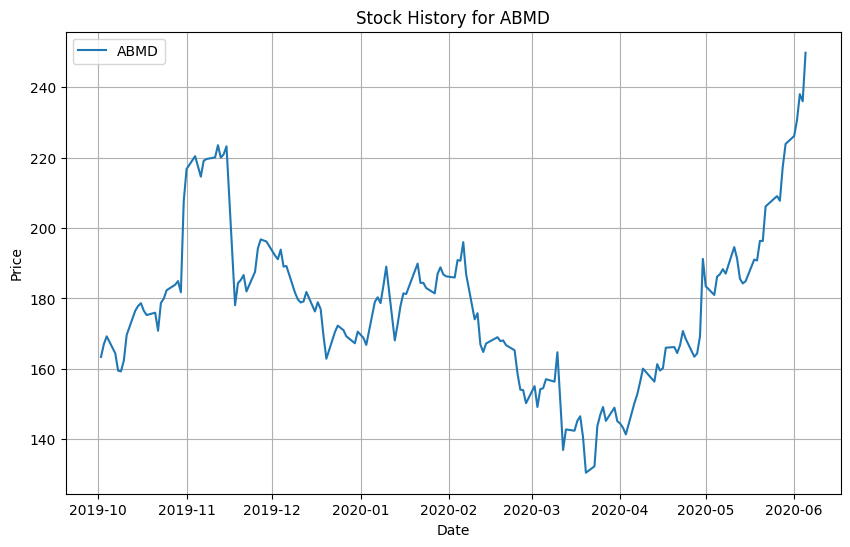

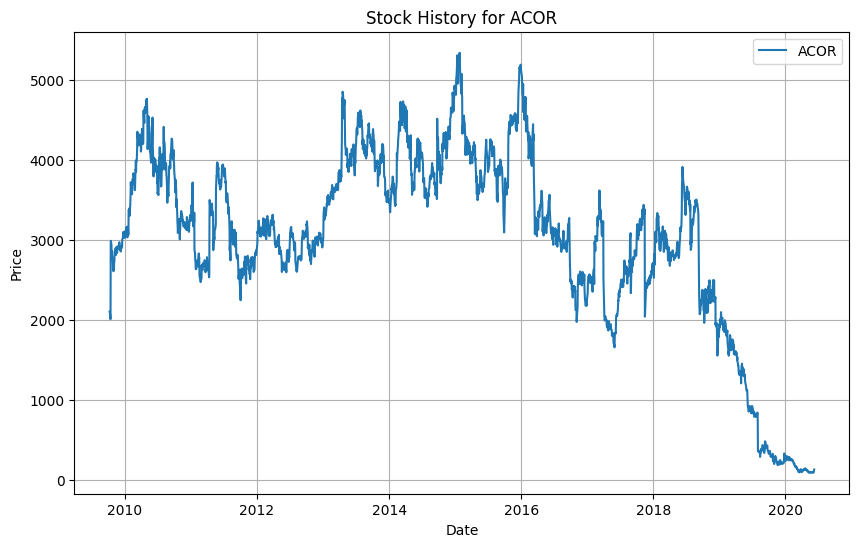

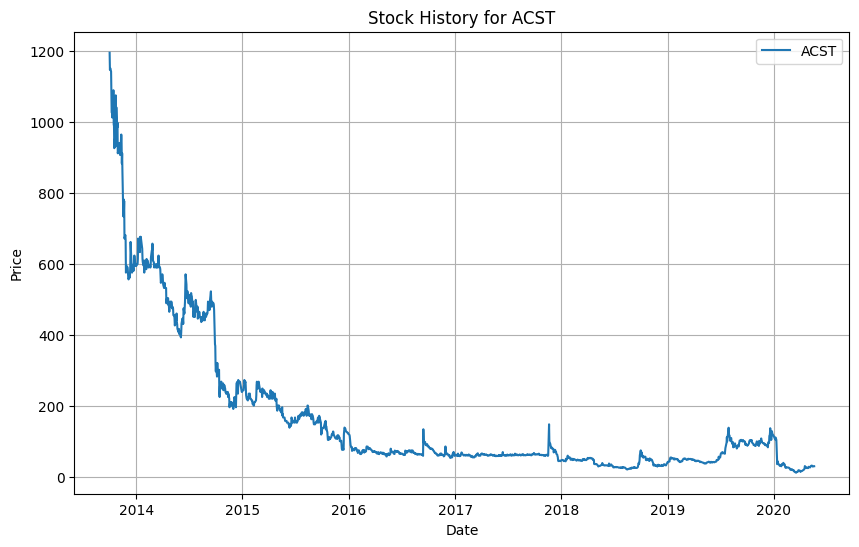

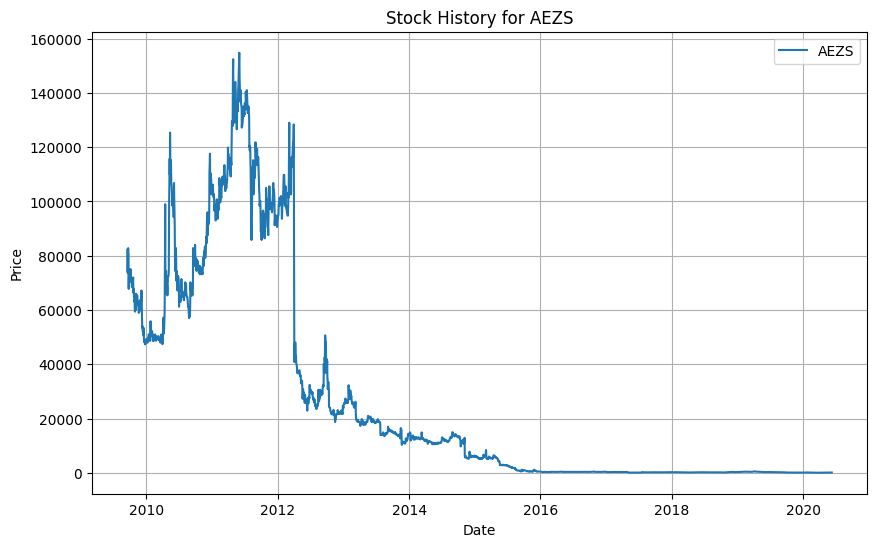

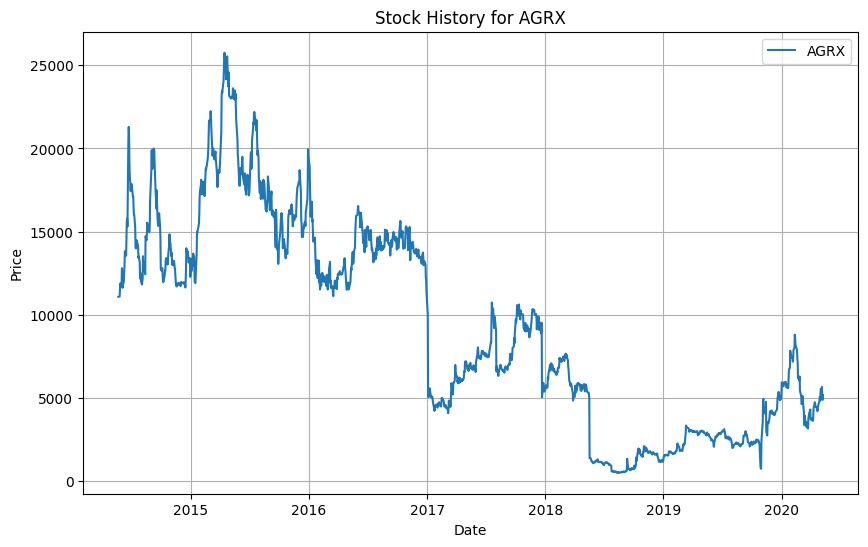

...

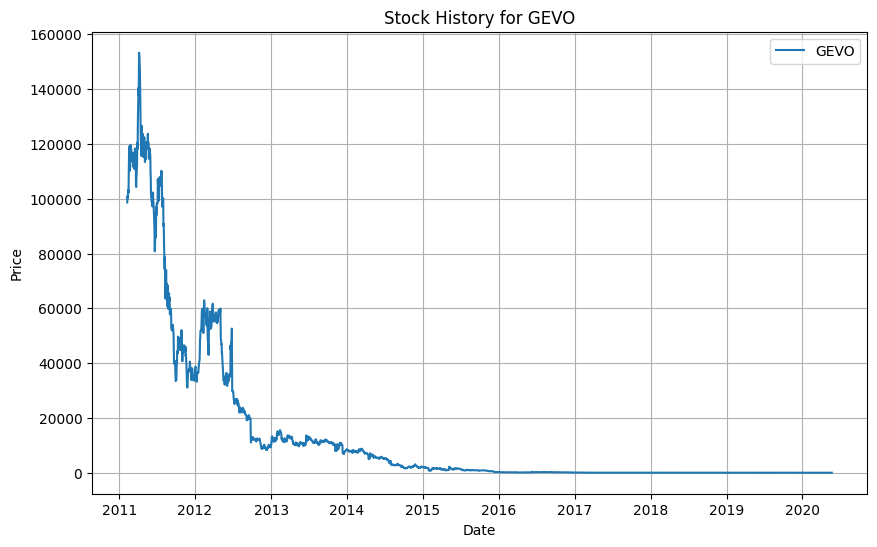

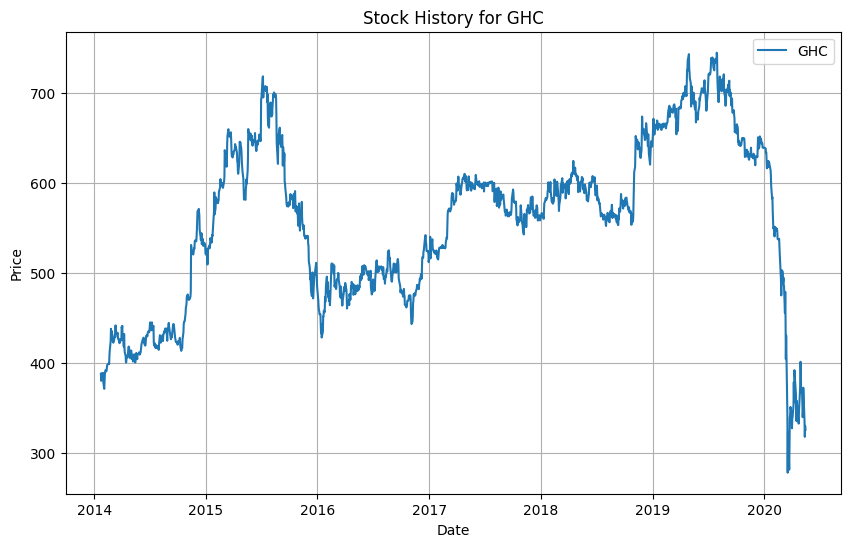

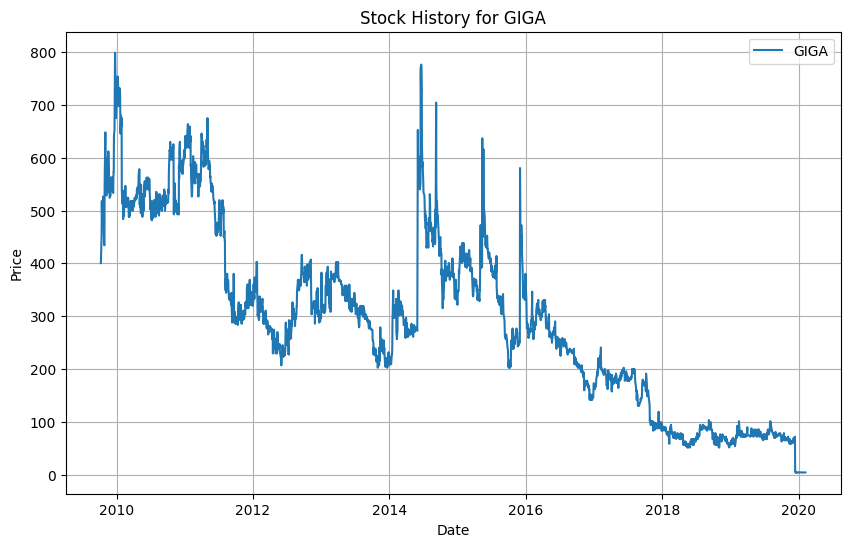

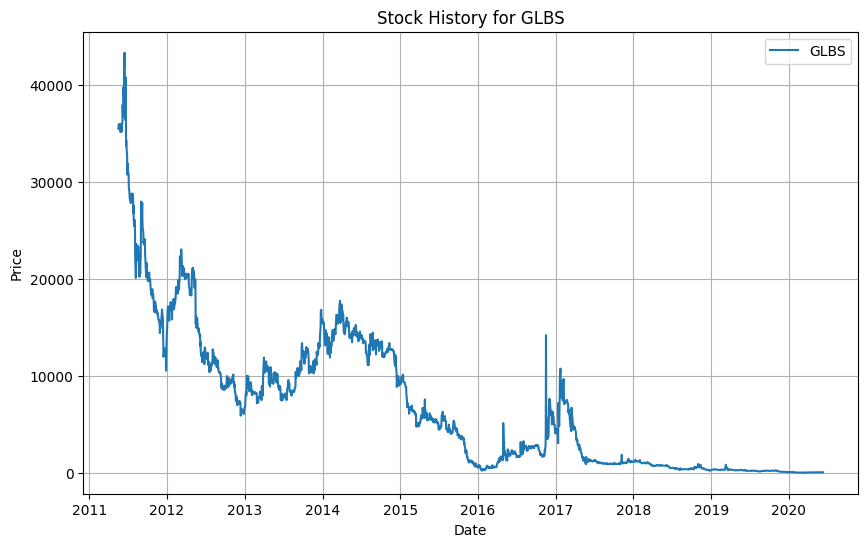

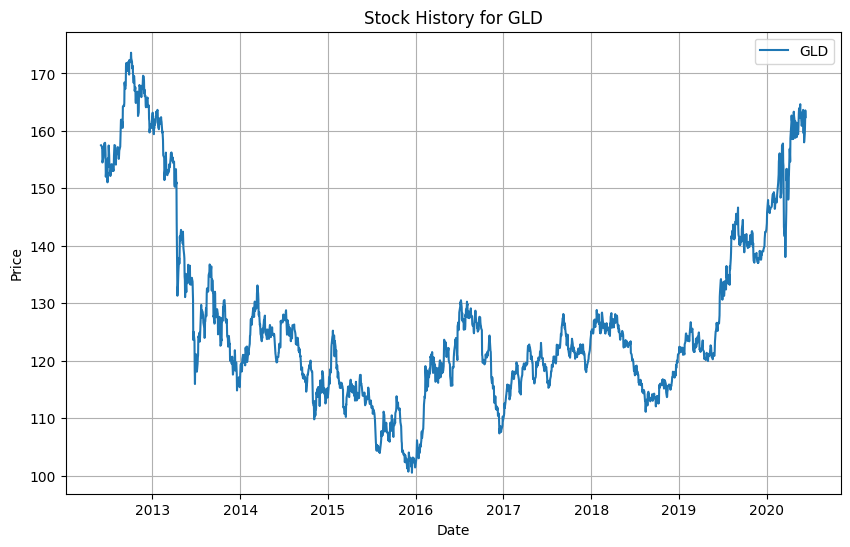

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the fetched stock data from the CSV file
all_stock_data = pd.read_csv("all_stock_data.csv")

# Convert the 'Date' column to datetime objects
all_stock_data['Date'] = pd.to_datetime(all_stock_data['Date'])

# Group the data by 'Symbol' to calculate the average closing price
stock_avg_closing_price = all_stock_data.groupby('Symbol')['Close'].mean()

# Select the top 100 stocks based on average closing price for sample
top_15_stocks = stock_avg_closing_price.nlargest(100)

# Filter the stock data to include only the top 15 stocks
filtered_data = all_stock_data[all_stock_data['Symbol'].isin(top_15_stocks.index)]

# Group the filtered data by 'Symbol' to plot stock history for each company
grouped_data = filtered_data.groupby('Symbol')

# Plot stock history for each of the top 15 stocks
for symbol, data in grouped_data:
    plt.figure(figsize=(10, 6))
    plt.plot(data['Date'], data['Close'], label=symbol)
    plt.title(f'Stock History for {symbol}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

# Task 3

## Install TA-Lib.

In [6]:
!wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
!tar -xzvf ta-lib-0.4.0-src.tar.gz
%cd ta-lib
!./configure --prefix=/usr
!make
!make install
!pip install TA-Lib

--2024-05-04 08:34:58--  http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
Resolving prdownloads.sourceforge.net (prdownloads.sourceforge.net)... 204.68.111.105
Connecting to prdownloads.sourceforge.net (prdownloads.sourceforge.net)|204.68.111.105|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz [following]
--2024-05-04 08:34:58--  http://downloads.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz
Resolving downloads.sourceforge.net (downloads.sourceforge.net)... 204.68.111.105
Reusing existing connection to prdownloads.sourceforge.net:80.
HTTP request sent, awaiting response... 302 Found
Location: http://cytranet-dal.dl.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz?viasf=1 [following]
--2024-05-04 08:34:58--  http://cytranet-dal.dl.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz?viasf=1

## Load your stock price data into a pandas DataFrame.

In [7]:
import yfinance as yf
import pandas as pd

# Define a list of ticker symbols
ticker_symbols = ['AAPL', 'GOOG', 'MSFT', 'AMZN', 'FPF']  # Example list of stock symbols

# Initialize an empty dictionary to store stock data for each symbol
stock_data_dict = {}

# Fetch historical stock data for each symbol
for symbol in ticker_symbols:
    # Fetch historical stock data
    stock_data = yf.download(symbol)

    # Check if the index contains datetime objects
    if isinstance(stock_data.index, pd.DatetimeIndex):
        # Extract the minimum and maximum dates from the DataFrame
        start_date = stock_data.index.min().strftime('%Y-%m-%d')
        end_date = stock_data.index.max().strftime('%Y-%m-%d')

        # Re-fetch historical stock data using the extracted date range
        stock_data_dict[symbol] = yf.download(symbol, start=start_date, end=end_date)
    else:
        print(f"Skipping {symbol}: Index does not contain datetime objects")

# Display the first few rows of the DataFrame for each symbol
for symbol, data in stock_data_dict.items():
    print(f"Stock data for {symbol}:")
    print(data.head())
    print("\n")

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Stock data for AAPL:
                Open      High       Low     Close  Adj Close     Volume
Date                                                                    
1980-12-12  0.128348  0.128906  0.128348  0.128348   0.100764  469033600
1980-12-15  0.122210  0.122210  0.121652  0.121652   0.095508  175884800
1980-12-16  0.113281  0.113281  0.112723  0.112723   0.088498  105728000
1980-12-17  0.115513  0.116071  0.115513  0.115513   0.090688   86441600
1980-12-18  0.118862  0.119420  0.118862  0.118862   0.093317   73449600


Stock data for GOOG:
                Open      High       Low     Close  Adj Close     Volume
Date                                                                    
2004-08-19  2.490664  2.591785  2.390042  2.499133   2.499133  897427216
2004-08-20  2.515820  2.716817  2.503118  2.697639   2.697639  458857488
2004-08-23  2.758411  2.826406  2.716070  2.724787   2.724787  366857939
2004-08-24  2.770615  2.779581  2.579581  2.611960   2.611960  306396159
2004-08

## Apply Analysis Indicators with TA-Lib.

### Calculate moving averages using TA-Lib.

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


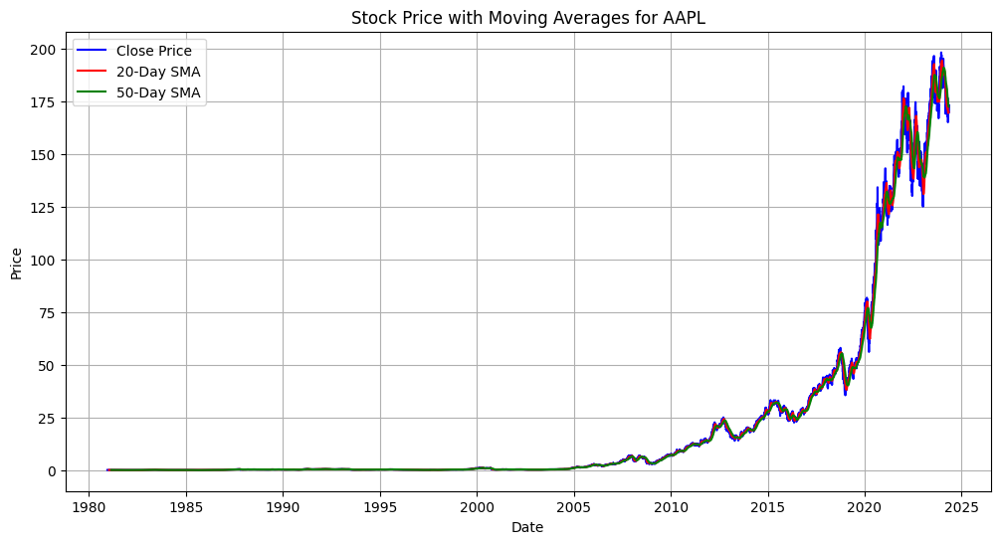

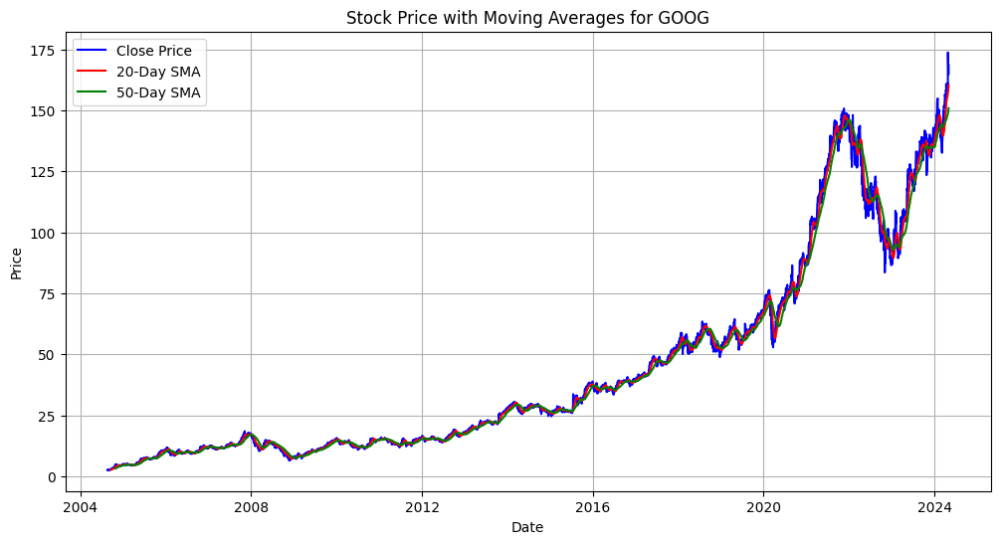

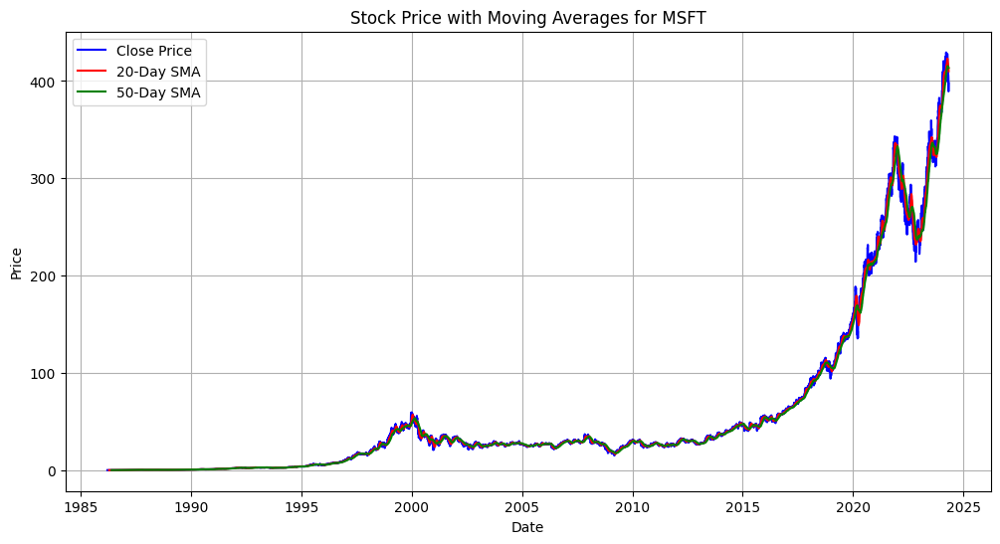

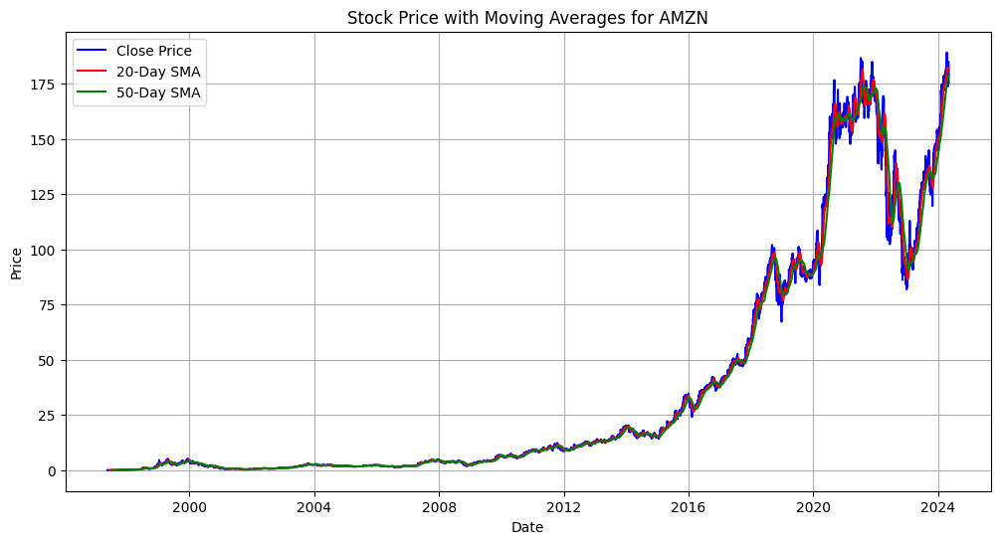

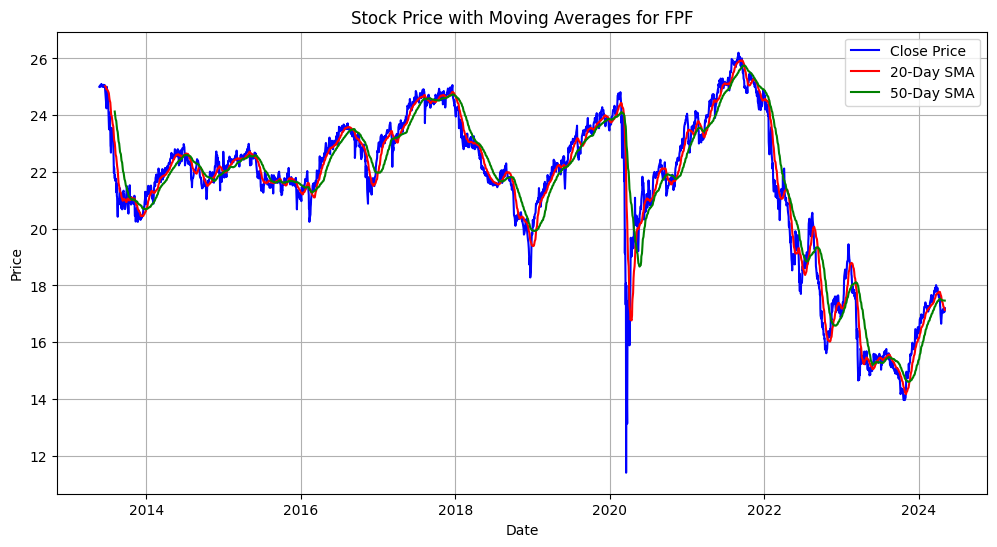

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import talib
import yfinance as yf

# Define a list of ticker symbols
ticker_symbols = ['AAPL', 'GOOG', 'MSFT', 'AMZN', 'FPF']  # Example list of stock symbols

# Initialize an empty dictionary to store stock data for each symbol
stock_data_dict = {}

# Fetch historical stock data for each symbol
for symbol in ticker_symbols:
    # Fetch historical stock data
    stock_data = yf.download(symbol)

    # Check if the index contains datetime objects
    if isinstance(stock_data.index, pd.DatetimeIndex):
        # Extract the minimum and maximum dates from the DataFrame
        start_date = stock_data.index.min().strftime('%Y-%m-%d')
        end_date = stock_data.index.max().strftime('%Y-%m-%d')

        # Re-fetch historical stock data using the extracted date range
        stock_data_dict[symbol] = yf.download(symbol, start=start_date, end=end_date)
    else:
        print(f"Skipping {symbol}: Index does not contain datetime objects")

# Calculate moving averages for each symbol and plot the results
for symbol, stock_data in stock_data_dict.items():
    # Calculate moving averages using TA-Lib
    stock_data['SMA_20'] = talib.SMA(stock_data['Close'], timeperiod=20)
    stock_data['SMA_50'] = talib.SMA(stock_data['Close'], timeperiod=50)

    # Plot the stock price along with the moving averages
    plt.figure(figsize=(12, 6))
    plt.plot(stock_data.index, stock_data['Close'], label='Close Price', color='blue')
    plt.plot(stock_data.index, stock_data['SMA_20'], label='20-Day SMA', color='red')
    plt.plot(stock_data.index, stock_data['SMA_50'], label='50-Day SMA', color='green')
    plt.title(f'Stock Price with Moving Averages for {symbol}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

### Calculate RSI and MACD.

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


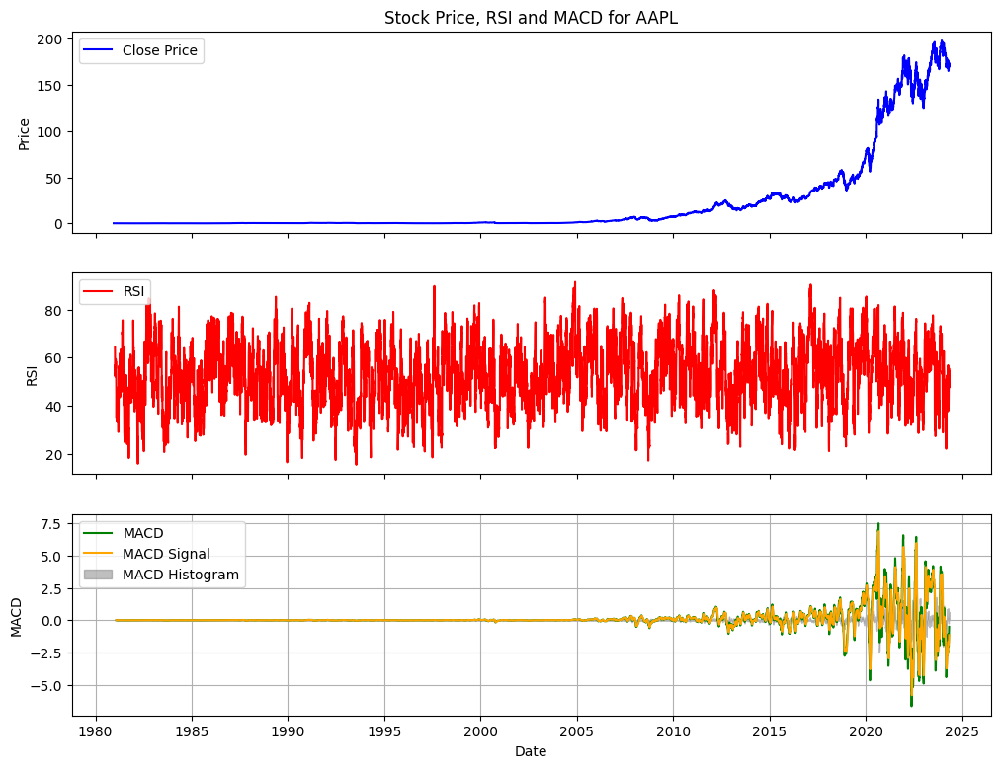

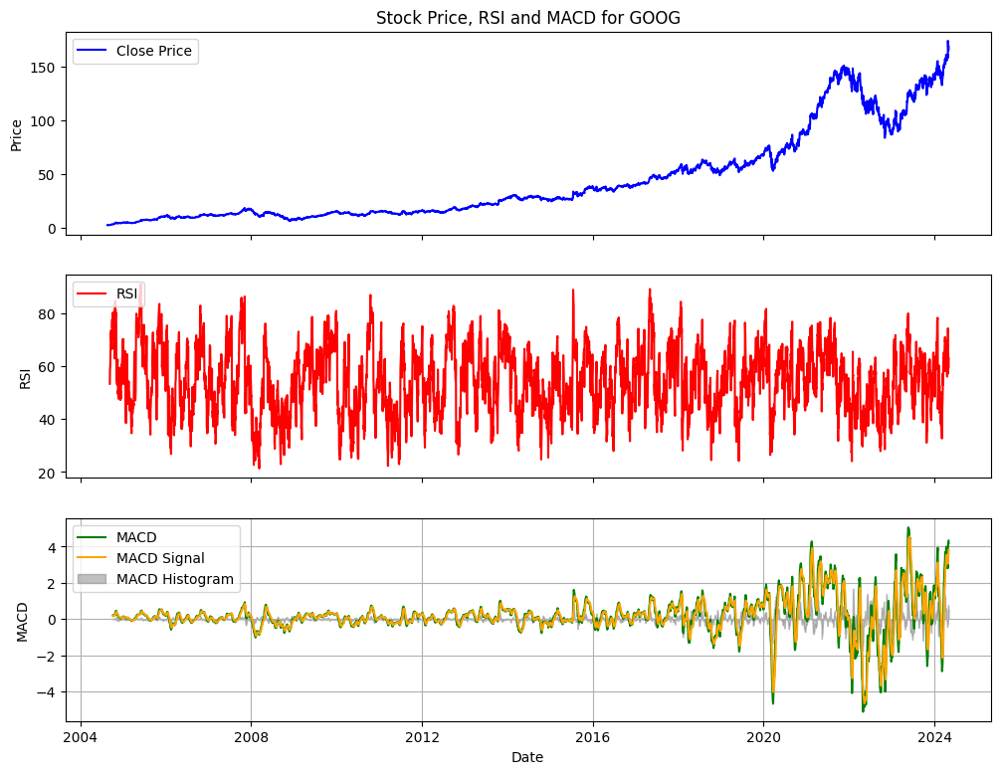

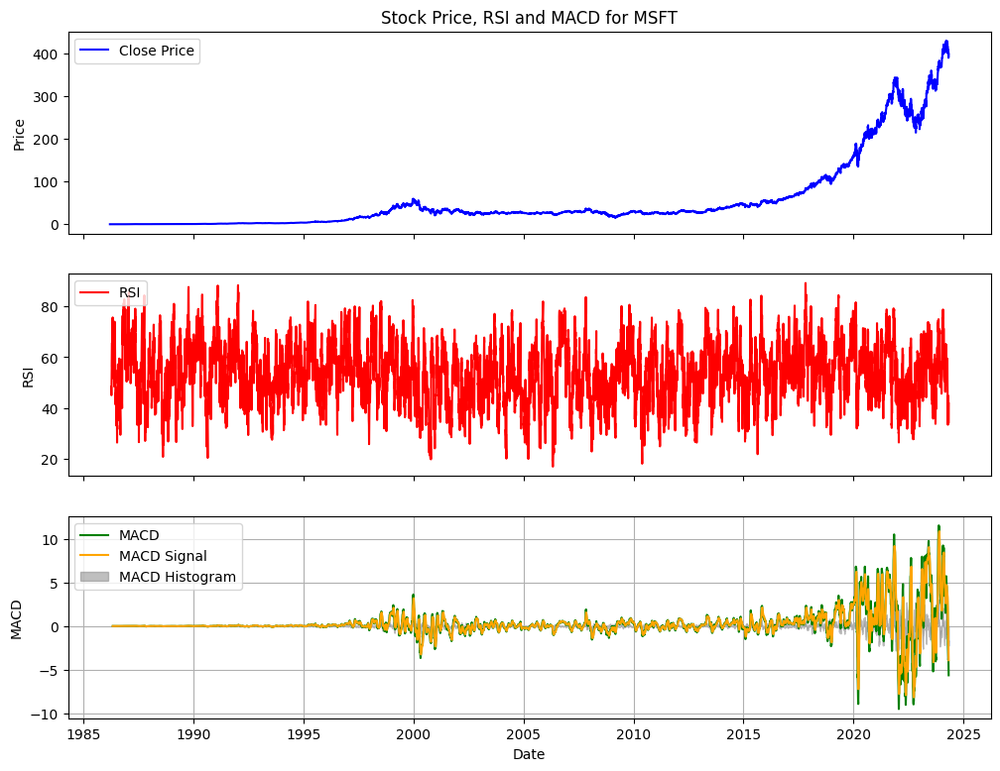

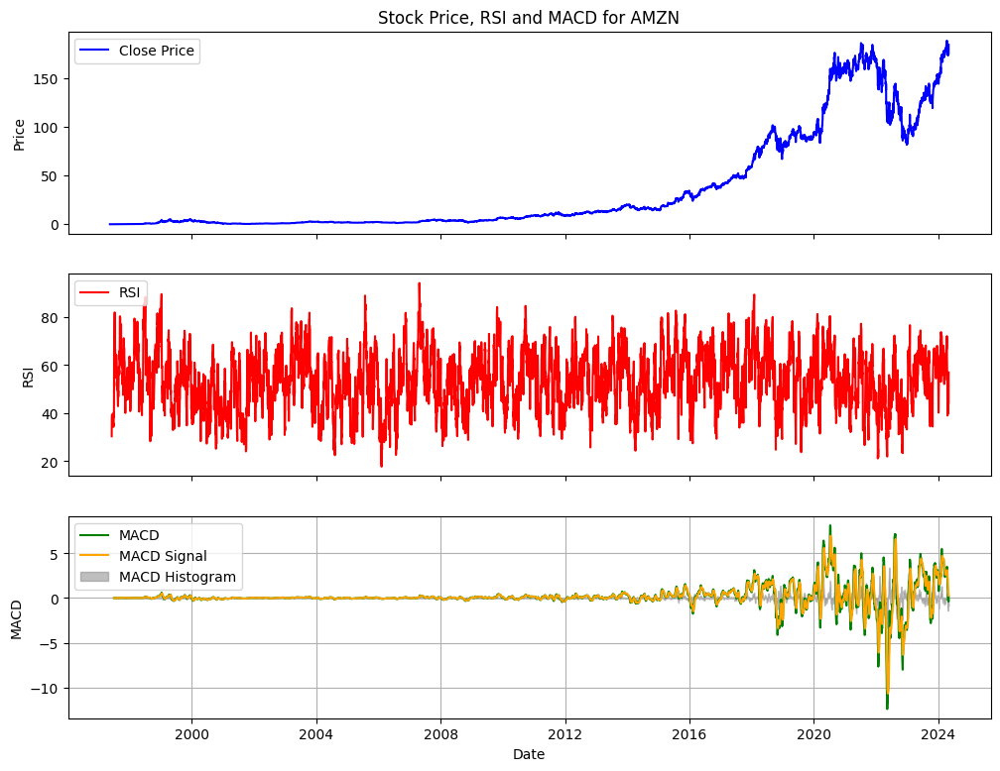

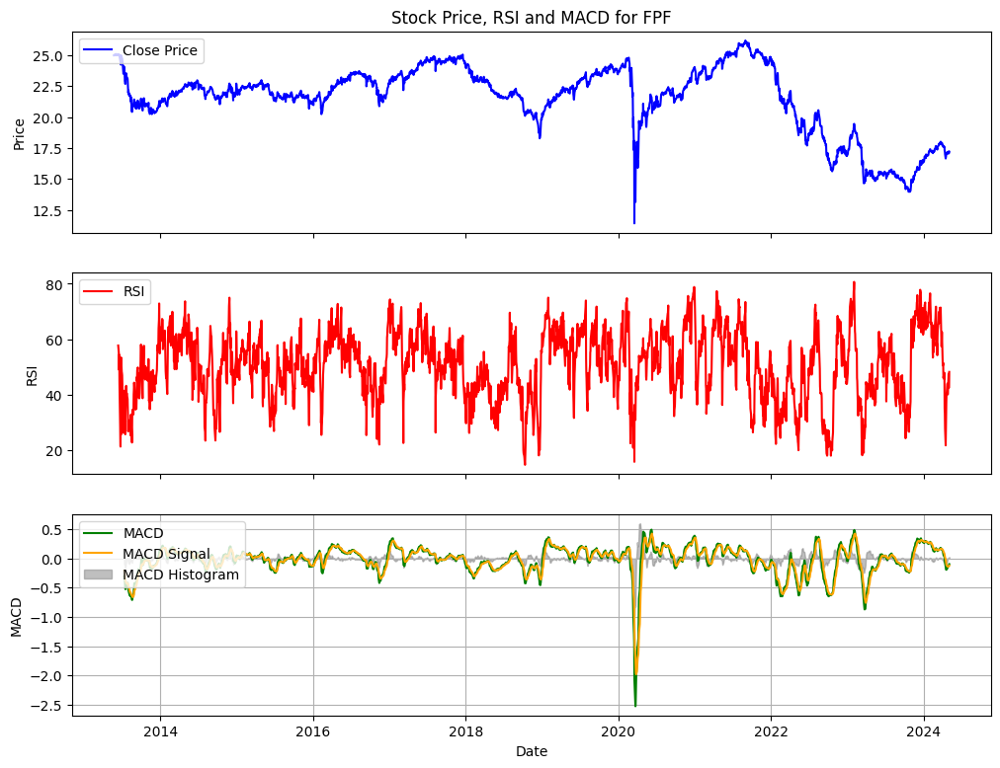

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import talib
import yfinance as yf

# Define a list of ticker symbols
ticker_symbols = ['AAPL', 'GOOG', 'MSFT', 'AMZN', 'FPF']  # Example list of stock symbols

# Initialize an empty dictionary to store stock data for each symbol
stock_data_dict = {}

# Fetch historical stock data for each symbol
for symbol in ticker_symbols:
    # Fetch historical stock data
    stock_data = yf.download(symbol)

    # Check if the index contains datetime objects
    if isinstance(stock_data.index, pd.DatetimeIndex):
        # Extract the minimum and maximum dates from the DataFrame
        start_date = stock_data.index.min().strftime('%Y-%m-%d')
        end_date = stock_data.index.max().strftime('%Y-%m-%d')

        # Re-fetch historical stock data using the extracted date range
        stock_data_dict[symbol] = yf.download(symbol, start=start_date, end=end_date)
    else:
        print(f"Skipping {symbol}: Index does not contain datetime objects")

# Calculate RSI and MACD for each symbol and plot the results
for symbol, stock_data in stock_data_dict.items():
    # Calculate RSI using TA-Lib
    stock_data['RSI'] = talib.RSI(stock_data['Close'], timeperiod=14)

    # Calculate MACD using TA-Lib
    stock_data['MACD'], stock_data['MACD_Signal'], stock_data['MACD_Hist'] = talib.MACD(stock_data['Close'])

    # Plot the stock price along with the RSI and MACD
    fig, (ax1, ax2, ax3) = plt.subplots(3, sharex=True, figsize=(12, 9))
    ax1.plot(stock_data.index, stock_data['Close'], label='Close Price', color='blue')
    ax1.set_title(f'Stock Price, RSI and MACD for {symbol}')
    ax1.set_ylabel('Price')

    ax2.plot(stock_data.index, stock_data['RSI'], label='RSI', color='red')
    ax2.set_ylabel('RSI')

    ax3.plot(stock_data.index, stock_data['MACD'], label='MACD', color='green')
    ax3.plot(stock_data.index, stock_data['MACD_Signal'], label='MACD Signal', color='orange')
    ax3.fill_between(stock_data.index, stock_data['MACD_Hist'], color='grey', alpha=0.5, label='MACD Histogram')
    ax3.set_ylabel('MACD')

    ax1.legend(loc='upper left')
    ax2.legend(loc='upper left')
    ax3.legend(loc='upper left')
    plt.xlabel('Date')
    plt.grid(True)
    plt.show()

In [10]:
# Define a list of ticker symbols
ticker_symbols = ['AAPL', 'GOOG', 'MSFT', 'AMZN', 'FPF']  # Example list of stock symbols

# Initialize an empty dictionary to store stock data for each symbol
stock_data_dict = {}

# Fetch historical stock data for each symbol
for symbol in ticker_symbols:
    # Fetch historical stock data
    stock_data = yf.download(symbol)

    # Check if the index contains datetime objects
    if isinstance(stock_data.index, pd.DatetimeIndex):
        # Extract the minimum and maximum dates from the DataFrame
        start_date = stock_data.index.min().strftime('%Y-%m-%d')
        end_date = stock_data.index.max().strftime('%Y-%m-%d')

        # Re-fetch historical stock data using the extracted date range
        stock_data_dict[symbol] = yf.download(symbol, start=start_date, end=end_date)
    else:
        print(f"Skipping {symbol}: Index does not contain datetime objects")

# Display the first few rows of the DataFrame for each symbol
for symbol, data in stock_data_dict.items():
    print(f"Stock data for {symbol}:")
    print(data.head())
    print("\n")

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Stock data for AAPL:
                Open      High       Low     Close  Adj Close     Volume
Date                                                                    
1980-12-12  0.128348  0.128906  0.128348  0.128348   0.100764  469033600
1980-12-15  0.122210  0.122210  0.121652  0.121652   0.095508  175884800
1980-12-16  0.113281  0.113281  0.112723  0.112723   0.088498  105728000
1980-12-17  0.115513  0.116071  0.115513  0.115513   0.090688   86441600
1980-12-18  0.118862  0.119420  0.118862  0.118862   0.093317   73449600


Stock data for GOOG:
                Open      High       Low     Close  Adj Close     Volume
Date                                                                    
2004-08-19  2.490664  2.591785  2.390042  2.499133   2.499133  897427216
2004-08-20  2.515820  2.716817  2.503118  2.697639   2.697639  458857488
2004-08-23  2.758411  2.826406  2.716070  2.724787   2.724787  366857939
2004-08-24  2.770615  2.779581  2.579581  2.611960   2.611960  306396159
2004-08

### Use PyNance for Financial Metrics

### Install the pynance package:

In [11]:
!pip install pynance

In [15]:
import pynance as pn

# Fetch financial data for a single symbol
financial_data = pn.data.get('AAPL')

# Print the columns of the financial_data DataFrame
print(financial_data.columns)

Index(['Open', 'High', 'Low', 'Close', 'Volume'], dtype='object')


In [20]:
import pynance as pn
import pandas as pd

# Define a list of ticker symbols
ticker_symbols = ['AAPL', 'GOOG', 'MSFT', 'AMZN', 'FPF']  # Example list of stock symbols

# Initialize an empty DataFrame to store financial metrics for each symbol
financial_metrics_df = pd.DataFrame()

# Fetch financial metrics for each symbol
for symbol in ticker_symbols:
    # Fetch financial data
    financial_data = pn.data.get(symbol)

    # Check if 'Close' column exists in financial_data
    if 'Close' in financial_data.columns:
        # Calculate financial metrics
        metrics = {
            'symbol': symbol,
            'mean': financial_data['Close'].mean(),
            'std_dev': financial_data['Close'].std(),
            'variance': financial_data['Close'].var(),
        }

        # Append the metrics to the DataFrame
        financial_metrics_df = pd.concat([financial_metrics_df, pd.DataFrame([metrics])], ignore_index=True)
    else:
        print(f"Close column not found for symbol {symbol}")

# Set the symbol as the index of the DataFrame
financial_metrics_df.set_index('symbol', inplace=True)

print(financial_metrics_df)

              mean    std_dev     variance
symbol                                    
AAPL    131.315306  43.792975  1917.824700
GOOG    104.907077  30.492921   929.818201
MSFT    253.782174  77.598451  6021.519623
AMZN    133.421108  30.977286   959.592241
FPF      18.573958   2.483586     6.168201


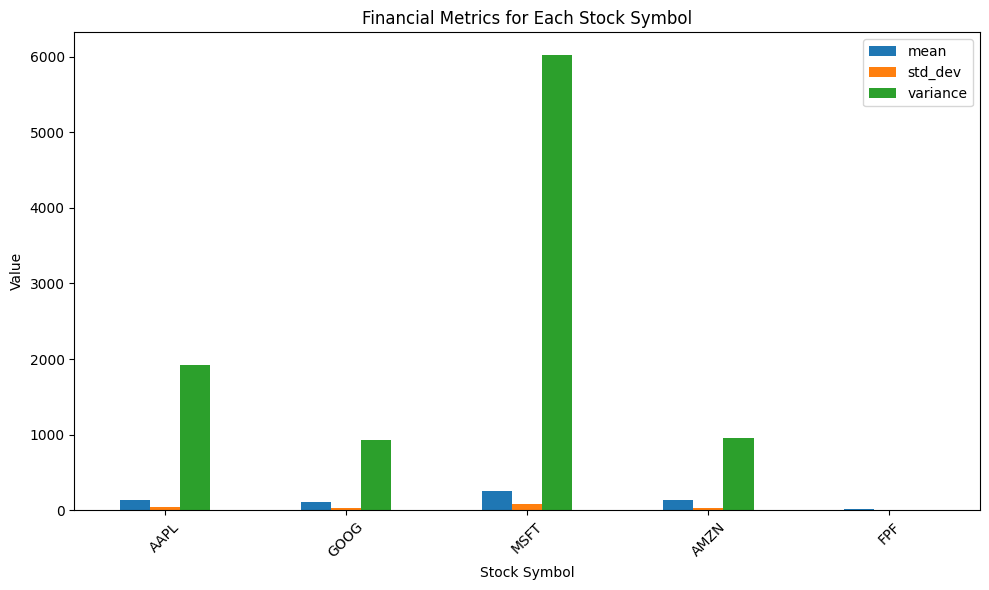

In [21]:
import pynance as pn
import pandas as pd
import matplotlib.pyplot as plt

# Define a list of ticker symbols
ticker_symbols = ['AAPL', 'GOOG', 'MSFT', 'AMZN', 'FPF']  # Example list of stock symbols

# Initialize an empty DataFrame to store financial metrics for each symbol
financial_metrics_df = pd.DataFrame()

# Fetch financial metrics for each symbol
for symbol in ticker_symbols:
    # Fetch financial data
    financial_data = pn.data.get(symbol)

    # Check if 'Close' column exists in financial_data
    if 'Close' in financial_data.columns:
        # Calculate financial metrics
        metrics = {
            'symbol': symbol,
            'mean': financial_data['Close'].mean(),
            'std_dev': financial_data['Close'].std(),
            'variance': financial_data['Close'].var(),
        }

        # Append the metrics to the DataFrame
        financial_metrics_df = pd.concat([financial_metrics_df, pd.DataFrame([metrics])], ignore_index=True)
    else:
        print(f"Close column not found for symbol {symbol}")

# Set the symbol as the index of the DataFrame
financial_metrics_df.set_index('symbol', inplace=True)

# Plotting the financial metrics
financial_metrics_df.plot(kind='bar', figsize=(10, 6))
plt.title('Financial Metrics for Each Stock Symbol')
plt.xlabel('Stock Symbol')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

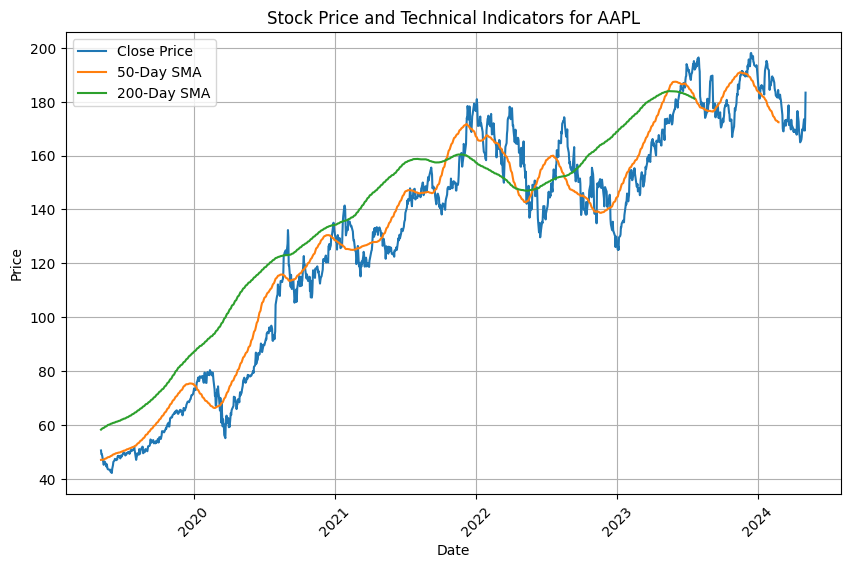

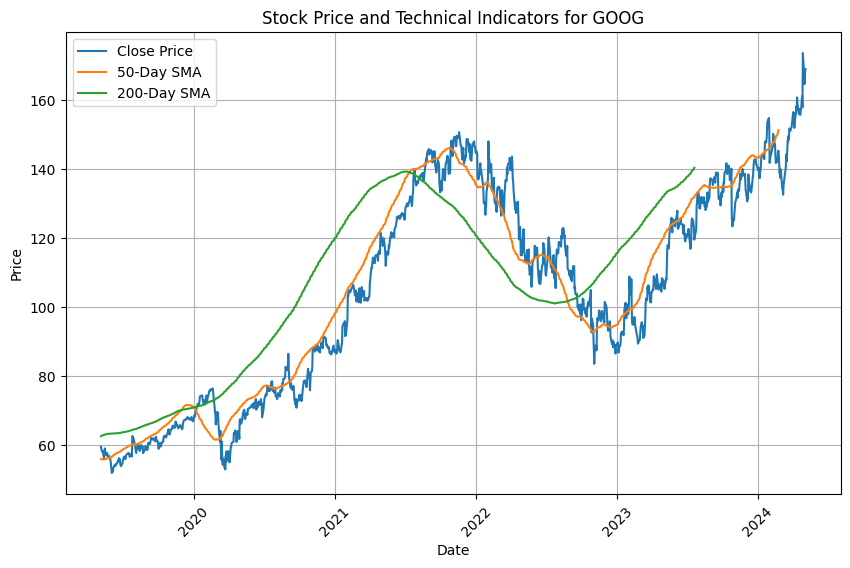

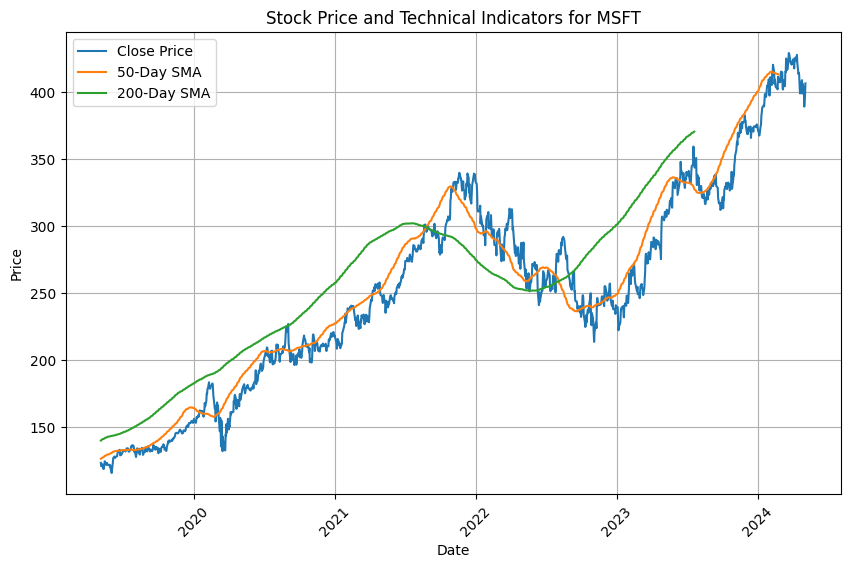

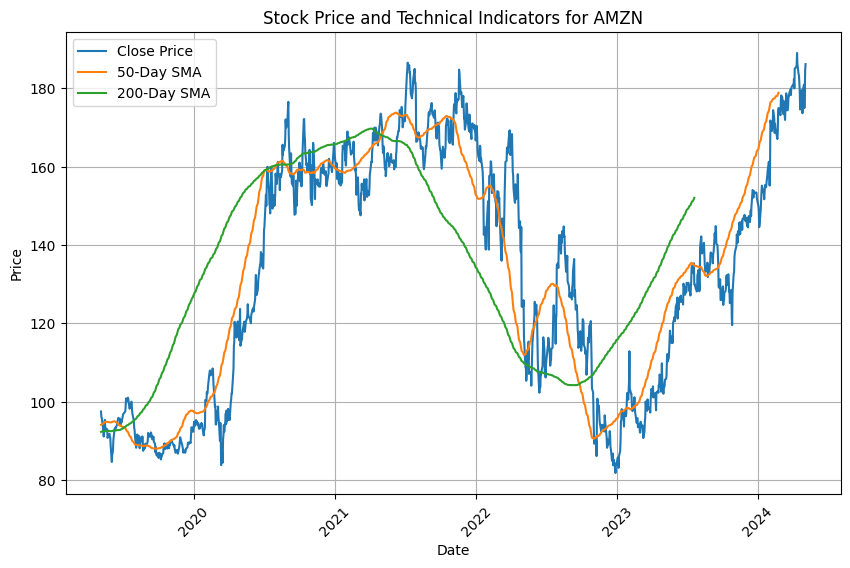

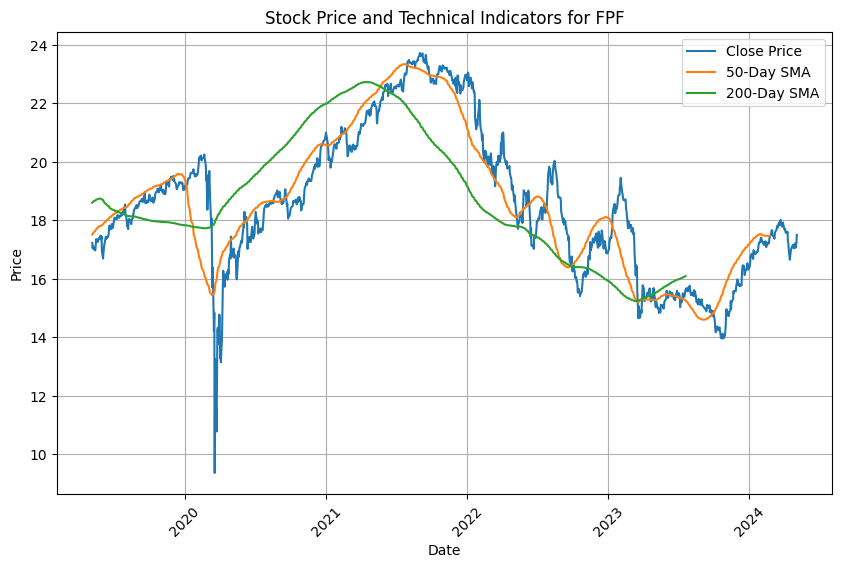

In [23]:
import pynance as pn
import pandas as pd
import matplotlib.pyplot as plt

# Define a function to calculate technical indicators
def calculate_technical_indicators(data):
    # Calculate 50-day and 200-day moving averages
    data['SMA_50'] = data['Close'].rolling(window=50).mean()
    data['SMA_200'] = data['Close'].rolling(window=200).mean()

    # Calculate Relative Strength Index (RSI)
    delta = data['Close'].diff(1)
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    RS = gain / loss
    data['RSI'] = 100 - (100 / (1 + RS))

    return data

# Define a list of ticker symbols
ticker_symbols = ['AAPL', 'GOOG', 'MSFT', 'AMZN', 'FPF']  # Example list of stock symbols

# Initialize an empty DataFrame to store stock data
stock_data_df = pd.DataFrame()

# Fetch stock data for each symbol
for symbol in ticker_symbols:
    # Fetch historical stock data
    stock_data = pn.data.get(symbol)

    # Calculate technical indicators
    stock_data = calculate_technical_indicators(stock_data)

    # Add symbol column
    stock_data['Symbol'] = symbol

    # Append the data to the DataFrame
    stock_data_df = pd.concat([stock_data_df, stock_data])

# Plotting the stock price along with technical indicators
for symbol in ticker_symbols:
    subset_data = stock_data_df[stock_data_df['Symbol'] == symbol]
    plt.figure(figsize=(10, 6))
    plt.plot(subset_data.index, subset_data['Close'], label='Close Price')
    plt.plot(subset_data.index, subset_data['SMA_50'], label='50-Day SMA')
    plt.plot(subset_data.index, subset_data['SMA_200'], label='200-Day SMA')
    plt.legend()
    plt.title(f'Stock Price and Technical Indicators for {symbol}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

# Assessing completeness and accuracy
# You can visually inspect the plots to assess the completeness and accuracy of the analysis.
# Check if the technical indicators make sense in relation to the stock price movements.
# Ensure that the indicators are calculated correctly and provide meaningful insights into the stock behavior.

# Additionally, you can compute statistical metrics such as correlation coefficients
# between the indicators and stock prices to quantify their accuracy.

# For further analysis, you may want to explore more advanced technical indicators
# and conduct deeper exploratory data analysis to gain insights into the data and its impact on stock prices.